In [1]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import fsspec, os
import scipy as sp
import PIL
from PIL import Image
import random
import os
import glob
import re

In [2]:
# Parameters
state = None
selected_data_type = None
RESERVED_SHOT = None
EPOCH_NUM = None
VALIDATION_SPLIT = None
ACTIVATION_FUNC = None
LOSS_FUNC = None
OPTIMIZER_FUNC = None
OUTLIER_CUTOFF = None
NUM_CONV2D_LAYERS = None
NUM_DENSE_LAYERS = None
CONV2D_NEURONS = None
CONV2D_SIZE = None
DENSE_LAYER_NEURONS = None
MAX_POOLING_SIZE = None

In [3]:
# Parameters
state = 3
selected_data_type = "ma2"
RESERVED_SHOT = 119671
EPOCH_NUM = 50
VALIDATION_SPLIT = 0.1
ACTIVATION_FUNC = "relu"
LOSS_FUNC = "mse"
OPTIMIZER_FUNC = "sgd"
OUTLIER_CUTOFF = 94.0
NUM_CONV2D_LAYERS = 2
NUM_DENSE_LAYERS = 1
CONV2D_NEURONS = [64, 64]
CONV2D_SIZE = ["(7, 7)", "(4, 4)"]
DENSE_LAYER_NEURONS = [32]
MAX_POOLING_SIZE = "(4, 4)"


In [4]:
# Manual override logic
manual = False  # Toggle this to True to use manual values, False to skip

if manual:
    state = 3  # state 1, 2, or 3
    selected_data_type = 'ma2'  # ma2 basically always
    if state == 1:
        RESERVED_SHOT = 119671  # for state 1
    elif state == 2:
        RESERVED_SHOT = 114458  # for state 2
    else:
        RESERVED_SHOT = 119671  # Default for state 3 (choosing one from RESERVED_SHOTS[3])
    EPOCH_NUM = 15  # 15
    VALIDATION_SPLIT = 0.2  # 0.2
    ACTIVATION_FUNC = 'relu'  # 'relu'
    LOSS_FUNC = 'mae'  # 'mae'
    OPTIMIZER_FUNC = 'adam'  # 'adam'
    OUTLIER_CUTOFF = 99  # 99
    NUM_CONV2D_LAYERS = 2  # 2 Conv2D layers
    NUM_DENSE_LAYERS = 1  # 1 dense layer
    CONV2D_NEURONS = [16, 16]  # Neurons per Conv2D layer
    CONV2D_SIZE = [(8, 8), (8, 8)]  # Kernel sizes for Conv2D layers
    DENSE_LAYER_NEURONS = [10]  # Neurons for dense layer
    MAX_POOLING_SIZE = (4, 4)  # Max pooling size

    # Update parameters dictionary for Papermill
    parameters = {
        'state': state,
        'selected_data_type': selected_data_type,
        'RESERVED_SHOT': RESERVED_SHOT,
        'EPOCH_NUM': EPOCH_NUM,
        'VALIDATION_SPLIT': VALIDATION_SPLIT,
        'ACTIVATION_FUNC': ACTIVATION_FUNC,
        'LOSS_FUNC': LOSS_FUNC,
        'OPTIMIZER_FUNC': OPTIMIZER_FUNC,
        'OUTLIER_CUTOFF': OUTLIER_CUTOFF,
        'NUM_CONV2D_LAYERS': NUM_CONV2D_LAYERS,
        'NUM_DENSE_LAYERS': NUM_DENSE_LAYERS,
        'CONV2D_NEURONS': CONV2D_NEURONS,
        'CONV2D_SIZE': CONV2D_SIZE,
        'DENSE_LAYER_NEURONS': DENSE_LAYER_NEURONS,
        'MAX_POOLING_SIZE': MAX_POOLING_SIZE
    }

In [5]:
# Define shot lists and file paths
#state = 1  # state 1 -> javier, state 2 -> william, state 3 -> combined
if state == 1:
    shot_list = [119591, 119599, 119601, 119646, 119648, 119653, 119654, 119658, 119659,
             119661, 119662, 119663, 119665, 119666, 119667, 119669, 119670, 119671,
             119673, 119675, 119748, 119750, 119751, 119752, 119754, 119755, 119756,
             119757, 119760, 119761, 119762, 119763, 119764, 119766, 119767, 119768, 119769]
    file_path = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Shots/' 
    file_path_hbt = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/python_hbteplib_data/'
elif state == 2:
    shot_list = [114407,114408,114411,114412,114413,114415,114416,114417,114418,114419,114420,114422,114424,114425,114428,114429,114431,114432,114433,
                 114434,114435,114436,114438,114439,114441,114443,114444,114445,114448,114450,114451,114453,114454,114455,114456,114457,114458,114460,
                 114462,114464,114467,114468,114472,114473]
    file_path = '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Old Shots/' 
    file_path_hbt = '//Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/oldshot_python_hbteplib_data/' 
elif state == 3:
    shot_list = [119591, 119599, 119601, 119646, 119648, 119653, 119654, 119658, 119659,
             119661, 119662, 119663, 119665, 119666, 119667, 119669, 119670, 119671,
             119673, 119675, 119748, 119750, 119751, 119752, 119754, 119755, 119756,
             119757, 119760, 119761, 119762, 119763, 119764, 119766, 119767, 119768, 119769,
             114407,114408,114411,114412,114413,114415,114416,114417,114418,114419,114420,114422,114424,114425,114428,114429,114431,114432,114433,
             114434,114435,114436,114438,114439,114441,114443,114444,114445,114448,114450,114451,114453,114454,114455,114456,114457,114458,114460,
             114462,114464,114467,114468,114472,114473]
    # For shots >= 119000, use Javier's paths
    # For shots < 119000, use William's paths
def get_paths_for_shot(shot_num):
        if shot_num >= 119000:
            return ('/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Shots/',
                   '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/python_hbteplib_data/')
        else:
            return ('/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/Input Data/Old Shots/',
                   '/Users/aboeckmann/Documents/Columbia/PlasmaLab/HBT-EP-Boeckmann/HighFreqMLModeling/Training/oldshot_python_hbteplib_data/')
 
#selected_data_type = 'ma4'  # Options: 'ma1', 'ma2', 'ma3', 'ma4', 'mp1', 'mp2', 'mp3', 'mp4'
# Notebook type definition
notebook_type = 'untrimmed'  # Set to 'trimmed' or 'untrimmed' based on the notebook
TARGET_FRAME_COUNT = 800
CAMERA_DEPTH = 65535.0 # 2^16
#RESERVED_SHOT = 119671  # Set to a specific shot number or None for random selection

In [6]:
# Helper functions for data processing
def determine_frame_ratio(num_frames, target_frames=TARGET_FRAME_COUNT):
    """
    Determines the frame ratio needed to downsample the data to target_frames.
    Returns the ratio and the actual number of frames after downsampling.
    """
    ratio = max(1, num_frames // target_frames)
    actual_frames = num_frames // ratio
    return ratio, actual_frames

def process_shot_data(folder_path, target_frame_count, max_pixel_value, state, shot_num=None):
    """
    Process a single shot's data with automatic frame rate handling.
    Returns: 2D data (32x32), cut 2D data (32x32), and flat data for the shot
    """
    tiff_files = sorted(glob.glob(os.path.join(folder_path, "*.tiff")))
    num_frames = len(tiff_files)
    
    if num_frames == 0:
        raise ValueError(f"No TIFF files found in {folder_path}")
    
    frame_ratio, actual_frames = determine_frame_ratio(num_frames, target_frame_count)
    
    # Initialize shot lists
    flat_shot = []
    shot_2d = []
    cut_shot = []
    
    # Process TIFF files with dynamic frame ratio
    for j, tiff_file in enumerate(tiff_files):
        if j % frame_ratio == 0 and len(shot_2d) < target_frame_count:
            try:
                im = Image.open(tiff_file)
                im = np.array(im, dtype=np.float32)
                im = im / max_pixel_value
                
                # Automatically crop the center 32x32 region of the image
                h, w = im.shape
                if h < 32 or w < 32:
                    raise ValueError(f"Image too small to crop to 32x32: got {h}x{w}")

                start_h = (h - 32) // 2
                start_w = (w - 32) // 2
                cropped_im = im[start_h:start_h + 32, start_w:start_w + 32]

                
                flat_im = cropped_im.reshape(-1)  # Flatten the cropped image (32*32 = 1024)
                cut_2d = cropped_im  # cut_2d is the same as cropped_im (32x32)
                
                shot_2d.append(cropped_im)  # Store cropped image (32x32)
                flat_shot.append(flat_im)
                cut_shot.append(cut_2d)
                
            except Exception as e:
                print(f"Error loading {tiff_file}: {e}")
                continue
    
    return np.array(shot_2d), np.array(cut_shot), np.array(flat_shot)
    
def process_all_shots(shot_list, base_path, max_pixel_value, target_frame_count, state):
    """
    Process multiple shots with automatic frame rate handling
    """
    training_data_2D = []
    cut_training_data_2D = []
    flat_training_data = []
    valid_shots = []
    
    for shot in shot_list:
        if shot == RESERVED_SHOT:
            continue
        if state == 3:
            file_path, _ = get_paths_for_shot(shot)
            folder_path = os.path.join(file_path, str(shot), 'CAM-26731/tiff/')
        else:
            folder_path = os.path.join(base_path, str(shot), 'CAM-26731/tiff/')
        
        try:
            shot_2d, cut_2d, flat_data = process_shot_data(folder_path, target_frame_count, max_pixel_value, state, shot_num=shot)
            
            if len(shot_2d) == target_frame_count:
                training_data_2D.append(shot_2d)
                cut_training_data_2D.append(cut_2d)
                flat_training_data.append(flat_data)
                valid_shots.append(shot)
            else:
                print(f"Shot {shot} produced {len(shot_2d)} frames, expected {target_frame_count}. Skipping.")
                
        except Exception as e:
            print(f"Error processing shot {shot}: {e}")
            continue
    
    return (np.array(training_data_2D), 
            np.array(cut_training_data_2D), 
            np.array(flat_training_data), valid_shots)

In [7]:
# Load and format HBT data
def format_hbt_data(data, mode_num):
    # Determine frame ratio
    original_length = data[0][0].shape[0] # 5000
    target_length = TARGET_FRAME_COUNT
    frame_ratio = original_length // target_length  # generally 5 (5000/TARGET_FRAME_COUNT)
    
    data = np.asarray(data, dtype=float)
    data = np.reshape(data[:,mode_num-1,:], (len(data), original_length, 1))
    data = data[:,::frame_ratio,:]
    data = data[:,:target_length,:]
    return data

# Load HBT data
hbt_ma_data = []
hbt_mp_data = []
hbt_time_data = []
valid_shots_hbt = []
for i in range(len(shot_list)):
    shot = shot_list[i]
    if state == 3:
        _, file_path_hbt = get_paths_for_shot(shot)
    else:
        file_path_hbt = file_path_hbt
        
    try:
        ma_list = []
        mp_list = []
        for j in range(1,5):
            ma_data = np.load(os.path.join(file_path_hbt, f'{shot}m{j}Amp.npy'))
            mp_data = np.load(os.path.join(file_path_hbt, f'{shot}m{j}Phase.npy'))
            ma_list.append(ma_data)
            mp_list.append(mp_data)
        
        hbt_ma_data.append(ma_list)
        hbt_mp_data.append(mp_list)
        time_data = np.load(os.path.join(file_path_hbt, f'{shot}time.npy'))
        hbt_time_data.append(time_data)
        valid_shots_hbt.append(shot)
    except Exception as e:
        print(f"Error loading HBT data for shot {shot}: {e}")
        continue

# Format HBT data
hbt_ma1_data = format_hbt_data(hbt_ma_data, 1)
hbt_ma2_data = format_hbt_data(hbt_ma_data, 2)
hbt_ma3_data = format_hbt_data(hbt_ma_data, 3)
hbt_ma4_data = format_hbt_data(hbt_ma_data, 4)

hbt_mp1_data = format_hbt_data(hbt_mp_data, 1)
hbt_mp2_data = format_hbt_data(hbt_mp_data, 2)
hbt_mp3_data = format_hbt_data(hbt_mp_data, 3)
hbt_mp4_data = format_hbt_data(hbt_mp_data, 4)

# Format time data
hbt_time_data = np.asarray(hbt_time_data, dtype=float)
hbt_time_data = np.reshape(hbt_time_data, (len(hbt_time_data), hbt_ma_data[0][0].shape[0]))
original_length = hbt_time_data.shape[1]
frame_ratio = original_length // TARGET_FRAME_COUNT
hbt_time_data = hbt_time_data[:,::frame_ratio]
hbt_time_data = hbt_time_data[:,:TARGET_FRAME_COUNT]

# Assign hbt_dataType based on selected_data_type
data_type_mapping = {
    'ma1': hbt_ma1_data,
    'ma2': hbt_ma2_data,
    'ma3': hbt_ma3_data,
    'ma4': hbt_ma4_data,
    'mp1': hbt_mp1_data,
    'mp2': hbt_mp2_data,
    'mp3': hbt_mp3_data,
    'mp4': hbt_mp4_data
}
if selected_data_type not in data_type_mapping:
    raise ValueError(f"Invalid selected_data_type: {selected_data_type}. Choose from {list(data_type_mapping.keys())}")
hbt_dataType = data_type_mapping[selected_data_type]

print("HBT data shapes:")
print(f"Mode amplitude 1: {hbt_ma1_data.shape}")
print(f"Mode phase 1: {hbt_mp1_data.shape}")
print(f"Time data: {hbt_time_data.shape}")


# Process shot list
if state == 3:
    training_data_2D, cut_training_data_2D, flat_training_data, valid_shots = process_all_shots(shot_list, None, CAMERA_DEPTH, TARGET_FRAME_COUNT, 3)
else:
    training_data_2D, cut_training_data_2D, flat_training_data, valid_shots = process_all_shots(shot_list, file_path, CAMERA_DEPTH, TARGET_FRAME_COUNT, state)   
print(f"training_data_2D shape: {training_data_2D.shape}")
print(f"cut_training_data_2D shape: {cut_training_data_2D.shape}")

# Process RESERVED_SHOT separately for testing
reserved_shot_data_2d = None
reserved_shot_cut_2d = None
reserved_shot_flat = None
if RESERVED_SHOT is not None:
    if state == 3:
        file_path, _ = get_paths_for_shot(RESERVED_SHOT)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    else:
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    
    try:
        shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
        if len(shot_2d) == TARGET_FRAME_COUNT:
            reserved_shot_data_2d = shot_2d
            reserved_shot_cut_2d = cut_2d
            reserved_shot_flat = flat_data
            print(f"Successfully processed RESERVED_SHOT {RESERVED_SHOT} with {len(shot_2d)} frames")
        else:
            print(f"RESERVED_SHOT {RESERVED_SHOT} produced {len(shot_2d)} frames, expected {TARGET_FRAME_COUNT}. Falling back to random shot.")
            RESERVED_SHOT = random.choice(valid_shots)
            folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
            shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
            reserved_shot_data_2d = shot_2d
            reserved_shot_cut_2d = cut_2d
            reserved_shot_flat = flat_data
    except Exception as e:
        print(f"Error processing RESERVED_SHOT {RESERVED_SHOT}: {e}. Falling back to random shot.")
        RESERVED_SHOT = random.choice(valid_shots)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
        shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
        reserved_shot_data_2d = shot_2d
        reserved_shot_cut_2d = cut_2d
        reserved_shot_flat = flat_data

# Set RESERVED_SHOT if None
if RESERVED_SHOT is None:
    RESERVED_SHOT = random.choice(valid_shots)
    print(f"Randomly selected reserved shot: {RESERVED_SHOT}")
    if state == 3:
        file_path, _ = get_paths_for_shot(RESERVED_SHOT)
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    else:
        folder_path = os.path.join(file_path, str(RESERVED_SHOT), 'CAM-26731/tiff/')
    shot_2d, cut_2d, flat_data = process_shot_data(folder_path, TARGET_FRAME_COUNT, CAMERA_DEPTH, state, shot_num=RESERVED_SHOT)
    reserved_shot_data_2d = shot_2d
    reserved_shot_cut_2d = cut_2d
    reserved_shot_flat = flat_data

HBT data shapes:
Mode amplitude 1: (81, 800, 1)
Mode phase 1: (81, 800, 1)
Time data: (81, 800)


training_data_2D shape: (80, 800, 32, 32)
cut_training_data_2D shape: (80, 800, 32, 32)


Successfully processed RESERVED_SHOT 119671 with 800 frames


Normalization factor (94.0 percentile): 5.19
Number of outliers (|value| > 15.57): 181
Saved normalization info to normalization_untrimmed_state_3.npz
Training shape: (63800, 32, 32, 1) Target shape: (63800,)
Testing shape: (200, 32, 32, 1) Testing label shape: (200,)


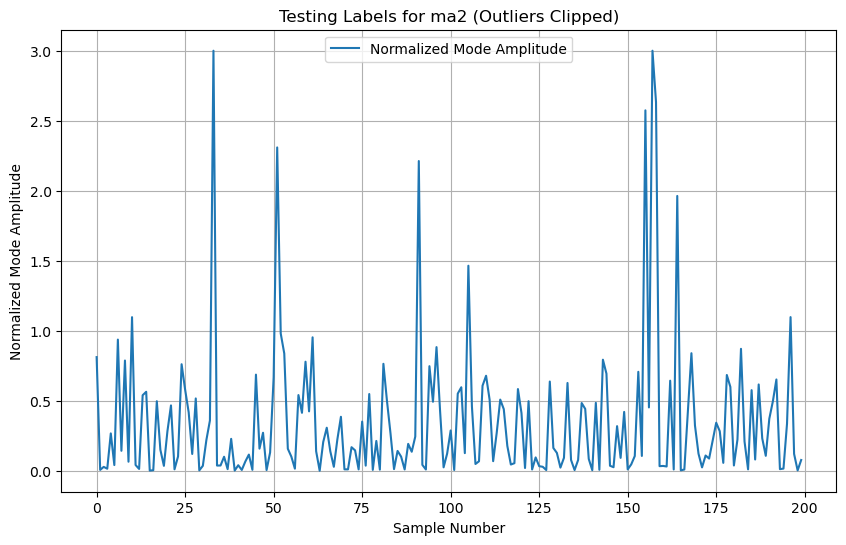

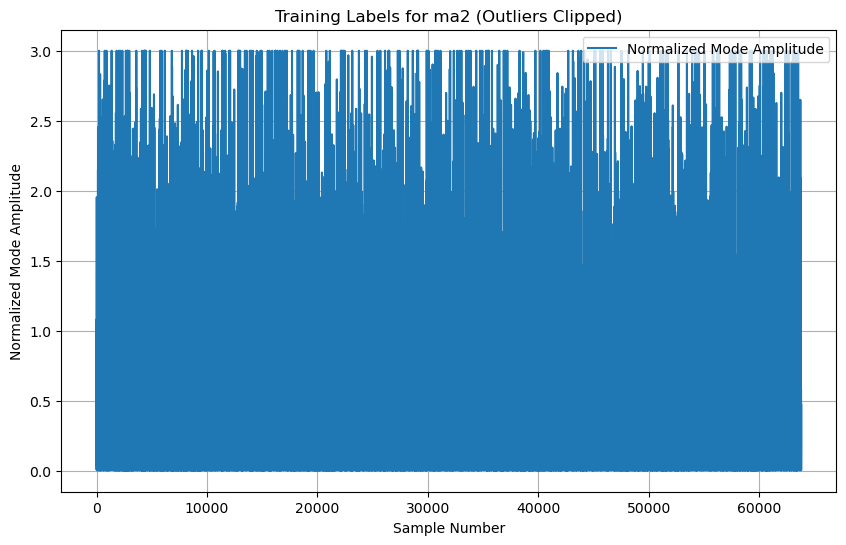

In [8]:
# Prepare data for HBT prediction model
target_data = hbt_dataType  # Using mode 2 amplitude as target
training_data = cut_training_data_2D

# Normalization factors
camera_norm = 1  # Camera data already normalized by max_pixel_value
# Compute ma_norm using 90th percentile to handle outliers
raw_target_vector = []
for i in range(len(valid_shots)):
    shot = valid_shots[i]
    if shot == RESERVED_SHOT:
        continue
    for j in range(len(target_data[i])):
        raw_target_vector.append(target_data[i][j])

raw_target_vector = np.asarray(raw_target_vector, dtype=np.float32)[:, 0]
percentile_cutoff = np.percentile(np.abs(raw_target_vector), OUTLIER_CUTOFF) #99%
ma_norm = percentile_cutoff if percentile_cutoff > 0 else 1.0  # Use 99th percentile for normalization
outlier_threshold = 3 * ma_norm  # Define outliers as values > 3 * normalization factor
outliers = np.abs(raw_target_vector) > outlier_threshold
print(f"Normalization factor ({OUTLIER_CUTOFF} percentile): {ma_norm:.2f}")
print(f"Number of outliers (|value| > {outlier_threshold:.2f}): {np.sum(outliers)}")

# Clip outliers for normalization
raw_target_vector = np.clip(raw_target_vector, -outlier_threshold, outlier_threshold)

# Reshape the training data and labels, excluding RESERVED_SHOT
target_vector = []
training_vector = []
for i in range(len(valid_shots)):
    shot = valid_shots[i]
    if shot == RESERVED_SHOT:
        continue
    for j in range(len(target_data[i])):
        target_vector.append(target_data[i][j])
        training_vector.append(training_data[i][j])

# Shuffle the data
random.seed(123)
zip_list = list(zip(target_vector, training_vector))
random.shuffle(zip_list)
target_vector, training_vector = zip(*zip_list)

# Convert to numpy arrays and normalize with clipping
target_vector = np.asarray(target_vector, dtype=np.float32)[:, 0]
target_vector = np.clip(target_vector, -outlier_threshold, outlier_threshold) / ma_norm
training_vector = np.asarray(training_vector, dtype=np.float32).reshape(-1, 32, 32, 1)

# Split into training and testing sets
test_size = 200
testing_inputs = training_vector[-test_size:]
testing_labels = target_vector[-test_size:]
training_vector = training_vector[:-test_size]
target_vector = target_vector[:-test_size]

# Save normalization info to a per-run file
normalization_filename = f"normalization_{notebook_type}_state_{state}.npz"
np.savez(normalization_filename,
         ma_norm=ma_norm,
         outlier_threshold=outlier_threshold,
         selected_data_type=selected_data_type)
print(f"Saved normalization info to {normalization_filename}")

print('Training shape:', training_vector.shape, 'Target shape:', target_vector.shape)
print('Testing shape:', testing_inputs.shape, 'Testing label shape:', testing_labels.shape)

# Plot testing labels
plt.figure(figsize=(10, 6))
plt.plot(testing_labels, label='Normalized Mode Amplitude')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'Testing Labels for {selected_data_type} (Outliers Clipped)')
plt.grid(True)
plt.legend()
plt.show()

# Plot training labels
plt.figure(figsize=(10, 6))
plt.plot(target_vector, label='Normalized Mode Amplitude')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'Training Labels for {selected_data_type} (Outliers Clipped)')
plt.grid(True)
plt.legend()
plt.show()

In [9]:
import ast

# Define model architecture
num_conv2d_layers = NUM_CONV2D_LAYERS #2
num_dense_layers = NUM_DENSE_LAYERS #1

conv2d_neurons = CONV2D_NEURONS #[16, 16]
conv2d_size = CONV2D_SIZE #[(8, 8), (8, 8)]
dense_layer_neurons = DENSE_LAYER_NEURONS #[10]
max_pooling_size = MAX_POOLING_SIZE #(4, 4)
activation_func = ACTIVATION_FUNC # 'relu'
loss_func = LOSS_FUNC #'mean_squared_error'
optimizer_func = OPTIMIZER_FUNC #'adam'

# Reinterpret conv2d_size to handle various input formats
conv2d_size = [
    tuple(int(x) for x in ast.literal_eval(size) if isinstance(x, (int, float)))
    if isinstance(size, str) else tuple(int(x) for x in size)
    for size in conv2d_size
]
# Reinterpret max_pooling_size to handle various input formats
max_pooling_size = (
    tuple(int(x) for x in ast.literal_eval(max_pooling_size) if isinstance(x, (int, float)))
    if isinstance(max_pooling_size, str) else tuple(int(x) for x in max_pooling_size)
)
# Create the model
william_model = tf.keras.models.Sequential()

# Add input layer
william_model.add(tf.keras.layers.InputLayer(shape=(32, 32, 1)))

# Add Conv2D layers
for i in range(num_conv2d_layers):
    william_model.add(tf.keras.layers.Conv2D(conv2d_neurons[i], conv2d_size[i], 1, activation=activation_func))
    william_model.add(tf.keras.layers.MaxPooling2D(max_pooling_size, 1))

# Flatten the output
william_model.add(tf.keras.layers.Flatten())

# Add dense layers
for i in range(num_dense_layers):
    william_model.add(tf.keras.layers.Dense(dense_layer_neurons[i], activation=activation_func))

# Output layer
william_model.add(tf.keras.layers.Dense(1))

# Compile the model
william_model.compile(optimizer=optimizer_func, loss=loss_func)

# Display model summary
william_model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 26, 26, 64)     │         3,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 20, 20, 64)     │        65,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 17, 17, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 18496)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │       591,904 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 660,737 (2.52 MB)

 Trainable params: 660,737 (2.52 MB)

 Non-trainable params: 0 (0.00 B)

In [10]:
# Train the model
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=20)
Model = william_model
history = Model.fit(training_vector, target_vector,
                       epochs=EPOCH_NUM,
                       validation_split=VALIDATION_SPLIT,
                       verbose=1,
                       callbacks=[early_stop])

Epoch 1/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 3:17 110ms/step - loss: 0.7584

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.5286  

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.4504

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.4110

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.3884

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3706

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.3568

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3489

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.3412

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3318

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.3262

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.3211

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.3163

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.3097

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.3056

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.3016

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.2960

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.2926

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.2894

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.2849

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.2821

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.2796

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.2761

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.2728

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.2699

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.2673

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.2649

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2626

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2605

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2584

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2566

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2551

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2541

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2530

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2520

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2510

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2500

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2490

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2480

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2471

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2462

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2454

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.2446

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.2435

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2423

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.2413

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2404

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2394

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2386

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2377

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2369

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2364

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2356

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2350

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2342

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2337

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2332

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2327

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2322

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2317

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.2310

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2302

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2295

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2289

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2282

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2276

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2270

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2265

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.2259

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2254

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2248

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2243

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2239

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2235

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2231

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2227

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2223

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.2219

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2216

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2213

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2211

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2207

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2204

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2200

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2197

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2193

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2189

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2186

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2182

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.2179

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2175

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2172

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2168

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2165

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2161

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2157

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2154

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2151

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2147

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.2144

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2141

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2137

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2134

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2131

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2128

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2124

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2121

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2118

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2115

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.2112

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2109

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.2107

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2104

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2101

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2099

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2097

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2094

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2092

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2089

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2086

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2084

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2081

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2079

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2076

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.2074

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2071

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2069

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2066

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2064

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2061

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2059

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2057

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2055

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2052

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2050

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2048

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.2046

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2044

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2041

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2039

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2037

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2035

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2033

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2031

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2029

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2027

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2025

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2023

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.2022

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2020

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2018

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2016

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2014

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2012

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2010

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2009

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2007

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2006

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2004

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2002

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.2001

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1999

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1998

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1996

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1995

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1993

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1992

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1990

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1989

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1987

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1986

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1984

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1983

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1981

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1980

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1979

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1977

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1976

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1975

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1973

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1972

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1971

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1970

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1968

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1967

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1966

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1965

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1963

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1962

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1961

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1960

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1959

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1957

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1956

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1955

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1954

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1953

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1952

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1950

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1949

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1948

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1947

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1946

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1945

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1944

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1943

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1942

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1941

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1940

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1939

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1938

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1937

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1936

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1935

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1934

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1933

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1932

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1931

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1930

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1930

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1929

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1928

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1928

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1927

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1927

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1926

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1925

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1924

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1924

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1923

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1922

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1921

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1920

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1919

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1918

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1917

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1917

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1916

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1915

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1914

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1913

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1912

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1911

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1910

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1909

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1908

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1907

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1906

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1906

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1905

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1904

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1903

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1902

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1901

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1900

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1900

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1899

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1898

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1897

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1896

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1896

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1895

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1894

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1893

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1893

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1892

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1891

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1890

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1890

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1889

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1888

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1887

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1887

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1886

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1885

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1885

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1884

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1883

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1883

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1882

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1881

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1881

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1880

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1879

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1879

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1878

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1877

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1877

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1876

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1876

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1875

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1874

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1874

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1873

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1872

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1872

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1871

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1871

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1870

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1869

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1869

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1868

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1868

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1867

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1867

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1866

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1866

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1865

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1864

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1864

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1864

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1863

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1863

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1863

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1862

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1862

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1862

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1861

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1861

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1861

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1860

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1860

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1860

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1859

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1859

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1859

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1858

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1858

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1858

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1857

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1857

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1857

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1856

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1856

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1856

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1855

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1855

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1854

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1854

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1853

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1853

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1853

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1852

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1852

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1851

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1851

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1850

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1850

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1849

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1849

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1849

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1848

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1848

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1847

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1847

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1847

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1846

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1846

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1845

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1845

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1844

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1844

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1844

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1843

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1843

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1842

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1842

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1841

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1841

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1841

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1840

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1840

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1839

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1839

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1839

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1838

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1838

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1837

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1837

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1837

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1836

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1836

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1835

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1835

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1835

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1834

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1834

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1833

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1833

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1833

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1832

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1832

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1831

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1831

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1831

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1830

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1830

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1829

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1829

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1829

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1828

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1828

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1827

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1827

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1827

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1826

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1826

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1825

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1825

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1825

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1824

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1824

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1823

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1823

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1823

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1822

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1822

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1821

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1821

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1821

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1820

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1820

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1819

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1819

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1819

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1819

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1818

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1818

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1818

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1818

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1817

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1817

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1817

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1817

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1816

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1816

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1816

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1815

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1815

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1815

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1814

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1814

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1813

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1813

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1813

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1813

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1813

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1812

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1812

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1812

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1812

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1811

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1811

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1811

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1810

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1810

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1810

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1809

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1809

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1809

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1808

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1808

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1808

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1807

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1807

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1807

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1807

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1806

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1806

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1806

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1806

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1806

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1805

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1805

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1805

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1805

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1804

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1804

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1804

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1803

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1803

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1803

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1802

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1802

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1802

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1801

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1801

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1801

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1801

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1800 

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1800

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1800

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1799

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1799

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1799

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1798

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1798

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1798

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1797

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1797

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1797

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1797

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1796

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1796

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1796

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1795

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1795

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1795

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1794

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1794

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1794

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1793

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1793

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1793

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1793

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1793

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1792

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1792

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1792

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1791

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1791

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1791

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1790

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1790

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1790

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1790

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1789

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1789

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1789

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1788

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1788

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1788

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1787

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1787

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1787

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1787

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1786

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1786

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1786

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1786

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1785

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1785

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1785

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1785

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1785

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1784

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1784

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1784

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1784

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1783

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1783

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1783

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1783

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1782

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1782

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1782

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1782

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1781

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1781

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1781

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1780

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1780

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1780

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1780

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1779

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1779

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1779

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1779

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1778

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1778

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1778

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1778

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1777

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1777

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1777

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1776

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1776

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1776

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1776

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1775

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1775

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1775

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1775

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1774

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1774

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1774

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1774

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1773

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1773

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1773

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1773

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1772

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1772

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1772

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1772

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1771

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1771

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1771

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1771

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1770

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1770

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1770

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1770

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1769

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1769

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1769

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1769

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1768

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1768

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1768

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1767

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1767

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1767

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1767

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1766

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1766

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1766

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1766

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1765

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1765

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1765

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1765

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1764

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1764

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1764

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1764

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1763

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1763

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1763

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1763

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1762

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1762

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1762

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1762

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1761

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1761

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1761

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1761 - val_loss: 0.1445


Epoch 2/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.2078

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1889

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.1841

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1820

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1750

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1709

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1683

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1667

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1654

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1633

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1619

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1603

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1592

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1586

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1577

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1568

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1557

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1546

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1536

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1525

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1515

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1505

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1497

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1490

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1482

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1476

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1471

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1467

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1464

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1461

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1459

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1457

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1455

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1454

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1453

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1452

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1452

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1452

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1452

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1451

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1451

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1450

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1449

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1448

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1447

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1446

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1445

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1444

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1443

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1442

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1442

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1441

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1440

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1440

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1440

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1439

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1439

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1439

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1438

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1438

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1438

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1437

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1437

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1437

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1436

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1436

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1436

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1436

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1435

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1435

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1435

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1435

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1434

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1434

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1434

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1434

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1433

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1433

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1432

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1432

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1432

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1432

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1432

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1432

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1432

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1433

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1433

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1433

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1434

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1434

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1434

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1435

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1435

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1435

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1435

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1435

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1435

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1435

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1435

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1435

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1435

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1435

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1435

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1436

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1436

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1436

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1436

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1436

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1437

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1437

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1437

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1438

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1438

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1439

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1439

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1439

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1440

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1440

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1440

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1441

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1441

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1442

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1442

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1442

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1443

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1443

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1443

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1444

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1444

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1444

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1445

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1445

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1445

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1446

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1446

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1446

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1446

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1446

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1447

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1447

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1447

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1447

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1447

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1447

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1447

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1447

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1447

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1448

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1448

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1448

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1448

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1448

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1448

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1448

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1448

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1448

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1448

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1449

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1449

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1449

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1449

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1449

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1449

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1450

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1450

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1450

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1450

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1450

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1450

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1450

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1451

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1451

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1451

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1451

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1451

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1451

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1451

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1451

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1451

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1451

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1452

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1452

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1452

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1452

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1452

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1452

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1452

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1452

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1452

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1452

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1452

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1452

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1452

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1452

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1452

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1452

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1452

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1452

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1452

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1451

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1451

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1451

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1451

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1451

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1451

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1451

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1451

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1451

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1451

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1451

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1451

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1451

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1451

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1451

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1451

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1451

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1451

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1451

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1451

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1451

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1451

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1451

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1451

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1451

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1451

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1451

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1451

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1451

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1451

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1451

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1451

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1451

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1451

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1450

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1450

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1450

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1450

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1450

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1450

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1450

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1450

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1450

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1450

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1450

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1450

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1450

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1450

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1450

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1450

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1450

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1449

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1449

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1449

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1449

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1449

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1449

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1449

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1449

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1449

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1449

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1449

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1449

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1449

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1449

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1449

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1449

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1449

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1449

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1449

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1449

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1449

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1449

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1449

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1449

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1449

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1449

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1449

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1448

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1448

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1448

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1448

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1448

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1448

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1448

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1448

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1448

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1448

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1448

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1448

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1448

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1448

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1448

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1448

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1448

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1448

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1448

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1448

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1448

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1448

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1448

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1448

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1448

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1448

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1448

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1447

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1447

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1447

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1447

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1447

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1447

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1447

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1447

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1447

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1447

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1447

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1447

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1447

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1447

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1447

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1447

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1446

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1446

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1446

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1446

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1446

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1446

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1446

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1446

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1446

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1446

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1446

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1446

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1446

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1446

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1446

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1446

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1446

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1446

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1446

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1446

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1446

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1446

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1446

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1446

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1446

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1445

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1445

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1445

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1445

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1445

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1445

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1445

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1445

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1445

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1445

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1445

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1445

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1445

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1445

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1445

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1445

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1445

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1445

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1445

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1445

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1445

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1445

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1445

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1445

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1445

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1444

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1444

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1444

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1444

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1444

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1444

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1444

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1444

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1444

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1444

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1444

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1444

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1444

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1444

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1443

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1443

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1443

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1443

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1443

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1443

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1443

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1443

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1443

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1443

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1443

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1443

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1443

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1443

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1443

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1443

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1442

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1442

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1442

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1442

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1442

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1442

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1442

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1442

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1442

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1442

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1442

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1442

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1442

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1442

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1442

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1442

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1442

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1442

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1442

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1442

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1442

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1442

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1441

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1441

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1441

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1441

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1441

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1441

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1441

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1441

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1441

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1441

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1441

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1441

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1441

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1441

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1441

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1441

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1441

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1441

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1441

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1441

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1441

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1441

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1441

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1441

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1441

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1440

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1440

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1440

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1440

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1440

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1440

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1440

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1440

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1440

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1440

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1440

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1440

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1440

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1440

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1440

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1440

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1440

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1439

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1439

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1439

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1439

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1439

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1439

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1439

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1439

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1439

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1439

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1439

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1439

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1439

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1439 

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1438

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1438

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1438

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1438

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1438

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1438

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1438

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1438

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1438

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1438

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1438

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1438

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1437

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1437

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1437

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1437

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1437

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1437

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1437

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1437

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1437

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1437

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1437

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1437

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1437

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1437

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1436

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1436

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1436

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1436

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1436

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1436

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1436

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1436

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1436

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1436

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1436

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1436

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1436

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1436

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1435

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1435

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1435

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1435

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1435

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1435

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1435

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1435

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1435

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1435

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1435

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1435

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1435

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1435

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1435

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1434

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1434

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1434

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1434

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1434

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1434

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1434

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1434

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1434

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1434

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1434

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1434

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1434

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1434

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1434

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1434

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1434

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1434

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1434

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1433

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1433

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1433

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1433

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1433

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1433

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1433

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1433

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1433

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1433

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1433

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1433

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1433

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1433

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1433

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1433

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1433

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1433

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1432

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1432

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1432

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1432

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1432

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1432

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1432

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1432

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1432

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1432

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1432

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1432

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1432

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1432

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1432

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1432

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1431

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1431

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1431

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1431

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1431

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1431

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1431

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1431

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1431

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1431

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1431

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1431

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1431

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1431

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1431

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1431

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1431

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1430

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1430

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1430

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1430

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1430

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1430

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1430

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1430

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1430

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1430

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1430

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1430

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1430

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1430

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1430

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1430

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1430

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1430

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1429

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1429

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1429

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1429

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1429

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1429

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1429 - val_loss: 0.1361


Epoch 3/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1934

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1717

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1562

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1490

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1458

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1434

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1413

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1398

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1395

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1392

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1386

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1381

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1374

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1367

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1362

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1359

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1355

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1351

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1349

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1349

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1349

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1351

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1354

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1356

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1359

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1362

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1366

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1369

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1372

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1374

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1375

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1376

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1377

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1379

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1380

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1381

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1382

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1383

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1385

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1385

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1387

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1388

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1388

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1389

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1390

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1391

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1391

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1392

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1392

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1392

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1392

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1392

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1392

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1392

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1392

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1393

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1393

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1393

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1393

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1393

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1393

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1393

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1393

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1393

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1393

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1392

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1392

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1392

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1391

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1390

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1390

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1389

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1389

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1389

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1388

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1388

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1387

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1387

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1387

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1387

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1386

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1386

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1386

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1386

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1385

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1385

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1385

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1385

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1385

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1385

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1385

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1385

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1385

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1385

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1385

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1385

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1385

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1385

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1385

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1386

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1386

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1386

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1386

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1387

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1387

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1387

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1387

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1387

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1387

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1387

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1387

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1387

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1387

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1387

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1387

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1387

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1387

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1387

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1387

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1388

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1388

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1388

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1388

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1388

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1388

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1388

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1388

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1388

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1389

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1389

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1389

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1389

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1389

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1389

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1389

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1389

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1389

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1389

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1388

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1388

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1388

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1388

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1388

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1388

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1388

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1388

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1388

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1388

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1388

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1388

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1387

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1387

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1387

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1387

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1387

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1387

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1386

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1386

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1386

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1386

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1386

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1385

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1385

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1385

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1385

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1385

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1385

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1384

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1384

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1384

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1384

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1384

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1383

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1383

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1383

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1383

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1382

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1382

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1382

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1382

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1382

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1382

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1382

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1382

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1382

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1382

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1382

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1381

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 25ms/step - loss: 0.1381

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1381

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1381

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1381

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1381

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1381

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1380

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1380

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1380

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1380

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1380

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1380

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1380

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1380

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1379

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 25ms/step - loss: 0.1379

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1379

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1379

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1379

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1379

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1379

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1379

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1378

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1378

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1378

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1378

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1378

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1378

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1378

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1378

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 25ms/step - loss: 0.1378

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1378

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1378

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1378

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1378

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1378

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1378

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1377

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1377

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1377

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1377

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1377

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1377

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 25ms/step - loss: 0.1377

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1377

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1377

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1377

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1377

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 25ms/step - loss: 0.1377

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1377

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1377

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1377

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1377

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1377

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1377

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1377

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1377

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1377

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1377

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1377

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1377

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1376

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1376

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1376

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1376

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1376

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1376

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1376

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1376

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1376

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1375

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1375

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 25ms/step - loss: 0.1375

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1375

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1375

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1375

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1375

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1375

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1374

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1374

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1374

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1374

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1374

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1374

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1374

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1374

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1373

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1373

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1373

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1373

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1373

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1373

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1373

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1373

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1373

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1373

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1372

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1372

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1372

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1372

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1372

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1372

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1372

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1372

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1372

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1372

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1372

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1372

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1371

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1371

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1371

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1371

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1371

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1371

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1371

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1371

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1371

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1371

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1371

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1371

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1371

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1371

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1371

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1371

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1370

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1370

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1370

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1370

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1370

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1370

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1370

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1370

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1370

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1370

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1370

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1370

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1370

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1369

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1369

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1369

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1369

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1369

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1369

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1369

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1369

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1369

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1369

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1368

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1368

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1368

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1368

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1368

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1368

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1368

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1368

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1368

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1368

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1368

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1367

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1367

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1367

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1367

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1367

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1367

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1367

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1367

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1367

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1367

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1367

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1366

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1366

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1366

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1366

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1366

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1366

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1366

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1366

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1366

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1366

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1366

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1366

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1365

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1365

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1365

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1365

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1365

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1365

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1365

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1365

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1365

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1365

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1365

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1365

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1365

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1365

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1364

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1364

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1364

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1364

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1364

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1364

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1364

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1364

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1364

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1364

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1364

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1364

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1363

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1363

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1363

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1363

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1363

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1363

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1363

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1363

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1363

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1363

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1362

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1362

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1362

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1362

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1362

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1362

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1362

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1362

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1362

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1362

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1362

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1361

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1361

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1361

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1361

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1361

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1361

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1361

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1361

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1361

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1361

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1360

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1360

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1360

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1360

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1360

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1360

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1360

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1360

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1360

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1360

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1360

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1360

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1359

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1359

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1359

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1359

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1359

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1359

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1359

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1359

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1359

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1359

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1358

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1358

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1358

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1358

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1358

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1358

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1358

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1358

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1358

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1358

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1358

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1358

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1358

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1357

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1357

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1357

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1357

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1357

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1357

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1357

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1357

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1357

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1357

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1357

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1357

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1357

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1356

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1356

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1356

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1356

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1356

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1356

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1356

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1356

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1356

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1356

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1356

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1356

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1356

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1356

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1355

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1355

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1355

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1355

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1355

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1355

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1355

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1355

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1355

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1355

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1355

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1355

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1354

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1354 

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1354

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1354

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1354

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1354

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1354

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1354

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1354

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1354

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1354

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1354

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1354

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1353

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1353

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1353

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1353

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1353

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1353

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1353

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1353

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1353

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1353

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1353

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1353

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1353

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1353

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1353

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1353

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1353

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1353

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1352

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1352

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1352

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1352

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1352

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1352

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1352

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1352

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1352

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1352

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1352

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1352

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1352

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1352

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1352

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1352

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1352

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1352

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1352

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1352

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1352

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1352

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1352

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1352

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1352

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1352

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1352

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1352

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1352

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1352

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1352

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1351

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1351

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1351

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1351

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1351

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1351

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1351

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1351

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1351

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1351

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1351

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1351

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1351

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1351

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1351

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1351

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1351

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1351

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1351

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1351

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1351

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1351

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1351

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1351

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1351

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1351

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1351

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1351

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1351

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1351

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1351

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1350

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1350

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1350

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1350

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1350

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1350

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1350

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1350

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1350

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1350

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1350

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1350

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1350

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1350

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1350

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1350

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1350

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1350

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1350

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1350

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1350

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1350

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1350

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1350

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1350

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1350

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1350

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1350

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1350

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1350

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1350

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1350

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1350

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1349

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1349

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1349

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1349

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1349

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1349

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1349

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1349

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1349

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1349

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1349

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1349

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1349

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1349

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1349

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1349

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1349

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1349

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1349

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1349

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1349

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1349

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1349

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1349

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.1349 - val_loss: 0.1352


Epoch 4/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1649

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1880

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1766

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1672

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1622

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1562

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1540

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1505

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1486

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1465

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1435

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1409

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1390

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1372

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1358

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1346

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1341

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1339

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1338

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1336

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1336

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1334

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1332

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1331

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1330

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1328

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1327

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1326

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1324

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1321

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1319

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1316

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1313

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1312

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1311

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1311

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1311

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1311

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1310

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1310

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1309

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1309

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1308

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1308

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1307

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1307

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1306

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1305

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1305

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1305

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1304

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1303

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1303

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1302

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1302

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1301

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1300

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1300

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1299

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1299

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1298

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1298

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1297

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1296

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1296

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1295

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1295

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1294

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1293

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1293

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1292

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1292

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1292

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1291

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1291

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1291

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1290

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1290

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1290

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1290

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1290

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1290

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1290

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1289

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1289

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1289

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1288

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1288

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1288

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1288

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1287

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1287

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1287

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1287

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1287

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1287

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1287

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1287

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1286

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1286

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1286

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1286

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1286

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1286

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1286

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1285

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1285

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1285

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1285

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1284

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1284

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1284

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1284

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1284

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1283

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1283

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1283

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1283

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1283

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1283

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1282

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1282

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1282

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1282

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1282

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1282

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1282

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1282

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1282

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1281

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1281

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1281

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1281

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1282

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1282

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1282

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1281

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1281

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1281

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1281

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1281

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1281

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1281

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1281

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1281

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1281

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1281

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1281

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1281

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1281

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1281

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1281

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1281

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1281

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1281

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1281

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1281

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1281

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1281

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1280

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1280

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1280

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1280

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1280

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1280

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1280

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1280

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1280

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1280

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1280

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1279

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1279

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1279

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1279

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1279

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1279

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1279

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1279

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1279

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1279

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1278

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1278

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1278

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1278

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1278

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1278

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1278

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1278

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1277

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1277

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1277

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1277

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1277

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1277

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1277

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1277

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1277

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1277

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1276

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1276

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1276

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1276

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1276

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1276

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1276

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1276

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1276

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1276

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1276

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1276

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1276

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1276

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1276

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1276

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1276

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1276

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1276

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1276

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1276

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1276

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1276

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1276

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1277

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1277

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1277

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1277

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1277

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1277

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1277

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1277

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1277

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1277

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1277

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1277

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1277

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1277

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1277

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1277

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1277

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1278

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1278

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1278

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1278

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1278

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1278

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1278

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1278

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1278

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1278

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1278

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1278

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1278

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1278

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1279

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1279

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1279

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1279

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1279

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1279

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1279

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1279

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1279

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1279

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1279

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1279

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1279

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1279

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1279

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1279

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1279

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1279

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1279

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1279

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1279

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1280

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1280

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1280

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1280

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1280

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1280

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1280

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1280

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1280

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1280

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1280

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1280

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1280

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1280

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1280

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1280

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1280

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1280

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1280

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1280

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1280

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1280

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1280

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1280

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1280

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1280

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1280

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1280

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1280

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1280

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1281

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1281

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1281

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1281

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1281

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1281

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1281

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1281

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1281

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1281

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1281

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1281

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1281

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1281

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1281

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1281

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1281

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1281

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1281

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1281

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1281

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1281

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1281

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1281

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1281

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1281

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1281

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1281

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1281

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1281

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1281

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1281

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1281

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1281

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1281

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1281

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1281

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1281

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1281

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1281

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1281

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1281

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1281

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1281

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1281

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1281

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1281

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1281

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1281

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1281

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1281

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1281

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1281

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1281

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1281

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1281

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1281

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1281

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1281

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1281

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1281

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1281

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1282

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1282

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1282

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1282

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1282

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1282

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1282

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1282

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1282

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1282

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1282

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1282

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1282

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1282

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1282

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1282

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1282

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1282

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1282

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1282

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1282

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1282

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1282

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1282

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1282

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1282

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1282

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1282

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1282

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1282

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1282

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1282

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1282

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1282

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1282

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1282

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1282

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1282

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1282

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1282

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1282

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1282

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1282

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1282

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1282

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1282

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1282

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1282

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1282

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1282

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1283

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1283

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1283

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1283

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1283

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1283

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1283

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1283

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1283

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1283

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1283

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1283

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1283

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1283

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1283

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1283

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1283

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1283

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1283

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1283

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1283

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1283

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1283

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1283

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1283

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1283

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1283

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1283

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1283

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1283

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1283

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1283

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1283

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1283

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1283

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1283

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1283

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1283

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1283

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1283

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1283

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1283

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1283

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1283

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1283

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1283

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1283

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1283

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1283

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1283

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1283

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1283

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1283

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1283

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1283

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1283

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1283

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1283

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1283

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1283

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1283

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1283

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1283 

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1283

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1283

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1283

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1283

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1283

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1283

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1283

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1283

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1283

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1283

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1283

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1283

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1283

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1283

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1284

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1284

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1284

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1284

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1284

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1284

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1284

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1284

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1284

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1284

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1284

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1284

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1284

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1284

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1284

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1284

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1284

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1284

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1284

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1284

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1284

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1284

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1284

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1284

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1284

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1284

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1284

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1284

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1284

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1284

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1284

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1284

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1284

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1284

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1284

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1284

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1284

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1284

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1284

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1284

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1284

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1284

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1284

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1284

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1284

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1284

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1284

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1284

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1284

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1284

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1284

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1284

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1284

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1284

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1284

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1284

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1284

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1284

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1284

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1284

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1284

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1284

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1284

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1284

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1284

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1284

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1284

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1284

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1284

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1284

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1284

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1284

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1284

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1284

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1284

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1284

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1284

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1284

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1284

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1284

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1284

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1284

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1284

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1284

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1284

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1284

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1284

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1284

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1284

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1284

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1284

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1284

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1284

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1284

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1284

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1284

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1284

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1284

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1284

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1284

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1284

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1284

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1284

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1284

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1284

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1284 - val_loss: 0.1276


Epoch 5/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1619

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1199

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1070

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1074

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1071

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1057

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1037

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1030

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1039

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1040

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1042

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1042

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1043

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1049

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1056

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1062

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1069

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1077

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1085

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1094

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1104

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1113

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1122

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1128

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1135

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1140

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1145

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1149

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1153

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1157

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1161

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1164

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1167

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1170

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1173

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1175

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1176

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1177

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1178

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1179

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1180

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1180

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1180

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1180

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1180

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1180

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1180

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1180

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1180

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1181

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1181

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1181

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1181

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1181

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1181

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1181

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1181

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1182

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1183

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1184

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1185

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1186

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1188

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1189

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1190

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1192

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1193

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1195

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1196

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1197

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1198

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1200

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1200

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1202

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1203

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1204

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1205

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1206

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1207

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1208

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1209

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1210

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1211

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1212

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1213

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1214

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1215

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1216

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1217

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1217

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1218

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1219

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1220

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1221

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1222

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1223

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1223

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1224

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1225

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1226

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1227

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1228

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1228

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1229

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1229

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1230

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1231

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1231

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1232

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1232

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1233

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1233

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1234

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1234

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1235

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1235

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1235

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1236

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1236

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1237

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1237

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1238

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1238

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1238

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1239

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1239

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1239

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1240

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1240

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1241

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1241

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1241

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1242

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1242

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1243

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1243

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1243

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1244

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1244

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1244

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1245

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1245

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1245

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1245

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1246

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1246

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1246

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1246

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1247

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1247

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1247

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1247

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1247

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1247

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1248

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1248

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1248

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1248

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1248

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1249

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1249

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1249

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1249

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1249

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1250

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1250

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1250

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1250

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1250

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1250

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1250

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1251

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1251

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1251

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1251

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1251

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1252

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1252

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1252

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1252

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1253

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1253

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1253

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1253

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1253

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1253

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1254

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1254

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1254

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1254

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1254

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1254

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1255

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1255

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1255

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1255

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1255

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1255

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1255

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1255

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1256

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1256

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1256

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1256

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1256

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1256

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1256

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1256

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1256

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1256

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1257

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1257

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1257

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1257

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1257

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1257

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1257

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1257

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1257

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1257

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1257

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1257

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1257

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1257

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1257

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1257

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1258

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1258

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1258

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1258

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1258

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1258

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1258

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1258

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1258

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1259

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1259

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1259

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1259

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1259

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1259

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1259

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1260

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1260

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1260

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1260

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1260

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1260

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1260

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1260

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1260

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1261

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1262

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1262

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1262

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1262

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1262

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1262

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1262

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1262

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1262

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1262

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1262

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1262

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1263

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1263

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1263

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1263

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1263

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1263

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1263

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1263

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1263

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1263

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1263

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1264

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1264

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1264

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1264

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1264

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1264

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1264

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1264

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1264

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1264

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1265

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1265

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1265

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1265

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1265

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1265

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1265

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1265

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1265

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1265

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1265

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1265

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1266

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1266

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1266

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1266

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1266

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1266

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1266

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1266

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1266

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1266

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1266

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1266

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1266

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1266

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1266

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1266

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1266

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1266

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1266

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1266

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1267

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1267

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1267

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1267

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1267

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1267

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1267

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1267

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1267

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1267

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1267

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1267

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1267

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1267

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1267

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1267

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1267

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1267

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1267

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1267

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1267

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1267

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1267

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1267

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1267

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1267

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1267

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1267

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1267

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1267

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1267

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1267

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1267

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1267

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1267

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1267

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1267

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1267

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1267

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1267

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1267

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1267

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1267

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1267

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1267

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1267

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1267

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1267

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1267

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1267

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1267

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1267

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1267

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1267

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1267

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1267

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1267

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1267

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1267

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1267

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1267

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1267

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1267

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1267

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1267

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1267

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1267

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1267

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1267

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1267

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1267

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1267

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1267

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1267

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1267

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1267

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1267

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1267

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1267

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1267

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1267

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1267

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1267

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1267

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1267

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1267

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1267

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1267

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1267

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1267

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1267

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1267

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1267

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1267

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1267

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1267

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1267

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1267

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1267

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1267

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1267

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1267

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1267

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1267

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1267

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1267

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1267

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1267

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1267

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1267

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1267

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1267

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1267

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1267

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1267

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1267

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1267

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1267

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1267

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1267

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1267

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1267

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1267

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1266

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1266

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1266

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1266

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1266

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1266

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1266

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1266

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1266

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1266

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1266

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1266

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1266

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1266

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1266

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1266

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1266

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1266

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1266

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1266

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1266

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1266

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1266

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1266

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1266

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1266

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1266

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1266

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1266 

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1266

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1266

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1266

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1266

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1266

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1266

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1266

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1266

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1266

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1266

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1266

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1266

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1266

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1266

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1266

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1266

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1266

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1266

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1266

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1266

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1266

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1266

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1266

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1266

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1266

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1266

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1266

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1266

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1266

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1266

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1266

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1266

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1266

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1266

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1266

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1266

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1266

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1266

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1266

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1266

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1266

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1265

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1265

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1265

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1265

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1265

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1265

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1265

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1265

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1265

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1265

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1265

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1265

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1265

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1265

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1265

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1265

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1265

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1265

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1265

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1265

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1265

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1265

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1265

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1265

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1265

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1265

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1265

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1265

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1265

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1265

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1265

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1265

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1265

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1265

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1265

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1265

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1265

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1265

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1265

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1265

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1265

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1265

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1265

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1265

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1265

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1265

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1265

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1265

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1265

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1265

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1264

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1264

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1264

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1264

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1264

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1264

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1264

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1264

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1264

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1264

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1264

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1264

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1264

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1264

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1264

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1264

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1264

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1264

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1264

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1264

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1264

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1264

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1264

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1264

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1264

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1264

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1264

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1264

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1264

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1264

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1264

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1264

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1264

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1264

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1264

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1264

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1264

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1264

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1264

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1264

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1264

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1263

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1263

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1263

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1263

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1263

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1263

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1263

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1263

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1263

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1263

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1263

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1263

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1263

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1263

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1263

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1263

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1263

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1263

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1263

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1263

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1263

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1263

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1263

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1263

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1263

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1263

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1263

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1263

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1263

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1263

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1263

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1263 - val_loss: 0.1202


Epoch 6/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 58s 32ms/step - loss: 0.0820

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1110

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1171

   8/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.1193

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.1174

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 1:06 37ms/step - loss: 0.1159

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 1:11 40ms/step - loss: 0.1149

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 1:09 39ms/step - loss: 0.1163

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 38ms/step - loss: 0.1174

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 38ms/step - loss: 0.1179

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 1:05 37ms/step - loss: 0.1188

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.1198

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 1:01 35ms/step - loss: 0.1207

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 59s 34ms/step - loss: 0.1228 

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 33ms/step - loss: 0.1242

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.1246

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.1249

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.1251

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1255

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1259

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.1261

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1264

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.1270

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 29ms/step - loss: 0.1274

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1276

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1278

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1279

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1278

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1277

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1276

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1275

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 28ms/step - loss: 0.1274

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1273

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1273

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1273

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1272

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1271

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1270

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1270

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 27ms/step - loss: 0.1269

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1267

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 27ms/step - loss: 0.1266

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1265

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1265

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1265

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1264

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1264

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1264

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1264

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1265

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1266

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1266

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1267

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1267

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1268

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1269

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1270

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1271

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1272

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1272

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1273

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1273

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1274

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1274

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1274

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1275

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1275

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1276

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1276

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1276

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1277

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1277

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1278

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1278

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1279

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1279

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1280

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1280

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1281

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1281

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1281

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.1282

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1282

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1282

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1283

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1283

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1283

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1283

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1283

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1282

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1282

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1282

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1282

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1282

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1282

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1282

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1282

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1282

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1282

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1282

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1282

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1281

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1281

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1281

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1281

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1281

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1280

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1280

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1280

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1280

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1280

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1279

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1279

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1279

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1279

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1279

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1278

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1278

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1278

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1278

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1278

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1277

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1277

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1277

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1277

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1276

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1276

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1276

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1275

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1275

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1275

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1275

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1275

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1274

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1274

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1274

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1273

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1273

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1273

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1273

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1272

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1272

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1272

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1271

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1271

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1271

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1270

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1270

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1270

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 25ms/step - loss: 0.1269

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1269

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1269

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1269

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1268

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1268

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1268

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 25ms/step - loss: 0.1268

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1267

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1267

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1267

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1267

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1266

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1266

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1266

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1266

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1265

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1265

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1265

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1265

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1265

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1264

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1264

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1264

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1264

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1264

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1264

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1263

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1263

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1263

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1263

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1263

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1262

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1262

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1262

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1262

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1262

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1262

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1262

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1262

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1261

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1261

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1261

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1261

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1261

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1260

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1260

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1260

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1260

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1260

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1259

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1259

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1259

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1259

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1259

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1258

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1258

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1258

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1258

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1258

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1257

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1257

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1257

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1257

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1257

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1257

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1256

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1256

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1256

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1256

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1256

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1255

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1255

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1255

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1255

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 24ms/step - loss: 0.1255

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1254

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1254

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1254

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1254

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1254

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1253

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1253

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1253

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1253

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1253

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1252

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1252

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1252

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1252

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 24ms/step - loss: 0.1252

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1251

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1251

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1251

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1251

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1251

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1250

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1250

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1250

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1250

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1250

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1250

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1249

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 24ms/step - loss: 0.1249

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1249

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1249

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1249

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1248

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1248

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1248

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1248

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1248

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1248

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1247

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1247

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1247

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 24ms/step - loss: 0.1247

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1247

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1247

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1246

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1246

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1246

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1246

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1246

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1246

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1246

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1245

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1245

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1245

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 24ms/step - loss: 0.1245

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1245

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1245

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1244

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1244

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1244

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1244

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1244

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1244

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1244

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1243

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1243

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1243

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1243

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 24ms/step - loss: 0.1243

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1243

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1243

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1242

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1242

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1242

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1242

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1242

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1242

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1242

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1242

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1242

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1241

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1241

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1241

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1241

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 24ms/step - loss: 0.1241

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1241

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1241

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1240

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1240

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1240

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1240

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1240

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1240

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1239

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1239

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1239

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1239

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1239

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 24ms/step - loss: 0.1239

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1239

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1239

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1238

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1238

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1238

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1238

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1238

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1238

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1238

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1238

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1238

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1238

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 24ms/step - loss: 0.1237

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1237

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1237

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1237

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1237

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1237

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1237

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1237

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1237

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1237

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1237

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1237

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1236

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1236

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 24ms/step - loss: 0.1236

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1236

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1236

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1236

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1236

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1236

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1236

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1236

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1236

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1236

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1236

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1236

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1236

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1235

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step - loss: 0.1235

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1235

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1235

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1235

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1235

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1235

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1235

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1235

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1235

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1235

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1235

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1235

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1235

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - loss: 0.1235

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1235

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1235

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1235

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1235

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1235

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1235

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1234

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1234

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1234

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1234

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1234

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1234

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1234

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - loss: 0.1234

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1234

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1234

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1234

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1234

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1234

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1234

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1234

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1234

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1234

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1234

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1234

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1234

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 24ms/step - loss: 0.1234

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1234

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1234

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1234

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1234

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1234

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1234

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1234

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1234

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1233

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1233

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1233

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1233

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1233

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 24ms/step - loss: 0.1233

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1233

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1233

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1233

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1233

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1233

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1233

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1233

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1233

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1233

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1233

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1233

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1233

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1233

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1233

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 24ms/step - loss: 0.1233

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1233

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1233

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1233

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1233

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1233

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1233

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1233

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1233

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1233

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1233

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1233

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1233

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1233

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 24ms/step - loss: 0.1232

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1232

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1232

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1232

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1232

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1232

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1232

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1232

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1232

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1232

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1232

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1232

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1232

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1232

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - loss: 0.1232

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1232

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1232

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1232

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1232

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1232

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1232

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1232

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1232

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1232

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1232

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1232

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1232

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1232

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 0.1231

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1231 

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1231

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1231

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1231

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1231

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1231

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1231

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1231

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1231

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1231

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1231

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1231

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1231

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 0.1231

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1231

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1231

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1231

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1231

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1231

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1231

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1231

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1231

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1231

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1231

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1231

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1231

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1231

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 0.1231

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1231

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1231

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.1231

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1231

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1230

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1230

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1230

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1230

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1230

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1230

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1230

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1230

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1230

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1230

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1230

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1230

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1230

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1230

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1230

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1230

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1230

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1230

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1230

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1230

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1230

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1230

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1230

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1230

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1230

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1230

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1230

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1230

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1230

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1230

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1230

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1230

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1230

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1230

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1230

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1230

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1230

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1229

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1229

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1229

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1229

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1229

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1229

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1229

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1229

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1229

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1229

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1229

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1229

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1229

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1229

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1229

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1229

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1229

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1229

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1229

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1229

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1229

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1229

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1229

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1229

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1229

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1229

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1229

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1229

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1228

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1228

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1228

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1228

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1228

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1228

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1228

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1228

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1228

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1228

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1228

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1228

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1228

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1228

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1228

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1228

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1228

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1228

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1228

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1228

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1228

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1228

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1228

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1228

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1228

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1228

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1228

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1228

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1228

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1228

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1228

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1228

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1228

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1227

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1227

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1227

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1227

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1227

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1227

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1227

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1227

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1227

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1227

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1227

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1227

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1227

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1227

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1227

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1227 - val_loss: 0.1161


Epoch 7/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.0238

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0554

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0810

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0929

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0974

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0985

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0993

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0998

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1002

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1004

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1007

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1012

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1014

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1012

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1011

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1013

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1016

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1019

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1022

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1024

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1028

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1032

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1038

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1042

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1045

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1048

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1050

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1053

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1055

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1057

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1058

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1059

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1061

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1064

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1066

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1070

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1074

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1077

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1080

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1083

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1086

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1088

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1091

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1093

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1094

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1096

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1098

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1100

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1101

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1102

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1104

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1104

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1106

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1107

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1109

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.1110

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1111

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1112

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1113

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1114

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1115

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1116

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1117

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1118

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1119

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1119

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1120

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1121

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1121

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1122

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1122

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1123

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1124

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1125

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1126

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1127

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1127

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1128

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1129

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1130

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1131

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1132

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1133

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1134

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1135

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1136

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1137

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1138

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1138

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1139

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1140

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1141

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1141

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1142

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1142

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1143

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1144

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1144

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1145

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1145

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1146

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1146

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1146

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1147

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1147

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1147

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1148

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1148

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1148

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1148

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1149

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1149

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1149

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1149

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1149

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1150

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1150

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1150

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1150

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1150

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1150

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1151

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1151

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1151

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1151

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1151

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1151

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1151

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1151

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1151

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1151

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1151

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1151

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1150

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1150

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1150

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1150

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1150

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1150

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1150

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1150

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1150

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1150

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1150

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1150

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1150

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1150

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1150

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1150

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1150

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1150

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1150

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1150

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1150

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1151

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1151

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1151

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1151

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1151

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1151

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1151

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1151

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1151

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1151

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1151

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1151

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1152

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1152

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1152

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1152

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1152

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1152

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1152

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1152

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1152

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1152

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1152

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1152

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1152

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1152

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1153

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1153

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1153

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1153

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1153

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1153

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1153

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1153

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1153

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1153

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1153

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1153

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1153

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1154

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1154

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1154

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1154

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1154

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1154

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1154

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1154

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1154

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1154

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1154

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1154

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1154

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1154

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1154

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1154

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1154

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1154

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1155

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1155

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1155

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1155

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1155

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1155

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1155

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1155

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1155

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1155

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1155

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1155

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1155

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1155

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1155

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1155

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1155

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1155

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1155

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1155

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1155

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1156

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1156

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1156

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1156

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1156

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1156

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1156

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1156

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1156

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1156

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1156

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1156

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1156

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1156

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1156

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1156

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1156

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1156

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1156

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1156

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1156

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1156

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1156

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1156

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1156

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1156

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1156

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1156

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1156

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1156

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1156

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1156

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1156

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1156

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1156

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1156

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1156

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1156

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1156

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1156

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1156

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1156

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1156

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1157

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1157

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1157

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1157

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1157

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1157

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1157

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1157

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1157

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1157

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1157

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1157

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1157

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1157

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1157

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1157

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1157

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1157

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1157

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1157

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1157

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1157

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1157

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1157

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1157

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1157

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1157

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1157

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1157

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1157

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1157

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1157

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1157

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1157

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1157

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1157

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1157

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1156

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1156

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1156

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1156

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1156

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1156

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1156

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1157

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1157

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1157

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1157

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1157

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1157

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1157

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1157

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1157

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1157

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1157

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1157

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1157

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1157

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1157

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1157

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1157

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1157

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1157

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1157

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1157

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1157

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1157

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1157

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1157

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1157

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1157

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1157

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1157

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1157

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1157

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1157

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1157

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1157

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1157

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1157

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1157

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1157

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1157

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1157

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1157

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1157

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1157

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1157

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1157

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1157

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1157

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1157

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1157

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1157

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1157

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1157

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1157

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1157

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1157

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1157

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1157

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1157

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1157

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1157

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1158

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1158

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1158

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1158

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1158

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1158

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1158

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1158

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1158

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1158

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1158

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1158

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1158

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1158

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1158

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1158

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1158

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1158

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1158

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1158

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1158

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1158

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1158

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1158

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1158

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1158

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1158

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1158

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1158

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1158

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1158

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1158

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1158

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1158

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1158

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1158

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1158

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1158

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1158

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1158

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1158

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1158

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1158

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1158

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1158

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1158

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1158

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1158

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1158

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1158

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1158

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1158

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1158

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1158

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1158

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1158

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1158 

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1158

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1158

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1158

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1158

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1158

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1158

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1158

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1158

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1158

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1158

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1158

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1158

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1158

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1158

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1158

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1158

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1158

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1158

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1158

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1158

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1158

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1159

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1159

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1159

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1159

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1159

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1159

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1159

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1159

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1159

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1159

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1159

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1159

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1159

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1159

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1159

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1159

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1159

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1159

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1159

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1159

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1159

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1159

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1159

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1159

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1159

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1159

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1159

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1159

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1159

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1159

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1159

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1159

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1159

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1159

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1159

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1159

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1159

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1159

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1159

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1160

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1160

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1160

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1160

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1160

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1160

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1160

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1160

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1160

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1160

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1160

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1160

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1160

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1160

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1160

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1160

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1160

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1160

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1160

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1160

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1160

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1160

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1160

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1160

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1160

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1160

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1160

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1160

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1160

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1161

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1161

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1161

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1161

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1161

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1161

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1161

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1161

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1161

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1161

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1161

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1161

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1161

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1161

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1161

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1161

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1161

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1161

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1161

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1161

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1161

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1161

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1161

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1161

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1161

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1161

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1162

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1162

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1162

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1162

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1162

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1162

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1162

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1162

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1162

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1162

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1162

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1162

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1162

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1162

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1162

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1162

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1162

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1162

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1162

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1162

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1162

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1162

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1162

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1162

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1162

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1162

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1163

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1163

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1163

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1163

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1163

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1163 - val_loss: 0.1189


Epoch 8/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.0453

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1204

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1300

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1288

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1295

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1330

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1341

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1339

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1340

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1339

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1336

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1334

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1331

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1331

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1333

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1336

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1339

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1341

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1339

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1337

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1336

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1337

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1338

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1341

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1343

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1344

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1344

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1345

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1345

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1345

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1344

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1343

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1343

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1341

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1340

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1339

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1337

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1336

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1335

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1333

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1333

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1332

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1331

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1330

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1329

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1328

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1327

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1326

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1324

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1323

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1322

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1321

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1320

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1318

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1317

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1316

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1315

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1314

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1313

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1312

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1311

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1310

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1309

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1308

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1307

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1306

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1305

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1304

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1303

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1302

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1301

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1300

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1299

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1298

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1297

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1296

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1295

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1294

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1293

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1292

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1292

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1291

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1290

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1289

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1289

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1288

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1287

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1287

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1286

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1285

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1285

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1284

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1284

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1283

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1282

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1282

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1281

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1281

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1280

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1280

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1280

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1279

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1279

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1279

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1279

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1278

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1278

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1278

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1278

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1277

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1277

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1277

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1277

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1276

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1276

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1276

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1275

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1275

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1275

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1274

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1274

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1274

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1273

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1273

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1273

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1272

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1272

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1272

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1271

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1271

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1271

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1270

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1270

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1270

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1269

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1269

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1268

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1268

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1268

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1267

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1267

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1266

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1266

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1265

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1265

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1265

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1264

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1264

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1263

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1263

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1262

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1262

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1261

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1261

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1261

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1260

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1260

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1259

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1259

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1258

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1258

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1257

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1257

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1256

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1256

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1256

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1255

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1255

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1255

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1254

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1254

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1253

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1253

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1253

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1252

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1252

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1252

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1251

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1251

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1251

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1250

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1250

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1250

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1250

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1249

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1249

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1249

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1249

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1248

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1248

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1248

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1247

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1247

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1247

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1246

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1246

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1245

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1245

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1245

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1244

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1244

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1244

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1244

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1243

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1243

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1243

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1242

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1242

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1242

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1241

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1241

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1241

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1241

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1240

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1240

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1240

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1240

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1239

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1239

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1239

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1238

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1238

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1238

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1238

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1238

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1237

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1237

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1237

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1237

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1237

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1236

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1236

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1236

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1236

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1235

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1235

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1235

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1235

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1235

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1234

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1234

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1234

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1234

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1233

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1233

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1233

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1233

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1233

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1232

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1232

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1232

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1232

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1232

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1231

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1231

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1231

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1231

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1231

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1230

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1230

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1230

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1230

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1230

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1230

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1230

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1229

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1229

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1229

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1229

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1229

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1229

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1229

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1229

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1228

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1228

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1228

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1228

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1228

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1228

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1228

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1228

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1228

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1227

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1227

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1227

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1227

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1227

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1227

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1227

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1227

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1227

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1227

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1226

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1226

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1226

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1226

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1226

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1226

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1226

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1226

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1226

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1226

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1225

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1225

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1225

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1225

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1225

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1225

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1225

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1225

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1225

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1225

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1225

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1225

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1225

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1225

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1225

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1225

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1225

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1225

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1224

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1224

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1224

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1224

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1224

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1224

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1224

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1224

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1224

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1224

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1224

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1224

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1224

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1224

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1224

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1224

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1224

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1224

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1224

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1224

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1224

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1224

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1224

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1224

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1224

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1224

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1224

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1224

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1224

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1224

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1224

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1223

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1223

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1223

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1223

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1223

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1223

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1223

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1223

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1223

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1223

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1223

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1223

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1223

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1223

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1223

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1223

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1223

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1223

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1222

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1222

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1222

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1222

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1222

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1222

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1222

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1222

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1222

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1222

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1222

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1222

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1222

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1222

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1222

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1222

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1222

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1222

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1222

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1221

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1221

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1221

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1221

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1221

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1221

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1221

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1221

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1221

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1221

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1221

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1221

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1221

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1221

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1221

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1221

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1221

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1221

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1221

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1221

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1221

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1220

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1220

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1220

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1220

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1220

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1220

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1220

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1220

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1220

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1220

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1220

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1220

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1220

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1220

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1220

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1220

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1220

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1220

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1219

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1219

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1219

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1219

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1219

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1219

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1219

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1219

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1219

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1219

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1219

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1219

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1219

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1219

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1219

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1219

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1219

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1218

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1218

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1218

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1218

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1218

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1218

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1218

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1218

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1218

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1218

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1218

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1218

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1218

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1218

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1218

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1218

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1218

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1218

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1217

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1217

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1217 

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1217

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1217

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1217

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1217

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1217

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1217

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1217

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1217

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1217

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1217

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1217

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1217

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1217

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1217

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1216

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1216

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1216

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1216

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1216

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1216

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1216

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1216

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1216

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1216

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1216

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1216

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1216

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1216

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1216

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1216

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1216

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1215

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1215

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1215

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1215

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1215

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1215

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1215

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1215

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1215

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1215

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1215

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1215

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1215

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1215

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1215

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1215

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1215

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1214

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1214

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1214

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1214

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1214

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1214

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1214

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1214

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1214

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1214

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1214

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1214

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1214

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1214

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1214

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1214

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1214

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1214

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1214

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1213

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1213

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1213

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1213

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1213

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1213

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1213

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1213

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1213

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1213

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1213

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1213

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1213

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1213

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1213

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1213

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1213

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1212

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1212

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1212

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1212

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1212

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1212

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1212

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1212

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1212

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1212

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1212

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1212

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1212

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1212

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1212

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1212

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1212

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1212

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1212

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1212

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1211

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1211

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1211

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1211

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1211

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1211

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1211

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1211

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1211

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1211

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1211

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1211

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1211

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1211

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1211

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1211

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1211

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1211

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1211

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1211

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1211

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1211

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1210

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1210

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1210

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1210

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1210

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1210

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1210

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1210

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1210

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1210

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1210

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1210

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1210

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1210

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1210

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1210

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1210

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1210

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1210

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1210

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1209 - val_loss: 0.1178


Epoch 9/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.0305

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0414

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0405

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0463

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0539

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0591

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0632

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0658

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0677

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0691

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0701

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0716

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0728

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0739

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0749

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0758

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0769

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0783

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0796

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0807

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0817

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0826

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0835

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0843

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0851

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0858

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0864

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0869

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0874

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0878

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0882

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0886

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0890

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0893

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0896

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0899

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0902

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0905

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0909

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0912

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0917

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0921

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0925

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0928

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0932

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0936

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0939

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0941

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0943

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0945

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0947

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0949

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0951

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0952

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0954

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0956

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0958

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0960

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0962

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0964

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0966

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0968

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0970

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0973

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0975

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0977

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0979

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0982

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0984

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0986

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0987

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0989

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0991

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0992

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0993

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0995

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0997

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0999

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1000

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1001

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.1002

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1004

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1006

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1007

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1009

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1010

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.1012

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1013

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1015

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1017

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1018

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1020

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1021

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1023

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1024

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1026

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1027

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1029

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1030

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1032

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1033

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1034

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1036

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1037

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1038

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1039

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1041

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1042

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1043

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1044

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1045

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1046

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1047

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1048

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1049

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1050

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1051

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1052

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1053

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1054

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1055

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1056

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1056

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1057

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1057

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1058

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1059

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1059

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1060

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1061

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1062

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1063

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1063

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1064

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1065

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1065

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1066

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1067

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1067

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1068

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1069

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1069

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1070

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1070

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1071

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1071

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1072

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1072

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1073

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1074

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1074

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1075

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1075

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1076

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1076

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1077

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1077

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1078

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1078

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1079

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1079

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1080

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1080

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1081

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1081

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1081

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1082

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1082

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1083

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1083

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1084

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1084

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1085

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1085

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1086

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1086

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1086

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1087

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1087

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1088

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1088

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1089

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1089

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1090

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1090

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1091

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1091

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1091

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1092

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1092

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1093

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1093

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1094

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1094

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1094

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1095

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1095

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1096

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1096

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1097

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1097

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1097

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1098

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1098

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1098

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1099

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1099

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1100

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1100

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1100

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1101

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1101

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1101

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1102

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1102

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1102

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1103

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1103

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1103

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1104

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1104

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1104

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1105

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1105

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1105

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1106

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1106

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1106

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1106

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1107

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1107

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1107

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1108

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1108

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1108

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1108

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1109

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1109

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1109

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1110

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1110

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1110

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1110

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1111

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1111

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1111

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1111

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1112

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1112

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1112

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1112

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1113

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1113

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1113

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1113

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1114

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1114

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1114

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1114

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1114

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1115

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1115

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1115

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1115

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1115

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1116

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1116

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1116

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1116

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1116

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1117

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1117

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1117

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1117

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1117

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1117

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1118

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1118

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1118

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1118

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1118

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1118

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1119

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1119

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1119

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1119

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1119

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1119

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1119

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1119

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1120

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1120

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1120

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1120

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1120

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1120

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1120

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1120

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1120

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1121

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1121

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1121

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1121

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1121

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1121

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1121

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1121

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1122

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1122

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1122

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1122

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1122

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1122

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1122

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1122

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1123

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1123

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1123

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1123

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1123

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1123

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1123

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1123

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1123

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1124

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1124

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1124

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1124

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1124

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1124

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1124

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1124

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1124

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1125

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1125

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1125

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1125

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1125

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1125

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1125

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1125

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1126

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1126

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1126

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1126

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1126

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1126

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1126

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1126

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1126

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1127

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1127

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1127

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1127

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1127

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1127

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1127

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1127

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1127

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1128

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1128

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1128

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1128

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1128

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1128

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1128

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1128

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1128

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1128

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1129

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1129

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1129

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1129

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1129

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1129

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1129

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1129

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1129

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1129

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1129

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1129

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1129

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1129

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1130

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1130

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1130

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1130

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1130

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1130

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1130

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1130

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1130

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1130

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1130

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1130

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1130

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1130

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1130

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1130

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1131

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1131

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1131

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1131

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1131

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1131

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1131

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1131

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1131

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1131

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1131

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1131

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1131

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1131

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1131

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1131

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1131

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1131

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1131

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1131

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1131

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1132

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1132

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1132

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1132

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1132

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1132

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1133

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1133

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1133

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1133

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1133

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1133

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1133

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1133

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1133

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1133

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1133

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1133

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1133

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1133

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1133

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1133

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1133

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1133

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1134

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1134

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1134

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1134

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1134

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1134

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1134

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1134

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1134 

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1134

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1134

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1134

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1134

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1134

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1134

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1134

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1134

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1134

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1134

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1134

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1134

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1135

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1135

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1135

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1135

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1135

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1135

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1135

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1135

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1135

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1135

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1135

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1135

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1135

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1135

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1135

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1135

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1135

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1135

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1135

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1135

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1135

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1135

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1135

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1135

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1135

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1135

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1135

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1135

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1135

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1136

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1136

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1136

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1136

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1136

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1136

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1136

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1136

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1136

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1136

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1136

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1136

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1136

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1136

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1136

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1136

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1136

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1136

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1136

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1136

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1136

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1136

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1136

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1136

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1136

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1136

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1136

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1136

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1136

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1137

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1137

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1137

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1137

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1137

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1137

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1137

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1137

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1137

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1137

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1137

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1137

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1137

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1137

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1137

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1137

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1137

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1137

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1137

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1137

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1137

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1137

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1137

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1137

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1137

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1137

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1137

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1137

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1137

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1137

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1137

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1137

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1137

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1137

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1137

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1138

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1138

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1138

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1138

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1138

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1138

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1138

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1138

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1138

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1138

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1138

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1138

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1138

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1138

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1138

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1138

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1138

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1138

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1138

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1138

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1138

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1138

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1138

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1138

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1138

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1138

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1138

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1139

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1139

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1139

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1139

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1139

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1139

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1139

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1139

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1139

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1139

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1139

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1139

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1139

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1139

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1139

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1139

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1139

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1139

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1139 - val_loss: 0.1216


Epoch 10/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.0450

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1418

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1438

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1391

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1330

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1308

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1302

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1286

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1273

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1262

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1255

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1250

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1240

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1234

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1231

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1235

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1239

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1240

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1242

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1245

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1248

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1253

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1255

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1255

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1255

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1255

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1255

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1254

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1254

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1253

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1253

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1252

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1251

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1250

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1249

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1248

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1246

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1246

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1245

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1244

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1244

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1243

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1241

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1240

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1239

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1238

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1237

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1236

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1235

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1235

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1234

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1233

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1232

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1231

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1230

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1229

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1229

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1228

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1227

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1226

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1226

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1225

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1224

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1224

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1223

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1222

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1222

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1221

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1220

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1219

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1218

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1218

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1217

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1216

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1215

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1214

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1213

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1213

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1212

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1211

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1210

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1210

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1209

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1208

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1208

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1207

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1207

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1206

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1205

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1205

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1204

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1204

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1203

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1203

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1202

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1202

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1201

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1201

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1200

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1200

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1199

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1199

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1199

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1198

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1198

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1197

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1197

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1197

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1196

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1196

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1195

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1195

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1195

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1194

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1194

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1194

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1193

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1193

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1193

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1192

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1192

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.1191

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1191

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1191

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1190

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1190

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1190

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1189

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1189

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1189

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1188

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1188

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1187

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1187

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1187

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1186

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1186

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1185

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1185

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1184

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1184

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.1184

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1183

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1183

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1182

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1182

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1182

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1181

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1181

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1181

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1180

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1180

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1180

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1179

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1179

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.1179

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1178

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1178

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1178

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1177

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1177

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1177

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1177

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1176

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1176

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1176

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1176

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1176

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1176

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1175

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1175

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1175

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1175

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1175

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1174

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1174

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1174

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1174

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1173

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1173

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1173

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1173

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1172

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1172

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1172

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1172

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1171

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1171

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1171

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1170

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1170

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1170

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1170

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1169

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1169

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1169

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1169

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1168

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1168

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1168

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1168

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1168

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1167

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1167

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1167

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1167

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1166

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1166

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1166

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1166

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1165

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1165

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1165

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1165

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1165

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1164

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1164

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1164

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1164

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1164

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1163

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1163

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1163

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1163

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1163

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1163

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1162

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1162

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1162

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1162

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1162

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1162

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1162

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1162

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1161

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1161

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1161

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1161

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1161

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1161

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1161

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1161

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1161

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1160

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1160

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1160

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1160

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1160

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1160

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1160

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1160

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1160

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1160

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1160

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1159

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1159

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1159

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1159

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1159

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1159

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1159

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1159

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1159

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1159

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1159

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1159

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1159

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1159

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1158

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1158

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1158

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1158

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1158

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1158

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1158

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1158

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1158

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1158

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1158

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1158

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1158

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1158

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1158

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1158

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1158

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1158

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1158

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1158

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1158

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1158

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1158

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1158

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1158

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1158

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1158

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1158

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1158

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1158

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1158

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1158

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1158

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1158

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1158

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1158

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1158

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1158

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1158

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1158

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1158

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1158

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1158

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1158

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1158

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1158

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1158

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1158

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1158

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1158

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1158

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1158

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1158

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1158

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1158

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1158

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1158

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1158

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1158

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1158

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1158

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1158

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1158

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1158

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1158

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1157

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1157

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1157

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1157

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1157

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1157

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1157

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1157

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1157

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1157

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1157

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1157

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1156

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1156

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1156

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1156

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1156

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1156

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1156

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1156

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1156

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1156

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1156

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1156

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1156

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1156

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1156

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1156

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1156

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1156

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1156

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1156

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1156

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1156

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1156

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1156

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1155

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1155

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1155

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1155

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1155

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1155

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1155

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1155

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1155

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1155

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1155

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1155

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1155

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1155

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1155

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1155

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1155

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1155

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1155

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1155

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1155

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1155

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1155

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1155

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1155

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1155

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1155

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1155

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1155

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1155

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1155

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1155

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1155

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1155

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1155

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1155

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1155

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1155

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1155

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1155

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1155

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1155

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1155

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1155

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1155

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1155

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1155

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1155

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1154

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1154

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1154

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1154

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1154

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1154

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1154

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1154

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1154

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1154

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1154

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1154

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1154

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1154

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1154

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1154

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1154

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1154

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1154

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1154

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1154

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1154

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1154 

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1154

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1154

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1154

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1154

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1154

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1154

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1154

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1154

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1154

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1154

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1154

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1154

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1154

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1154

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1154

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1154

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1154

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1154

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1154

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1154

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1154

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1154

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1154

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1154

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1154

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1154

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1154

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1154

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1154

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1154

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1154

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1154

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1154

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1154

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1154

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1154

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1154

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1154

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1154

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1153

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1153

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1153

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1153

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1153

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1153

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1153

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1153

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1153

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1153

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1153

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1153

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1153

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1153

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1153

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1153

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1153

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1153

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1153

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1153

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1153

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1153

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1153

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1153

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1153

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1153

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1153

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1153

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1153

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1153

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1153

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1153

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1153

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1153

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1153

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1153

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1153

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1153

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1153

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1153

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1153

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1153

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1153

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1153

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1153

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1153

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1153

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1153

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1153

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1153

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1153

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1153

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1153

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1153

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1153

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1153

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1153

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1153

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1153

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1153

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1153

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1153

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1153

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1153

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1153

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1153

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1153

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1153

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1153

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1153

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1153

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1153

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1153

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1153

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1153

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1153

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1153

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1153

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1153

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1153

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1153

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1153

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1153

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1153

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1153

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1152

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1152

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1152

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1152

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1152

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1152

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1152

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1152

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1152

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1152

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1152

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1152

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1152

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1152

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1152

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1152

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1152

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1152

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1152

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1152

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1152

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1152

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1152

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1152

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1152

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1152

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1152

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1152

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1152 - val_loss: 0.1182


Epoch 11/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.0609

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0974

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1091

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1127

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1122

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1118

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1113

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1112

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1122

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1129

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1141

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1150

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1156

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1166

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1174

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1180

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1188

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1195

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1202

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1206

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1210

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1213

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1216

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1218

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1219

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1220

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1221

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1222

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1222

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1222

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1222

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1222

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1221

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1220

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1220

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1220

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1219

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1218

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1218

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1218

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1217

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1217

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1216

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1215

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1215

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1214

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1213

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1213

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1212

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1212

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1211

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1210

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1209

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1209

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1209

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1209

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1209

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1209

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1209

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1209

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1208

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1208

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1208

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1208

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1208

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1208

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1207

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1207

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1206

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1206

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1206

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1205

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1205

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1205

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1204

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1204

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1204

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1204

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1203

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1203

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1203

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1203

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1202

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1202

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1202

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1202

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1202

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1201

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1201

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1201

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1201

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1201

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1200

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1200

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1200

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1199

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1199

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1198

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1198

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1197

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1197

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1197

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1197

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1196

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1196

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1196

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1196

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1196

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1195

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1195

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1195

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1195

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1195

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1195

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1194

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1194

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1194

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1194

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1193

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1193

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1193

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1193

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1193

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1192

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1192

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1192

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1192

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1192

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1192

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1191

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1191

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1191

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1191

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1191

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1191

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1191

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1191

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1190

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1190

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1190

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1190

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1190

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1190

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1190

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1190

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1190

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1190

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1189

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1189

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1189

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1189

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1189

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1189

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1189

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1189

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1189

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1189

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1189

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1189

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1189

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1188

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1188

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1188

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1188

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1188

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1188

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1188

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1188

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1188

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1188

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1188

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1188

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1188

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1188

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1188

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1188

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1187

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1187

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1187

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1187

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1187

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1187

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1187

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1187

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1187

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1187

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1187

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1187

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1187

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1187

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1187

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1186

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1186

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1186

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1186

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1186

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1186

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1186

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1186

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1186

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1186

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1186

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1186

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1186

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1186

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1186

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1186

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1186

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1186

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1186

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1186

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1186

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1186

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1186

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1186

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1185

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1185

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1185

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1185

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1185

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1185

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1185

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1185

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1185

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1185

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1185

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1185

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1184

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1184

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1184

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1184

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1184

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1184

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1184

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1184

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1184

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1184

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1184

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1184

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1183

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1183

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1183

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1183

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1183

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1183

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1183

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1183

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1183

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1183

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1183

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1183

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1183

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1183

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1183

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1182

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1182

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1182

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1182

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1182

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1182

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1182

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1182

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1182

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1182

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1182

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1182

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1182

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1181

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1181

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1181

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1181

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1181

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1181

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1181

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1181

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1181

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1181

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1181

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1181

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1181

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1181

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1180

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1180

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1180

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1180

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1180

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1180

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1180

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1180

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1180

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1179

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1179

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1179

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1179

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1179

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1179

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1179

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1179

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1179

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1178

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1178

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1178

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1178

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1178

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1178

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1178

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1178

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1177

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1177

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1177

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1177

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1177

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1177

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1177

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1177

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1176

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1176

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1176

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1176

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1176

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1176

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1176

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1176

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1176

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1175

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1175

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1175

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1175

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1175

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1175

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1175

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1175

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1174

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1174

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1174

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1174

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1174

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1174

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1174

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1174

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1174

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1173

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1173

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1173

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1173

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1173

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1173

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1173

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1173

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1173

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1173

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1172

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1172

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1172

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1172

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1172

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1172

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1172

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1172

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1172

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1172

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1172

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1171

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1171

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1171

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1171

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1171

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1171

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1171

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1171

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1171

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1171

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1171

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1170

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1170

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1170

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1170

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1170

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1170

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1170

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1170

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1170

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1170

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1169

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1169

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1169

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1169

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1169

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1169

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1169

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1169

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1169

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1169

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1169

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1168

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1168

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1168

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1168

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1168

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1168

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1168

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1168

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1168

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1168

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1168

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1167

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1167

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1167

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1167

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1167

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1167

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1167

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1167

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1167

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1167

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1167

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1167

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1166

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1166

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1166

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1166

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1166

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1166

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1166

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1166

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1166

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1166

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1166

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1166

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1166

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1165

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1165

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1165

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1165

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1165

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1165

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1165

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1165

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1165

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1165

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1165

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1165

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1165

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1165

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1165

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1164

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1164

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1164

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1164

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1164

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1164

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1164

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1164

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1164

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1164

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1164

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1164

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1164

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1164

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1163

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1163

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1163

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1163

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1163

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1163

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1163

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1163

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1163

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1163

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1163

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1163

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1163

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1163 

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1163

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1162

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1162

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1162

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1162

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1162

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1162

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1162

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1162

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1162

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1162

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1162

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1162

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1162

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1162

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1162

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1162

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1162

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1162

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1162

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1162

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1161

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1161

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1161

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1161

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1161

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1161

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1161

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1161

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1161

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1161

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1161

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1161

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1161

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1161

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1161

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1161

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1161

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1161

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1161

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1161

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1161

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1161

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1161

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1161

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1160

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1160

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1160

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1160

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1160

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1160

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1160

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1160

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1160

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1160

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1160

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1160

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1160

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1160

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1160

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1160

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1160

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1160

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1160

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1160

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1160

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1160

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1160

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1159

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1159

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1159

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1159

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1159

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1159

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1159

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1159

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1159

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1159

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1159

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1159

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1159

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1159

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1159

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1159

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1159

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1159

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1159

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1159

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1159

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1159

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1159

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1159

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1159

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1159

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1159

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1159

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1159

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1159

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1159

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1159

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1159

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1158

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1158

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1158

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1158

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1158

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1158

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1158

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1158

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1158

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1158

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1158

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1158

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1158

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1158

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1158

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1158

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1158

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1158

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1158

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1158

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1158

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1158

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1158

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1158

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1158

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1158

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1158

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1158

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1158

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1158

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1158

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1158

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1158

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1158

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1158

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1157

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1157

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1157

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1157

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1157

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1157

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1157

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1157

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1157

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1157

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1157

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1157

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1157

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1157

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1157

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1157

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1157

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1157

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1157

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1157

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1157

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.1157 - val_loss: 0.1186


Epoch 12/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1193

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0994

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.1049

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1122

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1156

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1219

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1242

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1253

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1257

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1271

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1278

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1280

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1288

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1293

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1295

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1296

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1296

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1295

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1298

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1299

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1300

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1301

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1301

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1300

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1299

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1299

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1300

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1300

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1299

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1298

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1297

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1295

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1293

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1291

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1289

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1287

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1286

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1284

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1282

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1281

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1279

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1278

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1276

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1275

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1273

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1272

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1271

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1270

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1268

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1267

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1265

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1263

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1262

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1260

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1259

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1257

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1256

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1255

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1254

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1252

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1251

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1249

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1248

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1247

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1246

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1245

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1244

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1243

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1242

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1241

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1240

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1239

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1239

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1238

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1237

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1237

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1236

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1236

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1235

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1234

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1234

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1233

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1233

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1233

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1232

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1232

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1231

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1231

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1231

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1230

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1230

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1229

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1229

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1229

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1228

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1228

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1227

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1227

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1227

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1226

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1226

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1225

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1225

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1224

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1224

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1223

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1223

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1222

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1222

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1221

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1221

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1221

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1220

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1220

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1219

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1219

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1219

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1218

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1218

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1217

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1217

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1217

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1216

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1216

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1216

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1215

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1215

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1215

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1214

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1214

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1213

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1213

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1212

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1212

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1212

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1211

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1211

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1210

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1210

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1210

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1209

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1209

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1208

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1208

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1208

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1207

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1207

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1207

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1206

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1206

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1206

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1205

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1205

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1204

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1204

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1204

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1203

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1203

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1203

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1202

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1202

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1202

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1201

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1201

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1200

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1200

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1200

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1199

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1199

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1199

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1198

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1198

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1198

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1197

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1197

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1197

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1196

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1196

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1196

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1195

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1195

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1195

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1194

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1194

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1194

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1194

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1193

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1193

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1193

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1193

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1192

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1192

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1192

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1192

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1192

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1191

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1191

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1191

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1191

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1190

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1190

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1190

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1190

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1190

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1189

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1189

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1189

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1189

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1189

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1188

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1188

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1188

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1188

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1188

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1188

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1187

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1187

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1187

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1187

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1187

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1186

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1186

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1186

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1186

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1186

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1185

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1185

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1185

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1185

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1184

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1184

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1184

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1184

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1184

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1183

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1183

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1183

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1183

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1183

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1182

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1182

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1182

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1182

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1182

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1181

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1181

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1181

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1181

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1181

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1180

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1180

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1180

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1180

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1180

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1179

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1179

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1179

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1179

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1179

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1179

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1179

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1178

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1178

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1178

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1178

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1178

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1178

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1178

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1177

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1177

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1177

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1177

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1177

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1177

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1177

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1176

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1176

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1176

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1176

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1176

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1176

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1176

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1176

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1176

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1176

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1175

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1175

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1175

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1175

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1175

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1175

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1175

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1175

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1175

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1174

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1174

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1174

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1174

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1174

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1174

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1174

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1174

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1173

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1173

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1173

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1173

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1173

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1173

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1173

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1173

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1173

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1172

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1172

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1172

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1172

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1172

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1172

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1172

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1172

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1172

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1172

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1172

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1171

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1171

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1171

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1171

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1171

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1171

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1171

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1171

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1171

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1170

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1170

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1170

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1170

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1170

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1170

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1170

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1170

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1170

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1170

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1170

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1170

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1170

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1170

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1170

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1170

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1169

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1169

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1169

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1169

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1169

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1169

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1169

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1169

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1169

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1169

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1169

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1169

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1169

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1169

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1169

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1168

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1168

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1168

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1168

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1168

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1168

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1168

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1168

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1168

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1168

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1168

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1168

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1168

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1168

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1168

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1168

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1168

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1168

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1168

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1167

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1167

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1167

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1167

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1167

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1167

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1167

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1167

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1167

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1167

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1167

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1167

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1167

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1167

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1167

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1167

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1167

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1166

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1166

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1166

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1166

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1166

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1166

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1166

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1166

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1166

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1166

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1166

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1166

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1166

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1166

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1166

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1166

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1166

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1166

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1165

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1165

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1165

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1165

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1165

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1165

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1165

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1165

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1165

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1165

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1165

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1165

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1165

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1165

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1165

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1165

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1165

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1165

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1165

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1164

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1164

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1164

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1164

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1164

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1164

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1164

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1164

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1164

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1164

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1164

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1164

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1164

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1164

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1164

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1164

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1164

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1164

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1163

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1163

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1163

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1163

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1163 

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1163

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1163

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1163

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1163

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1163

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1163

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1163

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1163

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1163

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1163

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1163

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1163

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1163

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1162

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1162

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1162

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1162

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1162

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1162

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1162

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1162

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1162

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1162

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1162

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1162

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1162

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1162

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1162

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1162

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1162

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1162

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1161

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1161

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1161

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1161

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1161

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1161

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1161

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1161

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1161

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1161

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1161

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1161

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1161

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1161

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1161

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1161

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1161

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1160

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1160

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1160

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1160

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1160

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1160

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1160

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1160

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1160

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1160

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1160

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1160

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1160

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1160

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1160

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1160

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1160

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1159

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1159

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1159

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1159

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1159

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1159

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1159

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1159

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1159

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1159

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1159

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1159

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1159

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1159

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1159

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1159

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1158

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1158

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1158

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1158

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1158

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1158

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1158

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1158

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1158

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1158

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1158

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1158

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1158

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1158

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1158

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1158

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1158

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1158

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1158

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1158

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1158

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1157

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1157

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1157

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1157

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1157

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1157

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1157

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1157

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1157

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1157

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1157

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1157

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1157

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1157

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1157

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1157

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1157

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1157

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1156

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1156

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1156

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1156

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1156

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1156

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1156

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1156

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1156

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1156

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1156

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1156

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1156

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1156

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1156

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1156

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1156

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1156

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1156

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1156

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1155

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1155

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1155

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1155

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1155

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1155

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1155

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1155

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1155

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1155

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1155

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1155

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1155

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1155

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1155

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1155

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1155

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1155

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1155

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1155

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.1155 - val_loss: 0.1094


Epoch 13/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.0243

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0445

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0657

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0739

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0771

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0787

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0810

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0826

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0836

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0843

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0848

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0853

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0858

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0863

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0865

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0870

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0872

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0874

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0878

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0882

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0886

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0891

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0895

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0900

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0903

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0906

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0909

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0912

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0915

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0918

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0922

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0925

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0928

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0931

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0934

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0936

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0939

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0943

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0946

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0949

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0952

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0955

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0957

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0959

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0962

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0964

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0967

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0970

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0972

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0975

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0977

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0979

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0982

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0984

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0986

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0988

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0990

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0992

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0994

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0996

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0998

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1000

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1002

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1004

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1006

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1008

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1010

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1012

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1014

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1016

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1017

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1019

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1021

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1022

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1024

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1026

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1027

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1029

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1031

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1032

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1033

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1035

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1036

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1037

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1038

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1040

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1041

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1042

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1043

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1045

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1046

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1047

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1048

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1049

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1050

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1051

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1052

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1053

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1054

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1055

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1056

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1057

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1058

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1059

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1060

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1061

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1062

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1062

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1063

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1064

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1065

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1066

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1066

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1067

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1068

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1069

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1069

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1070

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1071

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1071

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1072

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1073

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1073

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1074

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1074

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1075

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1076

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1076

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1077

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1077

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1078

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1078

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1079

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1079

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1080

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1080

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1080

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1081

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1081

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1081

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1082

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1082

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1083

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1083

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1084

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1084

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1085

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1085

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1085

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1086

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1086

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1087

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1087

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1088

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1088

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1089

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1089

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1089

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1090

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1090

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1091

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1091

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1092

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1092

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1092

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1093

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1093

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1094

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1094

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1094

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1095

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1095

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1096

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1096

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1097

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1097

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1097

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1098

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1098

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1099

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1099

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1100

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1100

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1100

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1101

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1101

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1102

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1102

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1102

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1102

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1103

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1103

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1103

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1104

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1104

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1104

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1105

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1105

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1105

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1105

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1106

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1106

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1106

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1106

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1106

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1107

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1107

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1107

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1107

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1108

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1108

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1108

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1108

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1108

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1109

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1109

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1109

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1109

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1109

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1110

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1110

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1110

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1110

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1110

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1110

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1111

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1111

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1111

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1111

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1111

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1111

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1111

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1111

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1112

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1112

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1112

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1112

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1112

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1112

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1112

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1112

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1112

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1113

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1113

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1113

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1113

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1113

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1113

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1113

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1113

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1113

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1113

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1113

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1113

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1113

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1114

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1114

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1114

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1114

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1114

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1114

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1114

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1114

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1114

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1114

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1114

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1114

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1114

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1114

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1114

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1114

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1114

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1114

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1114

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1114

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1114

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1114

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1114

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1114

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1114

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1114

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1114

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1114

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1114

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1114

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1114

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1114

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1114

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1114

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1114

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1114

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1114

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1114

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1114

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1114

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1114

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1114

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1114

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1114

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1114

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1114

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1114

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1114

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1114

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1114

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1114

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1114

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1114

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1114

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1114

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1114

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1114

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1114

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1114

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1114

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1114

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1114

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1114

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1114

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1114

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1114

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1114

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1114

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1114

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1114

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1114

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1114

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1114

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1114

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1114

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1114

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1114

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1114

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1114

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1114

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1114

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1114

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1114

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1114

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1114

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1114

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1114

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1114

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1114

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1114

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1114

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1114

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1114

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1114

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1114

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1114

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1114

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1114

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1114

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1114

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1114

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1114

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1114

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1114

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1114

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1115

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1115

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1115

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1115

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1115

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1115

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1115

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1115

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1115

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1115

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1115

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1115

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1115

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1115

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1115

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1115

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1115

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1115

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1115

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1115

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1115

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1115

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1115

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1115

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1115

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1115

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1115

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1115

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1115

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1115

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1115

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1115

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1115

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1115

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1115

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1115

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1115

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1115

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1115

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1115

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1115

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1115

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1115

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1115

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1115

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1115

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1115

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1115

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1115

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1115

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1115

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1115

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1115

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1115

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1115

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1115

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1115

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1115

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1115

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1115

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1115

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1115

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1115

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1115

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1115

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1115

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1115

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1115

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1115

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1115

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1115

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1115

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1115

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1116

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1116

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1116

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1116

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1116

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1116

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1116

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1116

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1116

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1116

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1116

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1116

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1116

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1116

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1116 

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1116

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1116

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1116

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1116

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1116

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1116

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1116

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1116

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1116

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1116

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1116

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1116

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1116

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1116

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1116

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1116

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1116

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1116

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1116

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1116

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1116

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1116

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1116

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1116

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1116

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1116

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1116

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1116

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1116

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1116

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1116

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1116

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1116

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1116

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1116

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1116

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1116

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1116

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1116

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1116

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1116

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1116

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1116

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1116

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1116

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1116

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1116

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1116

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1116

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1116

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1116

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1116

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1116

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1116

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1116

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1116

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1116

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1116

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1116

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1116

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1116

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1116

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1116

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1116

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1116

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1116

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1116

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1116

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1116

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1116

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1116

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1116

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1116

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1116

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1116

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1116

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1116

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1116

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1116

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1116

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1116

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1116

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1116

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1116

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1116

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1116

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1116

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1116

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1116

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1116

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1116

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1116

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1116

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1116

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1116

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1116

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1116

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1116

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1116

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1116

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1116

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1116

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1116

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1116

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1116

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1116

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1116

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1116

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1116

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1116

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1116

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1116

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1116

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1116

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1116

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1116

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1116

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1116

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1116

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1116

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1116

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1116

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1116

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1116

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1116

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1116

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1116

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1116

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1116

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1116

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1116

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1116

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1116

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1116

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1116

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1116

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1117

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1117

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1117

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1117

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1117

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1117

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1117

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1117

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1117

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1117

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1117

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1117

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1117

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1117

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1117

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1117

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1117

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1117

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.1117 - val_loss: 0.1087


Epoch 14/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:02 35ms/step - loss: 0.0673

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1429 

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1421

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1422

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1383

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1345

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1329

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1338

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1338

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1338

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1340

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1344

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1346

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1351

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1358

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1362

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1363

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1364

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1363

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1362

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1361

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1360

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1360

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1358

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1357

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1357

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1357

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1358

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1359

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1359

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1359

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1358

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1358

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1357

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1357

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1356

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1356

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1355

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1355

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1355

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1355

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1355

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1355

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1355

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1355

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1355

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1355

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1355

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1354

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1354

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1353

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1352

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1351

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1350

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1348

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1347

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1346

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1344

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1343

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1341

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1340

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1338

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1336

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1335

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1333

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1332

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1330

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1328

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1327

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1325

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1324

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1322

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1320

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1319

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1317

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1315

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1314

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1312

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1311

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1309

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1308

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1307

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1306

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1305

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1303

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1302

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1301

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1300

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1298

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1297

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1296

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1294

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1293

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1292

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1290

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1289

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1288

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1286

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1285

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1284

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1283

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1281

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1280

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1279

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1277

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1276

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1276

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1275

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1274

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1273

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1272

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1271

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1271

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1270

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1269

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1268

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1266

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1265

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1264

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1263

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1262

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1261

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1260

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1258

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1257

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1256

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1255

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1254

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1253

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1252

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1251

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1250

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1249

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1248

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1247

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1246

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1245

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1244

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1243

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1242

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1241

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1241

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1240

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1239

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1238

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1237

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1236

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1236

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1235

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1234

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1234

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1233

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1232

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1231

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1231

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1230

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1229

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1229

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1228

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1228

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1227

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1226

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1226

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1225

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1225

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1224

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1223

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1223

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1222

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1222

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1221

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1220

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1220

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1219

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1219

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1218

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1218

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1217

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1217

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1217

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1216

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1216

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1215

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1215

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1215

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1214

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1214

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1214

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1213

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1213

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1212

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1212

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1211

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1211

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1210

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1210

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1209

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1209

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1208

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1208

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1207

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1207

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1206

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1206

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1205

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1205

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1204

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1204

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1203

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1203

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1203

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1202

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1202

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1201

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1201

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1200

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1200

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1200

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1199

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1199

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1199

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1198

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1198

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1198

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1197

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1197

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1197

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1196

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1196

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1196

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1195

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1195

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1195

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1194

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1194

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1194

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1193

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1193

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1193

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1192

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1192

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1191

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1191

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1191

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1190

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1190

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1190

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1189

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1189

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1189

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1188

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1188

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1188

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1187

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1187

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1187

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1187

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1186

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1186

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1186

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1185

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1185

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1185

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1185

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1184

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1184

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1184

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1183

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1183

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1183

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1183

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1182

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1182

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1182

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1182

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1181

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1181

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1181

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1180

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1180

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1180

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1180

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1179

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1179

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1179

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1179

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1179

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1178

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1178

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1178

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1178

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1177

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1177

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1177

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1177

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1176

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1176

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1176

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1176

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1175

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1175

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1175

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1175

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1175

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1174

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1174

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1174

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1174

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1174

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1173

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1173

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1173

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1173

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1173

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1172

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1172

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1172

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1172

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1172

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1171

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1171

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1171

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1171

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1171

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1171

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1170

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1170

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1170

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1170

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1170

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1170

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1169

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1169

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1169

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1169

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1169

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1169

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1168

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1168

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1168

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1168

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1168

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1168

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1167

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1167

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1167

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1167

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1167

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1167

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1167

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1166

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1166

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1166

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1166

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1166

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1166

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1166

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1165

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1165

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1165

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1165

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1165

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1165

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1165

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1164

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1164

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1164

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1164

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1164

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1164

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1164

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1163

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1163

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1163

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1163

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1163

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1163

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1163

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1163

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1162

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1162

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1162

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1162

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1162

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1162

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1162

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1162

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1161

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1161

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1161

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1161

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1161

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1161

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1161

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1161

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1160

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1160

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1160

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1160

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1160

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1160

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1160

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1160

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1159

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1159

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1159

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1159

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1159

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1159

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1159

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1158

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1158

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1158

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1158

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1158

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1158

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1158

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1158

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1158

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1157

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1157

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1157

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1157

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1157

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1157

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1157

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1157

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1157

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1156

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1156

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1156

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1156

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1156

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1156

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1156

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1156

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1156

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1156

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1155

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1155

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1155

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1155

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1155

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1155

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1155

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1155

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1155

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1154

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1154

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1154

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1154

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1154

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1154

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1154

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1154

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1154

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1154

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1153

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1153

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1153

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1153

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1153 

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1153

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1153

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1153

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1153

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1153

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1152

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1152

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1152

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1152

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1152

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1152

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1152

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1152

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1152

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1152

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1151

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1151

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1151

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1151

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1151

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1151

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1151

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1151

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1151

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1151

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1151

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1150

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1150

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1150

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1150

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1150

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1150

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1150

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1150

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1150

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1150

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1149

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1149

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1149

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1149

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1149

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1149

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1149

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1149

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1149

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1149

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1149

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1148

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1148

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1148

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1148

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1148

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1148

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1148

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1148

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1148

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1148

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1148

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1147

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1147

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1147

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1147

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1147

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1147

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1147

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1147

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1147

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1147

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1147

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1147

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1147

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1147

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1146

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1146

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1146

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1146

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1146

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1146

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1146

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1146

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1146

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1146

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1146

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1146

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1145

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1145

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1145

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1145

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1145

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1145

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1145

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1145

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1145

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1145

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1145

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1145

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1145

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1144

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1144

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1144

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1144

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1144

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1144

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1144

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1144

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1144

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1144

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1144

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1144

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1144

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1143

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1143

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1143

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1143

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1143

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1143

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1143

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1143

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1143

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1143

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1143

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1143

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1143

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1143

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1142

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1142

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1142

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1142

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1142

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1142

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1142

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1142

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1142

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1142

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1142

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1142

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1142

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1142

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1142

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1142

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1141

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1141

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1141

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1141

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1141

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1141

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1141

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1141

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1141

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1141

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1141

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1141 - val_loss: 0.1090


Epoch 15/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.0541

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1162

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1376

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1392

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1394

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1367

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1334

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1318

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1299

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1278

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1260

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1241

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1227

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1214

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1200

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1188

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1177

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1167

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1160

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1158

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1158

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1157

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1156

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1155

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1154

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1153

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1152

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1152

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1152

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1151

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1151

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1152

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1153

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1154

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1154

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1155

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1156

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1156

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1157

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1157

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1157

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1157

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1156

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1156

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1155

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1155

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1155

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1155

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1154

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1154

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1153

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1153

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1152

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1151

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1151

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1150

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1150

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1149

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1148

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1147

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1146

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1145

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1144

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1143

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1142

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1141

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1140

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1139

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1138

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1137

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1136

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1136

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1135

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1135

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1134

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1134

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1134

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1133

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1133

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1132

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1132

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1131

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1131

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1131

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1130

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1130

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1130

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1129

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1129

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1129

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1128

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1128

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1128

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1128

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1127

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1127

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1127

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1127

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1126

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1126

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1126

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1125

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1125

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1124

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1124

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1124

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1123

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1123

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1122

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1122

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1121

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1121

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1121

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1120

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1120

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1119

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1119

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1119

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1118

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1118

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1117

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1117

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1117

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1116

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1116

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1115

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1115

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1115

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1114

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1114

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1114

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1113

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1113

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1113

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1112

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1112

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1112

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1111

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1111

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1111

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1111

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1111

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1110

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1110

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1110

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1110

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1110

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1110

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1109

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1109

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1109

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1109

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1109

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1109

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1109

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1108

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1108

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1108

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1108

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1108

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1107

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1107

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1107

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1107

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.1106

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1106

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1106

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1106

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1106

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1105

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1105

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1105

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1105

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1104

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1104

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1104

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1104

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1104

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1103

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1103

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1103

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1103

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1103

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1103

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1103

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1103

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1102

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1102

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1102

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1102

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1102

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1101

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1101

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1101

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1101

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1101

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1100

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1100

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1100

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1100

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1100

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1099

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1099

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1099

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1099

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1099

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1099

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1098

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1098

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1098

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1098

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1098

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1098

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1097

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1097

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1097

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1097

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1097

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1097

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1097

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1097

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1097

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1097

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1097

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1097

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1096

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1096

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1096

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1096

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1096

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1096

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1096

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1096

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1096

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1096

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1096

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1096

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1096

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1096

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1095

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1095

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1095

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1095

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1095

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1095

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1095

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1095

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1095

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1095

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1095

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1095

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1095

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1095

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1095

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1094

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1094

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1094

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1094

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1094

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1094

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1094

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1094

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1094

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1094

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1094

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1094

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1093

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1093

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1093

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1093

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1093

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1093

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1093

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1093

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1093

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1093

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1093

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1093

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1093

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1093

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1093

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1093

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1093

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1092

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1092

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1092

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1092

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1092

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1092

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1092

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1092

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1092

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1092

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1092

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1092

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1091

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1091

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1091

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1091

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1091

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1091

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1091

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1091

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1091

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1091

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1090

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1090

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1090

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1090

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1090

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1090

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1090

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1090

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1090

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1090

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1090

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1090

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1090

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1089

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1089

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1089

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1089

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1089

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1089

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1089

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1089

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1089

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1089

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1089

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1089

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1089

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1089

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1089

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1089

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1089

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1089

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1089

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1089

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1089

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1089

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1088

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1088

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1088

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1088

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1088

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1088

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1088

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1088

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1088

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1088

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1088

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1088

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1088

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1088

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1088

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1088

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1088

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1088

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1088

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1088

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1088

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1088

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1088

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1088

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1088

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1088

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1088

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1088

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1088

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1087

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1087

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1087

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1087

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1087

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1087

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1087

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1087

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1087

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1087

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1087

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1087

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1087

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1087

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1087

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1087

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1087

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1087

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1087

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1087

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1087

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1087

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1087

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1087

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1087

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1087

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1087

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1087

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1087

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1086

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1086

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1086

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1086

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1086

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1086

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1086

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1086

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1086

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1086

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1086

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1086

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1086

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1086

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1086

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1086

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1086

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1086

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1086

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1086

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1086

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1086

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1086

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1086

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1086

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1086

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1086

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1086

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1086

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1086

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1086

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1086

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1086

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1085

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1085

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1085

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1085

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1085

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1085

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1085

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1085

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1085

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1085

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1085

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1085

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1085

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1085

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1085

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1085

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1085

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1085

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1085

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1085

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1085

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1085

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1085

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1085

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1085

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1085

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1085

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1085

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1085

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1085

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1085

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1085

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1085

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1085

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1085

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1085

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1085

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1085

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1085

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1085

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1085

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1085

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1085

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1085

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1085

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1085

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1085

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1085 

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1085

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1084

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1084

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1084

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1084

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1084

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1084

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1084

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1084

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1084

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1084

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1084

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1084

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1084

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1084

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1084

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1084

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1084

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1084

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1084

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1084

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1084

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1084

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1084

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1084

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1084

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1084

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1084

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1084

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1084

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1084

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1084

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1084

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1084

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1084

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1084

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1084

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1084

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1084

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1084

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1084

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1084

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1084

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1084

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1084

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1084

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1084

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1084

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1084

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1084

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1084

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1084

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1084

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1084

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1084

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1084

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1084

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1084

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1084

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1084

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1084

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1084

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1084

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1084

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1084

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1084

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1084

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1084

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1084

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1084

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1084

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1084

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1084

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1084

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1084

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1084

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1084

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1084

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1084

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1084

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1084

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1084

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1084

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1084

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1084

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1084

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1084

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1084

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1084

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1084

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1084

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1084

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1084

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1084

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1084

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1084

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1084

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1084

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1084

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1084

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1084

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1084

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1084

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1084

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1084

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1084

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1084

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1084

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1084

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1084

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1084

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1084

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1084

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1084

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1084

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1084

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1084

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1084

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1084

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1084

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1084

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1084

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1084

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1084

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1084

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1084

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1084

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1084

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1084

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1084

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1084

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1084

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1084

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1084

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1084

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1084

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1084

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1084

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1084

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1084

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1084

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1084

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1084

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1084

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1084

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1084

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1084

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1084

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1084

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1084

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1084

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1084

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1084

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1084

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1084

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1084 - val_loss: 0.1400


Epoch 16/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 1:07 38ms/step - loss: 0.1265

   3/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 27ms/step - loss: 0.1381 

   5/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1324

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1358

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1327

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1286

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1269

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1253

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1247

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1235

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1218

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1207

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1200

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1192

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1183

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.1174

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1162

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1156

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1150

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1142

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1134

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.1128

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1123

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1121

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1116

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1113

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1109

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1106

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1104

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1103

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1103

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1103

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1103

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1103

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.1104

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1105

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1107

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1108

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.1110

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1111

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1112

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1113

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1113

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1113

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1114

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1115

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1115

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1115

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1115

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1115

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1115

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1115

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1116

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1116

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1117

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1117

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1117

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1117

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1117

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1117

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1118

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1118

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1118

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1118

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1118

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1119

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 26ms/step - loss: 0.1119

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1119

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1119

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1119

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1120

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1120

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1120

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1120

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1120

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1120

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1120

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1120

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1120

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1120

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1121

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1121

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1121

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1121

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1121

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1122

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1122

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1122

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1122

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1122

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1122

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1122

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1123

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1123

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1123

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1123

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1123

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1123

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1123

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1124

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1124

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1124

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1124

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1124

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1124

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1124

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1124

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1124

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1125

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1125

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1125

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1125

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1125

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1125

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1125

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1125

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1126

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1126

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1126

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1126

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1126

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1126

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1126

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1126

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1126

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1126

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1126

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1126

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1126

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1126

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1126

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1126

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1125

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1125

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 26ms/step - loss: 0.1125

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1125

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1125

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1125

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1125

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1125

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1125

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1125

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1125

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1125

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1125

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1125

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1125

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1125

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1125

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1125

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1125

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1125

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1125

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 26ms/step - loss: 0.1125

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1125

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1125

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1125

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1125

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1125

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1125

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1125

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1125

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1125

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1125

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1125

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1125

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1125

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1125

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1125

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1125

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1125

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1125

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1125

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1125

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 26ms/step - loss: 0.1125

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1125

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1125

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1125

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1125

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1125

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1125

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1125

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1125

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1125

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1125

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1125

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1125

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1125

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1125

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1125

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1125

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1125

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1125

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1125

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1125

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1125

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1125

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 26ms/step - loss: 0.1125

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1124

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1124

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1124

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1124

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1124

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1124

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1124

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1124

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1124

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1124

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1124

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1124

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 26ms/step - loss: 0.1124

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1123

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1123

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1123

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1123

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1123

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1123

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1123

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1123

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1123

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1122

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1122

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1122

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1122

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1122

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1122

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1122

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1122

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 26ms/step - loss: 0.1122

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1122

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1122

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1121

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1121

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1121

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1121

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1121

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1121

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1121

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1121

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1121

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1121

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1120

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1120

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1120

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1120

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1120

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step - loss: 0.1120

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1120

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1120

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1120

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1119

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1119

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1119

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1119

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1119

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1119

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1118

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1118

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1118

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1118

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1118

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1118

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1118

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 26ms/step - loss: 0.1118

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1118

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1118

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1117

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1117

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1117

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1117

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1117

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1117

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1117

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1117

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1116

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1116

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 26ms/step - loss: 0.1116

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1116

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1116

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1116

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1116

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1116

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1115

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1115

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1115

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1115

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1115

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1115

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1115

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1115

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1115

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 26ms/step - loss: 0.1115

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1115

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1115

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1115

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1115

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1114

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1114

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1114

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1114

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1114

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1114

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1114

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 26ms/step - loss: 0.1114

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1114

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1114

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1114

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1114

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1113

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1113

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1113

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1113

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1113

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 27ms/step - loss: 0.1113

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1113

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1113

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1113

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1113

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1113

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1113

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1113

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1113

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1113

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1113

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1113

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1113

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1113

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1113

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1113

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1112

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1112

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1112

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1112

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 27ms/step - loss: 0.1112

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.1112

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.1112

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.1112

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.1112

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.1112

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.1112

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.1112

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.1112

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.1112

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.1112

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.1112

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.1112

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.1111

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.1111

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.1111

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.1111

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.1111

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.1111

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 27ms/step - loss: 0.1111

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1111

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1111

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1111

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1111

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1111

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1111

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1111

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1111

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1111

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1111

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1111

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1111

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1111

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1111

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1111

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 27ms/step - loss: 0.1110

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1110

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1110

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1110

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1110

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1110

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1110

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1110

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1110

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1110

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1110

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1110

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1110

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1110

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1110

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 27ms/step - loss: 0.1110

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1110

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1110

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1109

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1109

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1109

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1109

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1109

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1109

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1109

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step - loss: 0.1109

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1109

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1109

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1109

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1109

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 27ms/step - loss: 0.1109

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.1109

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.1109

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.1109

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 27ms/step - loss: 0.1108

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1108

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1108

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1108

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1108

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1108

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1108

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1108

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step - loss: 0.1108

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1108

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1108

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1108

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1108

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1108

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1108

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1108

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1108

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1108

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1108

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1107

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - loss: 0.1107

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1107

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1107

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1107

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1107

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1107

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1107

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1107

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1107

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1107

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1107

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step - loss: 0.1107

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1107

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1107

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1107

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1107

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1107

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1107

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1107

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1107

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1107

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1107

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - loss: 0.1107

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1107

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1107

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1107

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1107

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1107

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1107

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1107

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1106

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1106

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1106

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1106

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step - loss: 0.1106

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1106

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1106

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1106

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1106

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1106

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1106

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1106

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1106

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1106

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1106

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1106

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step - loss: 0.1106

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1106

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1106

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1106

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1106

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1106

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1106

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1106

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1106

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1106

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1106

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1106

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1106

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step - loss: 0.1106

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1106

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1106

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1106

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1106

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1106

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1106

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1106

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1106

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1106

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1106

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1106

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1106

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1106

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1106

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1106

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1106

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 26ms/step - loss: 0.1106

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1106

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1106

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1106

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1106

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1106

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1106

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1106

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1106

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1106

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1106

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1106

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1106

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 26ms/step - loss: 0.1106

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step - loss: 0.1106

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1106

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1106

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1106

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1106

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1106

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1106

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1106

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1106

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1106

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1106

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1106

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1106

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step - loss: 0.1105

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1105

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1105

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1105

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1105

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1105

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1105

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1105

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1105

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1105

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1105

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1105

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step - loss: 0.1105

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1105

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1105

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1105

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1105

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1105

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1105

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1105

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1105

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1105

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1105

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1105

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1105

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - loss: 0.1105

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1105

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1105

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1105

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1105

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1105

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1105

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1105

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1105

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1105

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1105

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1105

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1105

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step - loss: 0.1105

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1105 

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1105

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1105

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1105

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1105

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1105

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1105

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1105

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1105

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1105

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1105

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1105

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1105

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 0.1105

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1105

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1105

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1105

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1105

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1105

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1105

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1105

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1104

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1104

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1104

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1104

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1104

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 0.1104

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1104

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1104

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1104

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1104

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1104

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1104

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1104

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1104

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1104

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1104

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1104

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1104

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1104

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step - loss: 0.1104

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1104

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1104

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1104

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1104

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1104

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1104

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1104

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1104

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1104

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1104

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1104

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1104

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1104

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1104

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 0.1104

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1104

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1104

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1104

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1104

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1104

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1104

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1104

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1104

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1104

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1104

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1104

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1104

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1104

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 0.1104

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1104

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1104

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1104

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1104

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1104

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1104

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1104

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1104

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1104

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1104

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1104

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1104

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1104

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 0.1104

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1104

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1104

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1104

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1104

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1103

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1103

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1103

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1103

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1103

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1103

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1103

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1103

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1103

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.1103

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1103

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1103

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1103

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1103

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1103

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1103

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1103

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1103

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1103

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1103

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1103

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1103

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 0.1103

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1103

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1103

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1103

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1103

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1103

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1103

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1103

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1103

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1103

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1103

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1103

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1103

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.1103

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1102

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1102

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1102

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1102

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1102

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1102

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1102

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1102

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1102

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1102

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1102

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1102

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1102

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.1102

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.1102 - val_loss: 0.1195


Epoch 17/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0465

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0517

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0567

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0593

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0657

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0703

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0758

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0792

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0826

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0840

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0857

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0868

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0882

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0902

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0915

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0927

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0940

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0950

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0957

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0962

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0966

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0969

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0971

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0971

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0971

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0971

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0970

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0970

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0969

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0968

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0967

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0967

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0966

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0966

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0966

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0966

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0967

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0968

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0968

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0968

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0969

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0969

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0970

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0970

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0971

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0971

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0971

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0972

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0972

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0973

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0973

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0974

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0974

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0975

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0975

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0976

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0976

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0976

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0976

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0976

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0977

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0977

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0978

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0978

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0979

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0980

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0981

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0981

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0982

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0983

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0984

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0984

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0985

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0986

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0986

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0987

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0987

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0988

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0989

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0989

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0990

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0991

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0991

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0992

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0993

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0994

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0994

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0995

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0996

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0996

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0997

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0997

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0998

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0999

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0999

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1000

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1000

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1001

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1002

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1002

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1003

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1004

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1004

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1005

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1006

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1006

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1007

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1008

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1008

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1009

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1010

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1010

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1011

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1011

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1011

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1012

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1012

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1013

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1013

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1014

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1014

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1014

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1015

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1015

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1016

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1016

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1017

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1017

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1017

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1018

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1018

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1019

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1019

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1020

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1020

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1020

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1021

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1021

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1021

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1022

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1022

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1022

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1022

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1023

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1023

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1023

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1023

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1024

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1024

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1024

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1024

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1025

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1025

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1025

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1025

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1025

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1026

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1026

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1026

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1026

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1026

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1027

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1027

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1027

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1027

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1027

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1027

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1027

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1027

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1028

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1028

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1028

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1028

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1029

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1029

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1029

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1029

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1029

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1030

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1030

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1030

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1030

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1031

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1031

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1031

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1031

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1031

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1032

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1032

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1032

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1032

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1032

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1032

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1033

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1033

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1033

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1033

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1033

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1033

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1034

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1034

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1034

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1034

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1034

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1034

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1034

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1035

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1035

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1035

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1035

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1035

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1035

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1036

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1036

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1036

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1036

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1036

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1036

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1036

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1036

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1037

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1037

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1037

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1037

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1037

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1037

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1037

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1037

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1037

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1038

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1038

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1038

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1038

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1038

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1038

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1038

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1038

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1038

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1039

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1039

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1039

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1039

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1039

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1039

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1039

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1039

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1039

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1039

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1039

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1039

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1039

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1039

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1039

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1039

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1039

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1039

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1040

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1040

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1040

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1040

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1040

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1040

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1040

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1040

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1040

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1040

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1040

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1040

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1040

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1040

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1040

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1040

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1040

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1040

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1040

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1040

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1040

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1040

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1040

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1040

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1040

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1040

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1040

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1040

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1040

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1040

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1040

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1041

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1041

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1041

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1041

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1041

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1041

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1041

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1041

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1041

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1041

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1041

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1041

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1041

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1041

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1042

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1042

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1042

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1042

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1042

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1042

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1042

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1043

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1043

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1043

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1043

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1043

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1043

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1043

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1043

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1044

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1044

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1044

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1044

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1044

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1044

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1044

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1044

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1045

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1045

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1045

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1045

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1045

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1045

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1045

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1045

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1046

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1046

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1046

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1046

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1046

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1046

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1046

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1046

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1046

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1046

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1047

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1047

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1047

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1047

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1047

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1047

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1047

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1047

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1047

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1047

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1048

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1048

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1048

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1048

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1048

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1048

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1048

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1048

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1048

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1048

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1048

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1048

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1048

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1049

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1049

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1049

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1049

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1049

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1049

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1049

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1049

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1049

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1049

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1049

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1049

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1050

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1050

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1050

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1050

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1050

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1050

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1050

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1050

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1050

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1050

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1050

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1050

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1050

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1050

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1051

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1051

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1051

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1051

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1051

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1051

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1051

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1051

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1051

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1051

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1051

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1051

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1051

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1051

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1051

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1052

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1052

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1052

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1052

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1052

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1052

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1052

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1052

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1052

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1052

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1052

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1052

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1052

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1052

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1053

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1053

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1053

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1053

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1053

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1053

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1053

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1053

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1053

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1053

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1053

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1053

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1053

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1053

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1053

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1053

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1053

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1054

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1054

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1054

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1055

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1055

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1055

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1055

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1055

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1055

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1056

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1056

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1056

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1056

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1056

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1056

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1056

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1056

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1056

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1056

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1056 

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1056

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1056

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1056

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1056

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1056

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1057

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1057

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1057

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1057

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1057

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1057

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1057

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1057

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1057

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1057

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1057

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1057

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1057

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1057

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1057

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1057

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1058

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1058

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1058

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1058

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1058

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1058

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1058

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1058

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1058

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1058

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1058

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1058

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1058

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1058

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1058

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1058

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1059

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1059

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1059

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1059

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1059

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1059

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1059

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1059

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1059

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1059

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1059

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1059

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1059

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1059

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1059

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1059

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1059

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1059

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1059

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1059

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1059

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1059

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1059

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1059

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1059

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1060

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1060

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1060

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1060

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.1060

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1060

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1060

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1060

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1060

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1060

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1060

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1060

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1060

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1060

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1060

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1060

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1060

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1060

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1060

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1060

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1060

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.1060

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1060

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1060

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1060

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1060

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1060

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1060

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1060

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1061

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1061

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1061

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1061

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1061

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1061

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1061

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1061

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 0.1061

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1061

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1061

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1061

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1061

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1061

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1061

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1061

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1061

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1061

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1061

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1061

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1061

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1061

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1061

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1061

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1061

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - loss: 0.1061

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1061

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1061

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1061

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1061

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1061

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1061

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1061

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1061

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1061

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1061

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1061

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1061

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1061

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1061

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1061

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1061

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.1061

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1061

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1061

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1061

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1061

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1061

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1061

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1061

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1062

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1062

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1062

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1062

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1062

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1062

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1062

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1062

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.1062

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1062

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1062

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1062

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1062

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1062

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1062

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1062

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1062

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1062

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1062

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1062

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1062

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1062

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1062

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.1062

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1062 - val_loss: 0.1062


Epoch 18/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.0774

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0879

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0962

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.1000

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1003

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0994

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0995

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1015

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1020

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1023

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1024

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1027

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1030

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1031

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1036

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1040

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1043

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1046

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1047

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1049

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1050

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1051

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1051

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1051

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1050

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1049

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1049

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1050

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1050

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1050

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1050

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1051

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1051

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1053

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1054

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1055

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1056

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1057

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1057

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1058

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1059

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1059

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1060

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1060

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1061

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1061

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1062

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1063

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1063

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1064

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1064

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1065

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1066

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1067

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1068

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1069

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1070

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1071

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1071

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1072

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1072

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1073

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1073

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1074

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1074

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1074

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1074

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1074

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1074

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1074

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1075

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1075

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1075

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1076

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1076

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1077

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1077

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1077

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1078

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1078

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1078

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1078

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1079

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1079

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 26ms/step - loss: 0.1079

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1080

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1080

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1080

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1081

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1081

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1081

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1081

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1082

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1082

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1082

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 26ms/step - loss: 0.1083

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1083

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1084

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1084

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 26ms/step - loss: 0.1085

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1086

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1086

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 25ms/step - loss: 0.1087

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1088

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1088

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1089

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1089

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1090

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1091

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 25ms/step - loss: 0.1091

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1092

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1092

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1092

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1093

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1093

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1094

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 25ms/step - loss: 0.1094

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1094

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1095

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1095

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1095

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1095

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1095

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1095

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1096

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 25ms/step - loss: 0.1096

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1096

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1096

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 25ms/step - loss: 0.1096

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1096

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1096

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1097

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1097

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1097

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.1097

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1097

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1098

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1098

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1098

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1098

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1098

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1098

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1098

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1098

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.1099

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1099

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1099

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1099

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1099

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1099

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1099

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1099

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1099

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1099

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.1099

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1099

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1099

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1099

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1099

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1099

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1099

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1099

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1099

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1099

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1099

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1099

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 24ms/step - loss: 0.1099

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1099

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1100

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1100

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1100

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1100

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1100

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1100

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1100

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1100

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1100

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 24ms/step - loss: 0.1100

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1100

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1100

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1100

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1100

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1100

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1100

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1100

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1100

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1100

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1100

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1100

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 24ms/step - loss: 0.1100

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1100

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1101

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1101

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1101

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1101

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1101

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1101

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 24ms/step - loss: 0.1101

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1101

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1101

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1101

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1101

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.1101

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1101

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1101

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1101

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1101

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1101

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1101

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1101

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1101

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1101

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1101

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1101

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1101

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1101

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1101

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1101

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1101

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1101

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1101

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1101

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1101

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1101

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1101

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1101

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1101

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1101

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1100

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1100

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1100

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1100

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1100

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1100

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1100

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1100

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1100

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1100

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1100

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1100

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1100

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1100

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1100

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1100

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1100

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1100

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1100

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1100

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1100

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1100

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1100

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1100

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1100

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1100

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1100

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1100

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1100

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1100

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1100

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1100

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1100

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1100

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1100

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1100

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1100

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1100

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1100

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1100

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1100

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1100

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1100

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1100

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1100

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1099

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1099

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1099

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1099

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1099

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1099

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1099

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1099

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1099

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1099

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1099

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1099

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1099

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1099

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1099

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1099

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1099

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1099

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1099

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1099

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1099

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1099

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1098

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1098

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1098

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1098

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1098

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1098

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1098

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1098

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1098

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1098

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1098

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1098

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1098

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1098

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1098

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1098

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1098

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1098

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1098

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1098

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1098

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1097

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1097

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1097

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1097

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1097

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1097

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1097

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1097

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1097

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1097

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1097

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1097

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1097

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1097

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1097

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1097

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1097

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1097

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1097

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1097

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1097

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1097

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1097

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1097

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1097

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1097

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1097

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1097

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1097

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1097

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1097

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1097

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1097

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1097

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1096

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1096

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1096

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1096

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1096

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1096

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1096

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1096

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1096

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1096

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1096

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1096

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1096

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1096

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1096

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1096

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1096

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1096

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1096

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1096

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1096

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1096

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1096

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1095

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1095

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1095

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1095

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1095

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1095

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1095

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1095

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1095

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1095

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1095

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1095

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1095

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1095

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1095

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1095

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1095

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1095

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1095

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1095

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1095

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1095

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1095

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1095

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1095

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1094

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1094

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1094

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1094

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1094

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1094

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1094

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1094

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1094

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1094

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1094

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1094

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1094

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1094

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1094

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1094

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1094

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1094

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1094

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1094

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1094

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1093

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1093

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1093

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1093

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1093

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1093

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1093

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1093

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1093

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1093

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1093

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1093

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1093

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1093

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1093

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1093

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1093

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1093

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1093

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1093

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1093

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1093

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1093

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1093

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1093

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1093

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1093

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1093

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1093

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1092

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1092

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1092

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1092

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1092

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1092

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1092

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1092

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1092

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1092

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1092

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1092

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1092

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1092

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1092

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1092

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1092

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1092

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1092

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1092

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1092

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1092

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1092

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1092

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1092

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1092

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1091

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1091

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1091

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1091

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1091

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1091

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1091

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1091

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1091 

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1091

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1091

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1091

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1091

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1091

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1091

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1091

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1091

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1091

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1091

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1091

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1091

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1090

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1090

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1090

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1090

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1090

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1090

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1090

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1090

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1090

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1090

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1090

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1090

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1090

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1090

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1090

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1090

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1090

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1090

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1090

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1090

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1090

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1090

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1090

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1089

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1089

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1089

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1089

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1089

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1089

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1089

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1089

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1089

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1089

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1089

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1089

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1089

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1089

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1089

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1089

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1089

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1089

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1089

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1089

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1089

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1089

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1089

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1089

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1088

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1088

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1088

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1088

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1088

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1088

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1088

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1088

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1088

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1088

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1088

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1088

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.1088

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1088

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1088

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1088

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1088

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1088

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1088

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1088

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1088

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1088

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1088

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1088

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1088

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1088

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1088

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1088

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1087

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1087

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1087

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1087

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1087

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1087

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1087

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1087

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1087

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1087

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1087

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1087

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1087

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1087

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1087

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1087

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1087

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1087

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1087

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1087

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1087

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1087

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1087

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1087

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1087

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1087

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1086

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1086

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1086

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1086

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1086

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1086

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1086

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1086

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1086

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1086

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1086

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1086

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1086

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1086

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1086

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1086

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1086

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1086

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1086

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1086

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1086

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1086

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1086

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1086

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1086

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1086

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1086

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1086

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1086

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1086

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1086

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1086

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1085

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1085

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1085

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.1085 - val_loss: 0.1057


Epoch 19/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.0477

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0725

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0765

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0779

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0797

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0833

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0857

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0865

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0878

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0898

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0910

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0919

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0927

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0938

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0948

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0955

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0961

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0967

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0972

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0975

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0977

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0977

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0977

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0977

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0977

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0978

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0979

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0981

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0984

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0986

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0989

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0993

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0996

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0999

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1000

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1002

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1003

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1005

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1007

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1009

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1010

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1012

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1013

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1015

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1016

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1017

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1018

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1019

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1020

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1021

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1022

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1023

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1024

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1025

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1026

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1026

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1027

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1028

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1029

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1030

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1030

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1031

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1032

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1032

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1033

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1034

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1034

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1035

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1036

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1036

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1037

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1037

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1038

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1038

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1039

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1039

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1040

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1040

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1041

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1041

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1042

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1042

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1043

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1043

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1043

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1043

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1043

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1044

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1044

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1044

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1044

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1044

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1044

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1044

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1044

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1044

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1045

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1045

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1045

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1045

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1045

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1045

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1045

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1046

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1046

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1046

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1046

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1047

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1047

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1047

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1047

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1047

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1047

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1048

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1048

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1048

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1048

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1048

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1048

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1048

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1049

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1049

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1049

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1049

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1049

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1049

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1049

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1049

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1049

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1049

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1050

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1050

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1050

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1050

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1050

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1051

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1051

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1051

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1051

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1051

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1051

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1052

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1052

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1052

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1052

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1052

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1052

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1052

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1053

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1053

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1053

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1053

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1053

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1053

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1053

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1054

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1054

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1054

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1054

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1054

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1055

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1055

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1055

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1055

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1055

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1056

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1056

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1056

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1056

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1057

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1057

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1057

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1057

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1057

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1057

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1058

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1058

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1058

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1058

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1058

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1058

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1058

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1059

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1059

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1059

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1059

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1059

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1059

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1060

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1060

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1060

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.1060

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1060

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1060

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1060

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1060

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1061

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1061

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1061

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1061

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1061

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1061

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1061

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1061

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1061

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1061

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1061

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1061

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1061

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1062

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1062

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1062

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1062

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.1062

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1062

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1062

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1062

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1062

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1063

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1063

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1063

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1063

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1063

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1063

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1063

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1064

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1064

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1064

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1064

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.1064

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1064

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1064

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1065

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1065

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1065

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1065

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1065

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1065

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1066

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1066

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1066

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1066

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1066

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.1066

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1066

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1066

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1067

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1067

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1067

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1067

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1067

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1067

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1067

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1067

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1067

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1067

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1067

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1067

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1067

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.1067

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1068

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1068

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1068

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1068

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1068

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1068

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1068

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1068

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1068

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1068

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1068

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1068

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1068

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.1068

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1068

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1068

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1068

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1068

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1069

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1069

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1069

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1069

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1069

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1069

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1069

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1069

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1069

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1069

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.1069

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1069

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1069

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1069

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1069

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1069

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1069

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1069

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1069

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1069

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1069

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1069

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1069

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1069

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1069

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1069

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1069

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1069

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.1070

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1070

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1070

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1070

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1070

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1070

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1070

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1070

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1070

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1070

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1070

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1070

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1070

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1070

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.1070

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1070

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1070

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1070

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1070

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1070

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1070

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1070

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1070

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1070

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1070

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1070

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1070

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1070

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.1070

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1070

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1070

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1070

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1070

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1070

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1070

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1070

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1070

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1070

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1070

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1070

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1070

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1070

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1070

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.1070

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1070

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1070

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1070

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1070

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1070

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1070

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1070

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1070

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1070

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1070

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1070

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1070

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1070

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.1070

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1070

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1070

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1070

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1070

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1070

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1070

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1070

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1070

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1070

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1070

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1070

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1070

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1070

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1070

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.1070

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1070

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1070

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1070

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1070

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1070

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1070

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1070

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1070

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1070

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1070

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1070

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1070

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1070

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.1070

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1070

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1070

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1070

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1070

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1070

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1070

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1070

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1070

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1070

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1070

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1070

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1070

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1070

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1070

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.1070

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1070

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1070

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1070

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1070

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1070

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1070

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1070

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1070

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1070

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1070

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1070

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1070

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1070

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1070

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1070

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.1070

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1070

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1070

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1070

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1070

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1070

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1070

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1070

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1070

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1070

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1070

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1070

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1070

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1070

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1070

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.1070

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1070

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1070

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1070

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1070

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1070

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1070

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1070

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1070

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1070

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1070

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1070

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1070

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1070

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1070

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.1070

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1070

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1070

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1070

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1070

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1070

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1070

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1070

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1070

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1070

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1070

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1070

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1070

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1070

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1070

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1070

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.1070

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1070 

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1070

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1070

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1070

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1070

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1070

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1070

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1070

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1070

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1070

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1070

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1070

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1070

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1070

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1070

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1070

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.1070

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1070

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1070

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1070

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1070

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1070

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1070

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1070

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1070

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1070

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1070

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1070

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1070

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1070

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1070

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.1070

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1070

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1070

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1070

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1070

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1070

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1070

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1070

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1070

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1070

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1070

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1070

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1070

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1070

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.1070

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.1070

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1070

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1070

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1070

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1070

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1070

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1070

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1070

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1070

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1070

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1070

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1070

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1070

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1070

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1070

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1070

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1070

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1070

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1070

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1070

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1070

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1070

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1070

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1070

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1070

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1070

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1070

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1070

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1070

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1070

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1070

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1070

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1070

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1070

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1070

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1070

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1070

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1070

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1070

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1070

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1070

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1070

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1070

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1070

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1070

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1070

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1070

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1070

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1070

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.1070

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1070

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1069

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1069

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1069

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1069

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1069

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1069

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1069

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1069

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1069

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1069

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1069

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1069

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1069

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1069

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1069

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1069

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1069

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1069

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1069

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1069

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.1069

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1069

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1069

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1069

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1069

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1069

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1069

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1069

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1069

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1069

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1069

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1069

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1069

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1069

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1069

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1069

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1069

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1069

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1069

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1069

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1069

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1069

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1069

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1069

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1069

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1069

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1069

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1069

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1069

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1069

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1069

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1069

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1069

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1069

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1069

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1069

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1069

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1069

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1069

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1069

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1069

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1069

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1069

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1069

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1069

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1069

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1069

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1069

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1069

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1069

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1069

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1069

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1069 - val_loss: 0.1382


Epoch 20/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.0934

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1324

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1443

   8/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1494

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1509

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1505

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1489

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1474

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1456

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1441

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1430

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1414

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1398

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1382

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1370

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1362

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1352

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1346

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1339

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1329

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1319

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1313

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1306

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1300

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1295

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1289

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1283

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1275

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1268

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1261

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1254

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1247

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1241

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1236

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1231

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1228

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1226

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1225

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1223

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1222

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1220

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1219

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1218

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1217

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1215

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1214

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1212

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1211

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1209

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1207

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1205

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1203

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1200

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1198

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1196

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1194

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1192

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1191

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1189

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1188

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1186

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1185

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1183

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1181

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1180

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1178

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1177

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1176

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1175

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1175

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1174

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1173

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1172

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1171

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1171

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1170

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1169

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1168

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1167

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1166

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1165

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1164

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1163

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1162

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1161

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1160

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1160

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1159

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1158

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1158

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1157

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1156

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1156

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1155

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1155

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1154

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1154

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1153

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1152

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1152

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1151

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1150

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1150

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1149

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1148

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1148

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1147

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1146

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1146

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1145

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1144

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1144

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1143

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1142

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1142

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1141

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1140

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1140

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1139

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1138

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1138

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1137

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1137

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1136

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1136

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1135

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1135

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1134

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1134

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1133

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1133

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1132

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1132

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1131

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1131

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1131

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1130

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1130

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1129

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1129

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1128

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1128

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1128

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1127

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1127

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1127

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1126

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1126

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1126

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1125

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1125

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1125

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1124

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1124

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1123

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1123

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1123

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1123

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1122

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1122

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1122

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1122

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1121

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1121

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1121

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1121

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1121

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1120

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1120

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1120

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1120

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1120

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1119

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1119

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1119

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1119

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1119

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1118

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1118

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1118

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1118

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1118

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1117

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1117

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1117

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1117

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1116

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1116

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1116

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1116

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1116

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1115

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1115

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1115

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1115

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1114

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1114

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1114

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1114

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1113

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1113

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1113

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1113

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1113

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1112

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1112

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1112

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1112

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1111

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1111

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1111

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1111

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1111

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1110

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1110

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1110

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1110

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1109

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1109

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1109

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1108

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1108

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1108

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1108

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1107

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1107

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1107

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1107

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1106

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1106

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1106

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1106

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1105

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1105

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1105

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1105

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1104

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1104

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1104

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1104

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1103

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1103

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1103

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1102

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1102

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1102

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1102

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1101

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1101

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1101

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1101

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1101

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1100

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1100

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1100

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1100

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1099

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1099

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1099

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1099

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1099

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1098

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1098

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1098

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1098

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1097

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1097

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1097

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1097

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1097

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1096

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1096

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1096

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1096

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1096

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1095

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1095

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1095

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1095

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1095

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1094

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1094

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1094

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1094

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1094

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1094

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1093

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1093

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1093

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1093

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1093

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1092

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1092

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1092

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1092

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1092

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1092

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1091

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1091

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1091

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1091

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1091

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1090

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1090

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1090

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1090

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1090

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1090

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1089

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1089

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1089

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1089

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1089

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1089

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1089

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1088

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1088

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1088

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1088

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1088

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1088

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1088

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1088

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1087

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1087

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1087

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1087

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1087

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1087

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1087

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1087

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1087

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1086

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1086

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1086

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1086

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1086

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1086

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1086

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1086

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1086

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1086

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1086

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1086

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1085

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1085

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1085

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1085

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1085

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1085

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1085

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1085

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1085

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1085

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1085

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1085

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1084

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1084

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1084

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1084

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1084

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1084

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1084

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1084

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1084

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1084

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1084

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1083

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1083

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1083

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1083

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1083

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1083

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1083

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1083

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1083

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1083

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1083

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1083

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1082

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1082

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1082

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1082

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1082

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1082

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1082

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1082

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1082

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1082

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1082

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1082

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1081

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1081

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1081

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1081

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1081

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1081

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1081

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1081

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1081

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1081

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1081

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1081

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1081

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1081

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1080

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1080

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1080

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1080

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1080

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1080

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1080

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1080

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1080

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1080

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1080

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1080

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1080

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1080

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1080

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1079

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1079

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1079

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1079

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1079

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1079

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1079

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1079

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1079

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1079

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1079

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1079

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1079

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1079

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1079

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1079

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1078

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1078

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1078

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1078

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1078

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1078

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1078

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1078

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1078

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1078

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1078

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1078

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1078

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1078

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1078

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1078

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1077

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1077 

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1077

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1077

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1077

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1077

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1077

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1077

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1077

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1077

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1077

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1077

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1077

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1077

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1077

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1077

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1077

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1076

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1076

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1076

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1076

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1076

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1076

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1076

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1076

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1076

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1076

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1076

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1076

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1076

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1076

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1076

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1076

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1076

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1076

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1076

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1076

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1076

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1076

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1075

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1075

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1075

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1075

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1075

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1075

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1075

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1075

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1075

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1075

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1075

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1075

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1075

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1075

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1075

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1075

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1075

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1075

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1075

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1075

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1075

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1075

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1074

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1074

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1074

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1074

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1074

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1074

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1074

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1074

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1074

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1074

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1074

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1074

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1074

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1074

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1074

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1074

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1074

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1074

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1074

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1073

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1073

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1073

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1073

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1073

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1073

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1073

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1073

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1073

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1073

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1073

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1073

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1073

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1073

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1073

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1073

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1073

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1073

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1072

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1072

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1072

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1072

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1072

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1072

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1072

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1072

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1072

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1072

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1072

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1072

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1072

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1072

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1072

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1072

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1072

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1072

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1072

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1072

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1072

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1071

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1071

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1071

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1071

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1071

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1071

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1071

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1071

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1071

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1071

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1071

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1071

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1071

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1071

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1071

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1071

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1071

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1071

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1071

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1071

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1071

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1071

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1071

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1071

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1071

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1070

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1070

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1070

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.1070 - val_loss: 0.1026


Epoch 21/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1482

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1695

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1656

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1546

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1478

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1412

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1366

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1327

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1311

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1302

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1297

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1291

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1283

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1275

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1266

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1261

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1255

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1249

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1243

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1237

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1232

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1226

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1222

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1217

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1213

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1210

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1205

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1201

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1196

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1192

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1188

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1183

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1180

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1176

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1173

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1170

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1167

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1164

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1162

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1160

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1158

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1156

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1154

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1152

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1150

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1148

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1146

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1145

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1144

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1142

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1141

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1140

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1138

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1137

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1135

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1134

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1132

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1131

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1130

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1128

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1127

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1125

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1124

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1123

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1122

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1121

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1120

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1119

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1118

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1118

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1117

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1116

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1115

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1114

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1114

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1113

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1112

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1112

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1111

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1110

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1109

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1109

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1108

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1107

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1107

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1106

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1105

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1105

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1104

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1103

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1103

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1102

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1101

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1101

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1100

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1099

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1099

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1098

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1098

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1097

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1097

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1096

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1096

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1095

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1095

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1094

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1094

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1093

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1092

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1092

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1091

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1091

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1090

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1089

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1089

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1088

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1088

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1087

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1087

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1086

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1086

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1085

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1085

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1085

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1084

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1084

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1083

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1083

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1082

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1082

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1081

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1081

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1080

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1080

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1080

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1079

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1079

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1078

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1078

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1078

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1077

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1077

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1076

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1076

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1075

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1075

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1074

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1074

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1074

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1073

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1073

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1072

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1072

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1072

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1071

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1071

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1071

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1071

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1070

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1070

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1070

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1070

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1069

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1069

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1069

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1068

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1068

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1068

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1068

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1067

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1067

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1067

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1067

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1067

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1066

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1066

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1066

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1066

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1066

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1065

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1065

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1065

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1065

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1065

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1064

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1064

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1064

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1064

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1063

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1063

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1063

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1063

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1063

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1062

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1062

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1062

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1062

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1062

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1061

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1061

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1061

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1061

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1060

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1060

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1060

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1060

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1060

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1059

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1059

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1059

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1059

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1059

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1059

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1058

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1058

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1058

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1058

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1058

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1058

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1057

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1057

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1057

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1057

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1057

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1057

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1057

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1056

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1056

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1056

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1056

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1056

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1056

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1056

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1056

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1056

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1056

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1056

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1056

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1055

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1055

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1055

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1055

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1055

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1055

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1055

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1055

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1055

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1055

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1055

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1055

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1055

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1054

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1054

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1054

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1054

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1053

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1053

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1053

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1053

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1053

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1053

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1053

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1053

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1053

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1053

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1053

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1053

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1053

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1053

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1053

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1053

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1053

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1053

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1053

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1053

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1052

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1052

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1052

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1052

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1052

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1052

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1052

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1051

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1051

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1051

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1051

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1051

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1051

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1051

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1051

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1051

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1051

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1051

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1051

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1051

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1051

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1051

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1051

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1051

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1051

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1051

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1051

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1051

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1051

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1051

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1051

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1051

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1051

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1051

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1051

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1051

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1051

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1051

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1051

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1051

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1051

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1051

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1051

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1051

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1051

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1051

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1051

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1051

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1051

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1051

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1051

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1051

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1051

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1051

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1051

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1051

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1051

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1051

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1051

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1051

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1051

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1051

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1051

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1051

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1051

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1051

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1051

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1051

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1051

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1051

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1051

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1051

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1050

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1050

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1050

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1050

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1050

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1050

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1050

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1050

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1050

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1050

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1050

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1050

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1050

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1050

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1050

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1050

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1050

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1050

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1050

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1050

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1050

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1050

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1050

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1050

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1050

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1050

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1050

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1050

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1049

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1049

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1049

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1049

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1049

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1049

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1049

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1049

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1049

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1049

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1049

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1049

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1049

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1049

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1049

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1049

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1049

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1049

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1049

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1049

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1049

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1048

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1048

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1048

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1048

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1048

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1048

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1048

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1048

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1048

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1048

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1048

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1048

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1048

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1048

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1048

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1048

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1048

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1048

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1048

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1048

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1048

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1048

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1048

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1048

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1048

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1048

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1048 

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1048

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1048

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1048

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1048

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1048

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1048

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1048

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1048

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1047

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1047

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1047

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1047

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1047

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1047

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1047

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1047

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1047

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1047

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1047

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1047

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1047

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1047

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1047

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1047

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1047

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1047

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1047

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1047

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1047

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1047

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1047

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1047

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1047

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1047

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1047

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1047

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1047

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1047

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1047

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1047

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1047

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1047

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1047

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1047

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1047

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1047

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1047

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1047

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1046

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1046

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1046

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1046

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1046

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1046

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1046

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1046

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1046

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1046

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1046

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1046

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1046

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1046

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1046

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1046

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1046

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1046

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1046

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1046

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1046

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1046

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1046

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1046

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1046

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1046

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1046

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1046

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1046

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1046

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1046

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1046

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1046

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1046

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1046

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1046

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1046

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1046

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1046

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1046

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1045

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1045

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.1045

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1045

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1045

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1045

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1045

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1045

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1045

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1045

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1045

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1045

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1045

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1045

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1045

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1045

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1045

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1045

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 0.1045

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1045

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1045

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1045

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1045

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1045

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1045

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1045

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1045

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1045

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1045

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1045

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1045

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1045

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1045

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 0.1045

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1045

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1045

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1045

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1045

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1045

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1045

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1045

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1045

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1045

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1045

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1045

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1045

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1045

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1045

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1045

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - loss: 0.1045

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1045

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1045

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1045

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1045

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1045

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1045

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1045

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1045

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1045

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1045

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1045

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1045

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1045

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1045

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.1045

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.1045 - val_loss: 0.1040


Epoch 22/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0193

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0433

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0498

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0557

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0633

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0720

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0768

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0799

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0821

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0842

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0858

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0876

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0891

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0904

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0915

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0925

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0934

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0941

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0947

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0952

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0956

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0963

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0970

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0976

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0982

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0987

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0993

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0997

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1000

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1003

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1006

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1008

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1009

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1010

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1011

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1012

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1013

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1014

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1015

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1016

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1017

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1018

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1019

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1020

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1020

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1021

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1021

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1022

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1023

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1023

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1024

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1024

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1025

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1025

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1026

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1026

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1026

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1027

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1027

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1028

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1028

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1029

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1029

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1030

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1031

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1031

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1032

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1032

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1032

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1033

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1033

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1033

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1034

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1034

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1034

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1034

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1034

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1034

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1035

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1035

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1035

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1035

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1036

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1036

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1036

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1036

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1037

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1037

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1037

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1037

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1037

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1037

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1037

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1037

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1037

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1037

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1037

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1037

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1037

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1037

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1037

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1037

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1037

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1037

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1037

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1037

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1037

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1037

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1037

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1037

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1037

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1036

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1037

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1037

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1037

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1037

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1037

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1037

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1037

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1037

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1037

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1037

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1037

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1037

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1037

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1037

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1036

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1036

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1036

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1036

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1036

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1036

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1036

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1036

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1036

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1036

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1036

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1036

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1036

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1036

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1036

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1036

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1036

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1036

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1036

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1036

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1036

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1036

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1036

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1036

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1036

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1036

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1036

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1036

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1036

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1035

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1035

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1035

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1035

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1035

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1035

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1035

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1035

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1035

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1035

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1035

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1035

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1035

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1035

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1035

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1035

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1034

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1034

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1034

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1034

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1034

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1034

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1034

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1034

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1034

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1034

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1034

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1034

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1034

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1034

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1034

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1034

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1033

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1033

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1033

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1033

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1033

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1033

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1033

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1033

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.1033

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1033

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1033

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1033

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1033

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1033

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1033

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1033

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1033

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1033

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1033

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1033

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1033

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1033

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1033

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1033

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.1033

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1033

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1033

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1033

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1033

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1034

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1034

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1034

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1034

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1034

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1034

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1034

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1034

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1034

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1034

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.1034

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1034

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1034

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1034

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1034

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1034

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1034

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1034

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1034

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1034

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1034

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1034

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1034

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1034

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1034

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.1034

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1034

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1034

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1034

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1034

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1034

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1034

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1034

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1034

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1034

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1034

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1034

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1034

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1034

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1035

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1035

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - loss: 0.1035

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1035

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1035

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1035

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1035

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1035

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1035

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1035

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1035

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1035

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1035

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1035

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1035

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1035

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1035

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1035

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1035

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 21ms/step - loss: 0.1035

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1035

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1035

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1035

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1035

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1035

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1035

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1035

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1035

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1035

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1035

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1035

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1035

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1035

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1035

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 21ms/step - loss: 0.1035

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1035

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1035

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1035

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1035

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1035

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1035

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1035

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1035

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1035

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1035

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1035

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1035

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1035

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1035

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 21ms/step - loss: 0.1035

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1035

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1035

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1035

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1035

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1035

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1035

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1035

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1035

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1035

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1035

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1035

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1035

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1035

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1035

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1035

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.1035

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1035

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1035

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1035

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1035

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1035

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1035

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1035

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1035

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1035

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1035

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1035

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1035

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1035

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1035

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.1035

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1035

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1035

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1035

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1035

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1035

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1035

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1035

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1035

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1035

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1035

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1035

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1035

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1035

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1035

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1035

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.1035

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1035

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1035

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1035

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1035

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1035

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1035

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1035

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1035

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1035

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1035

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1035

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1035

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1035

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1035

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.1035

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1035

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1035

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1035

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1035

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1035

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1035

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1036

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1036

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1036

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1036

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1036

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1036

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1036

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1036

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1036

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.1036

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1036

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1036

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1036

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1036

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1036

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1036

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1036

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1036

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1036

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1036

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1036

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1036

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1036

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1036

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.1036

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1036

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1036

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1036

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1036

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1036

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1036

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1036

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1036

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1036

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1036

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1036

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1036

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1036

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1036

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1036

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.1036

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1036

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1036

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1036

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1036

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1036

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1036

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1036

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1036

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1036

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1036

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1036

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1036

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1036

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1036

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.1036

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1036

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1036

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1036

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1036

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1036

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1036

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1036

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1036

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1036

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1036

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1036

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1036

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1036

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1036

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1036

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.1036

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1036 

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1036

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1036

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1036

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1036

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1036

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1036

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1036

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1037

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1037

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1037

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1037

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1037

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1037

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.1037

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1037

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1037

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1037

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1037

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1037

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1037

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1037

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1037

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1037

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1037

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1037

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1037

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1037

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1037

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1037

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1037

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.1037

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1037

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1037

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1037

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1037

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1037

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1037

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1037

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1037

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1037

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1037

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1037

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1037

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1037

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1037

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.1037

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1037

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1037

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1037

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1037

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1037

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1037

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1037

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1037

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1037

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1037

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1037

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1037

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1037

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1037

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1037

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1037

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1037

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1037

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1037

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 0.1037

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1037

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.1037

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1037

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1037

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1037

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1037

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1037

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1037

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1037

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1037

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1037

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1037

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1037

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1037

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1037

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1037

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1037

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1037

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1037

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1037

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1037

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1037

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1037

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1037

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1037

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1037

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1037

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1037

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1037

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1037

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1037

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1037

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1037

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1037

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1037

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1038

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1038

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1038

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1038

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1038

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1038

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1038

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1038

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1038

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1038

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1038

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1038

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1038

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1038

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1038

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1038

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1038

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1038

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1038

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1038

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1038

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1038

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1038

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1038

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1038

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1038

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1038

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1038

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1038

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1038

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1038

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1038

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1038

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1038

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1038

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1038

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1038

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1038

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1038

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1038

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1038

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1038

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1038

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1038

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1038

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1038

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1038

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1038

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1038

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1038

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1038

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1038

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1038

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1038

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1038

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1038

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1038

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1038

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1038

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1038

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.1038 - val_loss: 0.1036


Epoch 23/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0519

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0577

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0606

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0682

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0762

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0824

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0867

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0909

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0939

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0960

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0973

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0985

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0996

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1006

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1012

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1017

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1022

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1025

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1028

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1030

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1031

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1032

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1032

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1032

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1031

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1030

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1029

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1029

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1029

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1030

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1031

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1033

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1033

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1035

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1036

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1036

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1037

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1038

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1040

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1041

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1042

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1043

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1044

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1045

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1046

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1047

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1049

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1050

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1052

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1054

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1056

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1057

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1058

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1060

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1061

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1062

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1063

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1064

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1065

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1065

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1066

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1067

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1068

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.1069

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1070

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1071

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1072

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1073

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1074

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1076

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1076

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1077

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1078

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1079

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1080

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1080

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1081

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1082

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1083

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1083

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1084

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1084

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1085

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1085

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1086

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1086

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1087

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1087

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1087

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1088

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1088

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1089

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1089

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1090

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1090

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.1090

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1091

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1091

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1092

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1092

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1092

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1093

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1093

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1093

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1093

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1094

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1094

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1094

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1094

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1095

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.1095

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1095

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1096

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1096

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1096

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1096

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1096

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1097

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1097

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1097

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1097

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1097

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1097

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1097

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1097

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.1097

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1097

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1097

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1097

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1097

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1097

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1097

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1097

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1097

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1097

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1097

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1096

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1096

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1096

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1096

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1096

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1096

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1096

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1096

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.1096

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1096

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1096

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1096

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1096

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1096

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1096

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1095

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1095

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1095

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1095

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1095

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1095

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1095

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1095

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1095

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1095

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1095

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1095

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.1095

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1094

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1094

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1094

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1094

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1094

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1094

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1094

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.1094

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1094

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1094

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1094

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1094

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1094

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1094

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1093

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1093

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1093

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1093

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1093

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1093

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1093

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1093

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1093

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1093

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1093

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1093

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1093

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1093

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1092

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1092

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1092

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1092

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1092

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1092

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1092

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1092

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1092

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1092

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1092

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1091

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1091

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1091

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1091

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1091

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1091

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1091

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1091

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1091

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1090

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1090

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1090

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1090

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1090

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1090

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1090

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1090

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1090

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1090

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1089

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1089

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1089

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1089

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1089

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1089

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1089

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1089

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1089

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1089

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1089

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1089

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1088

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1088

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1088

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1088

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1088

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1088

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1088

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1088

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1088

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1088

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1088

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1088

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1088

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1087

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1087

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1087

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1087

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1087

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1087

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1087

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1087

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1087

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1087

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1087

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1087

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1087

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1086

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1086

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1086

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1086

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1086

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1086

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1086

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1086

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1086

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1086

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1086

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1086

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1086

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1085

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1085

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1085

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1085

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1085

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1085

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1085

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1085

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1085

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1085

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1084

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1084

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1084

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1084

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1084

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1084

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1084

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1084

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1084

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1084

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1084

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1084

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1084

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1083

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1083

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1083

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1083

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1083

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1083

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1083

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1083

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1083

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1083

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1082

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1082

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1082

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1082

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1082

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1082

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1082

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1082

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1082

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1082

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1081

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1081

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1081

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1081

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1081

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1081

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1081

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1081

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1081

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1081

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1081

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1081

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1080

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1080

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1080

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1080

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1080

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1080

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1080

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1080

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1080

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1079

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1079

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1079

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1079

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1079

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1079

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1079

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1079

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1078

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1078

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1078

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1078

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1078

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1078

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1078

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1078

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1078

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1078

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1077

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1077

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1077

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1077

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1077

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1077

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1077

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1077

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1077

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1076

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1076

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1076

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1076

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1076

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1076

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1076

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1076

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1076

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1075

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1075

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1075

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1075

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1075

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1075

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1075

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1075

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1075

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1074

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1074

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1074

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1074

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1074

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1074

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1074

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1074

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1074

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1073

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1073

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1073

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1073

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1073

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1073

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1073

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1073

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1073

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1073

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1072

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1072

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1072

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1072

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1072

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1072

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1072

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1072

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1072

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1072

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1072

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1071

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1071

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1071

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1071

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1071

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1071

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1071

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1071

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1071

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1071

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1071

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1070

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1070

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1070

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1070

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1070

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1070

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1070

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1070

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1070

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1070

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1070

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1070

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1069

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1069

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1069

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1069

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1069

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1069

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1069

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1069

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1069

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1069

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1069

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1068

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1068

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1068

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1068

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1068

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1068 

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1068

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1068

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1068

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1068

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1067

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1067

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1067

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1067

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1067

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1067

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1067

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1067

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1067

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1067

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1067

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1067

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1066

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1066

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1066

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1066

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1066

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1066

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1066

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1066

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1066

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1066

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1066

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1066

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1065

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1065

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1065

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1065

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1065

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1065

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1065

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1065

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1065

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1065

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1065

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1065

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1064

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1064

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1064

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1064

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1064

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1064

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1064

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1064

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1064

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1064

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1064

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1063

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1063

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1063

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1063

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1063

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1063

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1063

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1063

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1063

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1063

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1063

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1063

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1062

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1061

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1061

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1060

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1060

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1060

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1060

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1060

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1060

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1060

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1060

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1060

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1060

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1060

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1060

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1060

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1060

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1060

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1060

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1060

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1060

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1059

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1059

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1059

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1059

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1059

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1059

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1059

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1059

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1059

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1059

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1059

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1059

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1059

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1059

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1059

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1059

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1059

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1059

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1059

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1058

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1058

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1058

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1058

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1058

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1058

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1058

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1058

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1058

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1058

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1058

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1058

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1058

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1058

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1058

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1058

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1058

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1058

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1058

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1058

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1058

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1058

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1058

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1058

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.1058 - val_loss: 0.1168


Epoch 24/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 27ms/step - loss: 0.2139

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1326

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1165

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1089

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1055

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1034

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1033

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1035

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1037

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1039

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.1041

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1040

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1036

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1031

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1028

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.1027

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1025

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1022

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1018

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1010

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.1002

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0994

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0986

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0980

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0979

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0979

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0980

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0982

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0984

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0985

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0987

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0987

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0988

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0988

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0988

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0988

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0989

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0990

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0991

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0992

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0993

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0994

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0994

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0995

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0995

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0995

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0996

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0996

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0997

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0998

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0998

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0999

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0999

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0999

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0999

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0999

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0999

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0999

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0999

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0999

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0998

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0998

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0997

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0997

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0997

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0996

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0996

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0995

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0994

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0994

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0993

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0993

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0992

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0992

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0991

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0991

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0991

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0990

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0990

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0989

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0989

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0989

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0988

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0988

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0987

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0987

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0986

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0986

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0986

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0985

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0985

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0984

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0984

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0984

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0983

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0983

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0982

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0982

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0982

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0981

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0981

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0981

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0980

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0980

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0980

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0980

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0980

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0980

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0979

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0979

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0979

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0979

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0979

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0979

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0979

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0979

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0979

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0979

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0979

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0978

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0978

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0978

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0978

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0978

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0978

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0978

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0978

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0978

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0978

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0978

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0978

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0978

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0978

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0978

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0978

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0979

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0979

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0979

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0979

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0979

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0979

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0979

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0979

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0979

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0979

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0980

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0980

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0980

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0980

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0980

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0980

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0980

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0981

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0981

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0981

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0981

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0981

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0981

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0981

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0982

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0982

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0982

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0982

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0982

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0982

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0982

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0982

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0982

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0982

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0983

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0983

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0983

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0983

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0983

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0983

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0983

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0984

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0984

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0984

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0984

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0984

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0985

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0985

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0985

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0985

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0985

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0985

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0986

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0986

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0986

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0986

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0986

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0987

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0987

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0987

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0987

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0988

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0988

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0988

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0988

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0988

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0988

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0988

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0989

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0989

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0989

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0989

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0989

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0989

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0990

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0990

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0990

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0990

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0990

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0990

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0990

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0991

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0991

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0991

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0991

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0991

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0991

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0991

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0991

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0991

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0991

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0991

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0991

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0991

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0991

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0991

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0992

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0992

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0992

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0992

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0992

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0992

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0992

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0992

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0992

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0992

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0992

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0992

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0992

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0993

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0993

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0993

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0993

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0993

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0993

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0993

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0993

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0993

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0993

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0993

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0994

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0994

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0994

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0994

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0994

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0994

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0994

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0994

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0994

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0994

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0994

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0994

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0995

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0995

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0995

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0995

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0995

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0995

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0995

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0995

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0995

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0996

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0996

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0996

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0996

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0996

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0996

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0996

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0996

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0997

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0997

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0997

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0997

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0997

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0997

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0997

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0997

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0997

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0998

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0998

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0998

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0998

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0998

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0998

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0998

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0999

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0999

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0999

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0999

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0999

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0999

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0999

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0999

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1000

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1000

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1000

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1000

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1000

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1000

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1000

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1000

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1000

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1002

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1002

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1002

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1002

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1002

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1002

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1002

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1002

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1002

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1002

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1003

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1003

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1003

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1003

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1004

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1004

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1004

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1004

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1004

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1004

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1004

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1004

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1004

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1004

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1004

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1004

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1005

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1005

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1005

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1005

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1005

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1005

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1005

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1005

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1005

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1005

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1006

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1006

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1006

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1006

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1006

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1006

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1007

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1007

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1008

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1008

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1008

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1008

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1008

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1008

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1008

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1008

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1008

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1008

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1008

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1008

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1008

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1008

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1008

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1009

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1009

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1009

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1009

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1009

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1009

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1009

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1009

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1009

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1009

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1009

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1009

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1009

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1009

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1009

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1009

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1009

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1010

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1010

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1010

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1010

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1010

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1010

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1010

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1010

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1010

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1010

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1010

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1010

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1010 

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1010

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1010

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1010

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1010

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1010

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1010

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1011

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1011

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1011

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1011

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1011

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1011

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1011

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1011

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1011

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1011

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1011

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1011

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1011

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1011

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1011

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1011

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1011

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1011

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1011

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1011

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1011

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1011

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1011

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1011

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1011

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1011

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1012

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1012

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1012

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1012

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1012

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1012

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1012

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1012

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1012

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1012

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1012

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1012

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1012

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1012

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1012

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1012

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1012

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1012

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1012

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1012

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1012

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1012

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1012

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1012

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1012

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1012

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1012

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1012

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1012

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1012

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1012

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1012

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1012

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1012

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1012

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1012

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1012

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1012

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1012

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1013

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1013

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1013

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1013

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1013

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1013

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1013

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1013

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1013

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1013

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1013

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1013

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1013

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1013

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1013

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1013

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1013

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1013

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1013

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1013

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1013

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1013

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1013

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1013

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1013

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1013

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1013

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1013

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1013

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1013

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1013

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1013

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1013

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1014

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1014

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1014

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1014

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1014

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1014

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1014

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1014

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1014

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1014

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1014

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1014

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1014

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1014

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1014

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1014

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1014

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1014

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1014

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1014

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1014

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1014

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1014

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1014

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1014

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1014

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1014

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1014

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1014

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1014

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1014

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1014

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1014

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1014

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1014

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1014

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1014

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1014

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1014

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1014

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1014

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1014

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1014

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1014

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1015

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1015

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1015

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1015

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1015

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1015

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1015

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1015 - val_loss: 0.1117


Epoch 25/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 27ms/step - loss: 0.0815

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0758

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0804

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0891

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0898

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 56s 32ms/step - loss: 0.0902

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.0921

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 1:00 34ms/step - loss: 0.0941

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.0954 

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.0961

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 30ms/step - loss: 0.0965

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.0975

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 29ms/step - loss: 0.0984

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0992

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 28ms/step - loss: 0.0996

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0997

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 27ms/step - loss: 0.0996

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0993

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 27ms/step - loss: 0.0991

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0989

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0987

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0986

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0985

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0984

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0983

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0982

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0980

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0980

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0978

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0977

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0976

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0975

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0975

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0974

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0974

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0974

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0973

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0974

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 26ms/step - loss: 0.0974

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0974

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0974

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0973

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0973

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0972

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0972

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0972

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0971

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0971

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0971

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0971

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0970

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0970

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0970

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0970

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0970

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0969

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0969

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0969

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0968

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0968

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0968

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0968

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0968

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0968

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0967

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0967

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0967

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0966

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0966

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0966

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0965

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0965

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0965

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0964

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0964

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0964

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0964

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0964

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0964

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0963

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0963

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0963

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0963

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0963

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0963

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0963

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0963

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0963

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0963

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0963

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0963

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0963

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0963

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0963

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0963

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0964

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0964

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0964

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0964

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0964

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0964

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0964

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0964

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0964

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0964

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0964

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0964

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0964

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0965

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0965

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0965

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0965

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0965

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0965

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0966

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0966

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0966

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0966

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0966

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0966

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0966

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0966

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0967

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0967

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0967

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0967

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0967

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0967

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0967

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0968

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0968

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0968

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0968

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0968

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0969

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0969

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0969

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0969

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0969

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0969

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0970

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0970

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0970

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0970

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0970

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0970

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0971

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0971

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0971

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0971

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0971

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0971

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0972

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0972

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0972

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0972

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0972

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0972

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0972

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0973

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0973

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0973

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0973

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0973

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0973

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0973

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0974

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0974

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0974

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0974

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0974

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0974

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0975

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0975

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0975

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0975

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0975

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0975

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0975

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0975

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0975

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0975

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0975

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0976

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0976

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0976

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0976

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0976

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0976

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0976

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0976

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0976

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0977

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0977

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0977

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0977

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0977

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0977

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0977

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0977

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0977

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0977

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0978

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0978

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0978

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0978

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0978

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0978

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0978

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0979

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0979

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0979

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0979

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0979

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0979

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0979

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0979

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0979

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0979

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0979

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0979

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0979

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0980

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0980

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0980

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0980

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0980

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0980

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0980

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0980

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0980

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0980

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0980

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0980

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0980

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0980

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0980

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0980

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0980

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0980

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0980

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0980

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0980

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0980

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0980

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0980

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0980

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0980

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0980

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0980

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0980

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0980

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0980

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0980

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0980

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0980

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0980

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0980

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0980

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0980

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0980

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0980

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0980

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0980

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0980

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0980

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0980

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0980

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0980

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0980

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0980

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0980

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0980

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0980

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0980

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0980

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0980

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0980

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0980

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0980

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0980

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0980

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0980

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0980

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0980

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0980

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0980

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0980

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0980

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0980

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0980

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0980

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0980

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0980

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0980

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0980

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0980

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0980

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0980

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0980

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0980

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0981

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0981

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0981

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0981

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0981

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0981

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0981

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0981

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0981

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0981

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0981

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0981

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0981

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0981

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0981

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0981

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0981

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0981

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0981

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0981

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0981

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0982

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0982

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0982

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0982

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0982

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0982

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0982

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0982

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0982

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0982

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0982

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0982

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0982

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0982

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0982

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0982

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0983

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0983

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0983

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0983

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0983

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0983

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0983

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0983

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0983

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0983

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0983

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0983

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0983

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0983

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0983

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0984

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0984

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0984

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0984

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0984

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0984

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0984

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0984

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0984

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0984

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0984

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0984

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0984

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0984

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0984

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0984

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0984

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0985

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0985

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0985

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0985

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0985

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0985

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0985

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0985

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0985

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0985

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0985

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0985

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0985

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0985

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0985

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0985

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0985

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0985

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0986

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0986

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0986

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0986

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0986

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0986

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0986

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0986

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0986

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0986

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0986

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0986

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0986

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0986

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0986

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0986

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0986

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0987

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0987

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0987

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0987

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0988

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0988

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0988

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0988

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0988

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0988

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0988

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0988

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0988

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0988

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0988

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0988

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0988

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0988

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0988

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0989

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0989

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0989

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0989

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0989

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0990

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0990

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0990

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990 

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0990

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0991

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0991

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0991

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0991

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0991

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0991

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0991

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0991

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0991

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0991

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0991

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0991

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0991

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0991

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0991

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0991

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0991

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0992

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0992

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0992

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0992

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0992

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0992

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0992

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0992

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0992

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0992

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0992

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0992

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0992

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0992

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0992

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0992

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0992

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0992

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0992

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0992

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0992

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0992

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0992

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0993

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0993

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0993

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0993

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0993

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0993

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0993

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0993

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0993

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0993

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0993

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0993

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0993

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0993

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0993

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0993

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0993

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0993

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0993

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0993

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0993

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0993

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0993

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0993

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0993

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0993

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0993

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0993

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0993

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0994

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0994

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0994

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0994

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0994

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0994

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0994

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0994

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0994

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0994

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0994

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0994

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0994

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0994

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0994

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0994

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0994

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0994

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0994

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0994

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0994

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0994

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0994

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0994

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0994

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0994

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0994

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0994

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0994

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0994

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0995

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0995

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0996

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0996

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0996

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0996

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0996

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0996 - val_loss: 0.1047


Epoch 26/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.1113

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0909

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0851

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0805

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0768

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0746

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0733

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0725

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0724

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0721

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0719

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0719

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0722

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0725

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0727

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0728

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0730

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0733

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0736

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0740

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0742

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0746

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0749

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0752

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0754

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0757

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0760

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0762

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0764

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0767

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0770

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0773

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0776

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0779

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0782

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0784

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0786

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0788

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0790

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0793

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0795

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0798

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0800

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0803

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0805

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0807

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0809

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0811

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0813

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0815

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0817

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0819

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0821

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0823

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0825

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0828

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0830

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0832

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0834

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0836

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0838

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0840

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0842

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0844

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0846

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0847

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0849

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0851

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0852

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0854

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0856

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0857

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0859

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0861

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0862

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0864

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0865

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0867

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0868

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0870

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0871

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0873

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0874

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0875

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0876

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0877

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0879

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0879

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0880

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0882

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0883

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0884

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0885

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0886

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0887

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0888

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0889

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0890

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0891

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0892

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0892

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0893

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0894

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0895

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0895

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0896

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0897

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0898

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0898

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0899

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0899

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0900

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0901

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0901

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0902

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0902

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0903

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0904

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0904

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0905

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0905

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0906

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0906

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0907

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0907

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0907

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0908

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0908

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0909

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0909

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0909

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0910

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0910

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0910

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0911

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0911

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0911

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0912

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0912

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0912

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0913

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0913

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0913

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0914

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0914

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0914

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0914

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0915

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0915

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0916

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0916

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0917

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0917

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0917

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0918

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0918

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0919

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0919

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0919

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0920

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0920

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0921

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0921

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0921

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0922

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0922

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0923

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0923

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0923

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0924

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0924

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0924

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0924

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0925

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0925

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0925

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0925

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0926

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0926

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0926

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0927

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0927

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0927

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0927

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0928

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0928

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0928

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0928

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0929

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0929

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0929

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0929

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0930

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0930

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0930

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0930

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0930

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0931

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0931

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0931

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0931

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0932

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0932

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0932

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0932

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0932

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0932

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0933

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0933

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0933

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0933

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0933

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0933

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0933

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0934

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0934

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0934

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0934

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0934

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0935

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0935

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0935

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0935

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0935

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0935

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0936

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0936

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0936

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0936

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0936

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0936

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0936

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0936

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0937

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0937

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0937

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0937

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0937

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0937

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0938

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0938

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0938

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0938

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0938

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0938

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0939

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0939

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0939

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0939

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0939

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0939

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0940

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0940

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0940

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0940

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0940

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0940

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0941

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0941

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0941

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0941

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0941

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0941

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0942

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0942

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0942

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0942

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0942

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0942

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0942

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0942

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0942

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0943

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0943

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0943

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0943

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0943

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0943

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0943

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0943

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0944

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0944

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0944

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0944

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0944

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0944

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0944

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0944

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0944

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0945

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0945

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0945

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0945

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0945

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0945

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0945

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0945

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0945

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0945

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0945

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0946

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0946

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0946

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0946

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0946

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0946

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0946

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0946

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0946

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0946

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0946

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0947

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0947

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0947

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0947

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0947

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0947

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0947

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0947

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0947

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0947

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0947

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0948

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0948

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0948

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0948

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0948

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0948

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0948

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0948

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0948

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0948

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0948

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0949

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0949

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0949

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0949

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0949

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0949

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0949

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0949

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0949

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0949

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0949

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0949

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0950

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0950

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0950

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0950

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0950

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0950

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0950

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0950

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0950

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0950

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0951

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0951

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0951

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0951

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0951

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0951

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0951

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0951

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0951

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0951

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0951

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0952

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0952

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0952

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0952

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0952

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0952

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0952

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0952

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0952

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0952

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0952

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0953

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0953

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0953

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0953

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0953

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0953

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0953

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0953

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0953

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0953

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0953

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0954

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0954

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0954

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0954

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0954

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0954

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0954

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0954

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0954

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0954

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0954

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0954

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0954

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0955

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0955

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0955

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0955

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0955

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0955

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0955

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0955

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0955

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0955

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0955

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0955

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0955

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0956

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0956

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0956

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0956

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0956

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0956

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0956

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0956

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0956

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0956

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0956

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0956

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0956

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0956

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0956

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0957

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0957

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0957

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0957

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0957

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0957

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0957

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0957

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0957

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0957

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0957

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0957

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0957

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0957

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0957

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0957

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0957

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0958

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0958

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0958

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0958

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0958

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0958

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0958

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0958

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0958

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0958

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0958

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0958

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0958

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0958

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0959

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0959

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0959

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0959

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0959

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0959

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0959

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0959

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0959

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0959

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0959

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0959 

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0959

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0959

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0959

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0960

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0960

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0960

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0960

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0960

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0960

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0960

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0960

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0960

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0960

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0960

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0960

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0960

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0960

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0961

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0961

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0961

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0961

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0961

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0961

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0961

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0961

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0961

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0961

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0961

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0962

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0962

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0962

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0962

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0962

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0962

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0962

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0962

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0962

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0962

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0962

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0963

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0963

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0963

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0963

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0963

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0963

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0963

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0963

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0963

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0963

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0963

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0964

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0964

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0964

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0964

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0964

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0964

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0964

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0964

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0964

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0964

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0964

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0965

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0966

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0966

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0966

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0966

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0966

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0966

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0966

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0966

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0966

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0966

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0966

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0966

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0966

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0966

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0967

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0967

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0967

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0967

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0967

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0967

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0967

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0967

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0967

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0967

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0967

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0967

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0967

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0968

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0968

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0968

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0968

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0968

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0968

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0968

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0968

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0968

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0968

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0968

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0968

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0968

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0968

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0969

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0969

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0969

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0969

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0969

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0969

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0969

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0969

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0969

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0969

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0969

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0969

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0969

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0969

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0969

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0970

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0970

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0970

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0970

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0970

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0970

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0970

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0970

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0970

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0970

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0970

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0970

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0970

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0970

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0970

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0970

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0970

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0971

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0971

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0971

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0971

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0971

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.0971 - val_loss: 0.1087


Epoch 27/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - loss: 0.0700

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0558

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.0690

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0745

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0782

  14/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0789

  17/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.0819

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0840

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0856

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0867

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.0883

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0904

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0917

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0925

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0932

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0935

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0939

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0945

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 26ms/step - loss: 0.0949

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0953

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0953

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0954

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0955

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0956

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0957

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0958

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 26ms/step - loss: 0.0958

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0958

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0957

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0957

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0957

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0958

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.0958

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0959

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0959

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0959

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0960

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0961

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0962

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0962

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0962

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0962

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0963

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0963

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0963

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0963

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0963

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0963

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0963

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0963

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0964

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0965

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0966

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0966

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0967

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.0967

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0968

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0968

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0968

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0969

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 25ms/step - loss: 0.0969

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0969

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0970

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0970

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0970

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0971

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0971

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0972

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0972

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0972

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0972

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0972

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0972

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0972

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0972

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0973

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0972

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0972

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0972

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0972

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0972

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0972

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0972

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0972

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0972

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0972

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0972

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 24ms/step - loss: 0.0972

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0972

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0972

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0972

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0972

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0972

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0972

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0972

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0972

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0972

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0972

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 24ms/step - loss: 0.0972

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0972

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0972

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0972

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0973

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 24ms/step - loss: 0.0973

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0973

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0974

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0974

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0974

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0975

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0975

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0975

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0975

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0975

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0976

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0976

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0976

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0976

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0977

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0977

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0977

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0977

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0978

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0978

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0978

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0978

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0978

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0978

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0978

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0979

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0979

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0979

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0979

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0979

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0980

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0980

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0980

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0980

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0980

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0980

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0980

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0981

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0981

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0981

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0981

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0981

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0982

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0982

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0982

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0982

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0982

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0982

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0983

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0983

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0983

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0983

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0983

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0983

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0984

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0984

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0984

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0984

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0984

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0985

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0985

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0985

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0985

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0985

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0985

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0986

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0986

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0986

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0986

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0986

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0987

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0987

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0987

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0987

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0987

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0988

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0988

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0988

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0988

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0989

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0989

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0989

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0989

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0990

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0990

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0990

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0990

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0990

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0991

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0991

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0991

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0991

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0991

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0991

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0992

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0992

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0992

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0992

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0992

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0992

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0992

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0992

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0992

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0993

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0993

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0993

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0993

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0993

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0993

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0994

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0994

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0994

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0994

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0994

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0994

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0994

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0995

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0995

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0995

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0995

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0995

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0995

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0995

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0995

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0996

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0996

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0996

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0996

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0996

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0996

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0996

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0996

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0996

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0996

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0996

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0997

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0997

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0997

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0997

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0997

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0997

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0997

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0997

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0997

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0997

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0997

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0997

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0997

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0997

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0997

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0997

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0998

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0998

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0998

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0998

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0998

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0998

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0998

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0998

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0998

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0998

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0998

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0998

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0998

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0998

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0998

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0998

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0999

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0999

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0999

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0999

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0999

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0999

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0999

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0999

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0999

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0999

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0999

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0999

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0999

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1000

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1000

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1000

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1000

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1000

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1000

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1000

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1000

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1000

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1000

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1000

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1000

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1000

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1000

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1000

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1000

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1001

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1001

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1001

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1001

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1001

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1001

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1001

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1001

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1002

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1002

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1002

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1002

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1002

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1002

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1002

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1002

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1002

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1002

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1002

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1002

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1002

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1002

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1002

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1002

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1002

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1002

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1003

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1003

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1003

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1003

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1003

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1004

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1004

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1004

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1004

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1004

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1004

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1004

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1004

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1004

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1004

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1004

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1004

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1004

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1004

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1004

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1004

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1005

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1005

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1005

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1005

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1005

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1005

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1005

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1005

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1005

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1005

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1005

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1005

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1005

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1005

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1006

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1006

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1006

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1006

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1006

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1006

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1006

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1006

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1006

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1006

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1007

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1007

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1007

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1007

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1007

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1007

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1007

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1007

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1007

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1007

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1007

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1007

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1007

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1007

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1007

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1007

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1007

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1007

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1007

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1007

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1007

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1007

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1007

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1007

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1007

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1008

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1008

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1008

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1008

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1008

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1008

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1008

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1008

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1008

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1008

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1008

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1008

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1008

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1008

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1008

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1008

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1008

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1008

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1008

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1008

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1008

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1008

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1008

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1008 

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1008

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1008

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1008

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1008

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1008

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1008

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1008

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1008

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1008

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1008

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1008

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1008

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1008

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1008

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1008

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1008

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1008

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1008

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1008

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1008

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1007

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1007

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1007

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1007

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1007

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1007

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1007

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1007

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1007

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1007

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1007

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1007

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1007

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1007

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1007

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1007

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1007

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1007

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1007

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1007

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1007

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1007

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.1007

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1007

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1007 - val_loss: 0.1072


Epoch 28/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.0766

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 47s 26ms/step - loss: 0.0898

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0867

   8/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.0880

  11/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0883

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0925

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0969

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1016

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 46s 26ms/step - loss: 0.1042

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 45s 25ms/step - loss: 0.1055

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1059

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1055

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1052

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1051

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1048

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1044

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1041

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1040

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1039

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1038

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1036

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.1033

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1030

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1027

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1025

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.1024

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1023

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1022

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1021

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1021

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 25ms/step - loss: 0.1019

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 25ms/step - loss: 0.1019

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1019

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1019

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1019

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1019

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1018

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1019

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1019

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1018

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.1018

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1017

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1017

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1017

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1017

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.1016

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1016

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1015

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1015

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1015

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1015

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1014

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1013

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1013

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1012

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1011

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1010

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1010

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1009

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1009

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1008

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1008

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1007

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1006

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1006

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1005

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1005

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1004

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1004

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1004

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1003

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1003

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1002

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1002

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1002

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1002

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1001

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1001

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1001

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1001

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1001

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1001

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1001

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1000

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1000

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1000

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1000

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0999

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0999

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0999

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0999

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0998

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0998

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0998

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0998

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0997

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0997

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0997

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0997

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0997

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0997

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0997

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0997

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0996

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0996

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0996

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0996

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0995

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0995

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0995

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0995

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0995

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0995

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0995

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0995

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0995

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0995

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0995

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0995

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0995

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0995

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0995

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0995

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0996

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0996

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0996

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0996

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0996

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0996

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0996

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0996

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0996

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0996

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0996

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0996

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0996

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0996

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0996

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0996

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0996

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0996

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0996

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0996

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0996

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0996

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0996

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0996

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0996

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0996

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0996

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0996

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0996

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0996

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0996

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0996

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0996

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0996

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0996

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0996

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0996

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0996

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0995

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0995

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0995

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0995

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0995

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0995

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0995

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0995

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0995

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0995

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0995

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0995

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0995

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0995

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0995

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0995

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0995

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0995

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0995

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0995

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0995

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0995

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0995

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0995

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0995

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0995

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0994

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0994

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0994

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0994

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0994

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0994

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0994

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0994

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0994

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0994

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0994

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0994

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0994

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0994

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0994

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0994

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0993

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0993

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0993

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0993

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0993

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0993

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0993

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0993

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0993

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0993

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0993

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0993

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0993

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0993

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0993

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0993

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0993

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0993

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0993

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0993

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0993

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0993

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0993

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0993

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0993

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0993

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0993

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0993

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0993

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0993

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0993

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0993

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0993

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0993

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0993

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0993

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0993

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0993

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0992

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0992

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0992

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0992

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0992

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0992

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0992

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0992

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0992

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0992

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0992

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0992

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0992

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0992

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0992

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0992

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0992

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0992

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0992

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0992

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0992

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0991

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0991

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0991

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0991

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0991

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0991

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0991

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0991

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0991

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0991

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0991

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0991

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0991

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0991

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0991

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0992

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0992

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0992

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0992

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0992

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0992

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0992

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0992

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0992

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0992

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0992

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0992

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0992

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0992

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0992

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0992

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0992

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0992

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0992

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0992

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0992

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0992

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0992

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0992

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0992

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0992

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0992

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0992

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0992

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0992

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0992

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0992

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0992

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0992

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0992

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0992

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0992

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0992

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0992

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0992

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0991

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0991

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0991

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0991

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0991

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0991

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0991

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0991

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0991

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0991

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0991

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0991

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0991

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0991

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0991

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0991

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0991

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0991

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0991

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0991

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0991

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0991

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0991

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0991

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0991

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0991

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0991

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0992

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0992

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0992

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0992

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0992

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0992

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0992

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0992

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0992

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0992

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0992

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0992

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0992

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0992

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0992

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0992

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0992

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0992

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0992

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0992

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0992

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0992

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0992

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0992

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0992

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0992

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0992

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0992

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0992

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0992

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0993

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0993

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0993

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0993

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0993

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0993

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0993

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0993

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0993

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0993

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0993

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0993

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0993

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0993

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0993

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0993

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0993

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0993

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0993

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0993

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0993

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0993

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0994

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0994

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0994

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0994

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0994

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0994

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0994

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0994

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0994

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0994

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0994

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0994

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0994

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0994

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0994

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0994

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0994

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0994

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0994

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0994

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0994

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0994

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0994

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0994

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0994

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0994

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0994

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0994

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0994

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0995

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0995

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0995

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0995

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0995

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0995

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0995

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0995

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0995

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0995

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0995

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0995

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0995

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0995

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0995

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0995

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0995

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0995

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0995

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0995

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0995

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0995 

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0995

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0995

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0995

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0995

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0995

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0995

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0995

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0995

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0995

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0995

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0995

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0996

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0996

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0996

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0996

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0996

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0996

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0996

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0996

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0996

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0996

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0996

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0996

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0996

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0996

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0996

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0996

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0996

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0996

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0996

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0996

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0996

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0996

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0996

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0996

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0996

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0996

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0996

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0996

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0996

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0996

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0996

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0996

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0996

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0996

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0996

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0996

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0996

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0996

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0996

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0996

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0996

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0996

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0996

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0996

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0996

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0996

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0996

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0996

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0996

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0996

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0996

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0996

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0996

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0996

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0996

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0996

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0996

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0996

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0996

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0996

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0996

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0996

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0996

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0996

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0996

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0996

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0996

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0996

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0996

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0996

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0996

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0996

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0996

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0996

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0996

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0996

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0996

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0996

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0996

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0996

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0996

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0996

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0996

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0996

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0996

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0996

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0996

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0996

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0996

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0996

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0996

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0996

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0996

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0996

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0996

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0996

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0996 - val_loss: 0.1039


Epoch 29/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.0261

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0585

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0716

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0752

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0778

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0811

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0851

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0871

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0884

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0900

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0912

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0928

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0939

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0950

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0953

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0956

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0963

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0969

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0972

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0973

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0974

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0975

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0976

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0979

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0980

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0982

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0984

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0985

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0986

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0986

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0986

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0986

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0985

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0985

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0984

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0983

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0982

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0981

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0980

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0979

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0978

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0977

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0976

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0974

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0973

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0971

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0970

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0969

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0968

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0967

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0966

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0965

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0964

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0964

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0963

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0962

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0961

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0961

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0960

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0959

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0958

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0957

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0957

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0956

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0956

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0955

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0955

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0955

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0954

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0955

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0955

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0955

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0955

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0956

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0956

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0956

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0956

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0956

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0956

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0956

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0956

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0956

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0957

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0957

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0957

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0957

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0957

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0957

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0957

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0958

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0958

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0958

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0958

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0958

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0958

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0958

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0959

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0959

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0959

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0959

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0959

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0959

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0959

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0959

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0959

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0959

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0959

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0959

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0959

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0959

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0959

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0959

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0959

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0959

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0958

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0958

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0958

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0958

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0958

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0958

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0958

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0958

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0958

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0958

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0958

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0957

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0957

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0957

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0957

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0957

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0957

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0957

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0957

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0957

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0957

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0957

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0957

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0957

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0957

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0957

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0957

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0957

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0957

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0957

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0957

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0957

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0957

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0956

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0956

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0956

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0956

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0956

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0956

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0956

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0956

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0956

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0956

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0956

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0956

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0956

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0956

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0956

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0956

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0956

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0956

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0956

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0956

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0956

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0955

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0955

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0955

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0955

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0955

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0955

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0956

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0956

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0956

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0956

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0956

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0956

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0956

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0956

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0956

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0956

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0956

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0956

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0956

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0956

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0956

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0956

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0956

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0956

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0956

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0956

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0956

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0956

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0956

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0956

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0956

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0956

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0956

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0956

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0956

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0956

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0956

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0956

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0956

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0956

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0956

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0956

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0956

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0956

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0956

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0957

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0957

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0957

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0957

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0957

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0957

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0957

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0957

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0957

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0957

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0957

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0957

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0957

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0957

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0957

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0957

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0957

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0957

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0957

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0957

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0957

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0957

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0957

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0958

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0958

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0958

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0958

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0958

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0958

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0958

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0958

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0958

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0958

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0958

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0958

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0958

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0958

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0958

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0958

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0958

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0958

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0958

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0958

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0958

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0958

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0958

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0958

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0959

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0959

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0959

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0959

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0959

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0959

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0959

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0959

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0959

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0959

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0959

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0959

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0959

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0959

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0959

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0959

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0959

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0959

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0959

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0959

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0959

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0959

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0959

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0959

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0959

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0959

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0959

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0959

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0959

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0959

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0959

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0960

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0960

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0960

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0960

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0960

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0960

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0960

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0960

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0960

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0960

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0960

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0960

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0960

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0960

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0960

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0960

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0960

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0960

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0960

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0961

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0961

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0961

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0961

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0961

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0961

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0961

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0961

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0961

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0961

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0961

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0961

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0961

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0961

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0961

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0961

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0961

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0961

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0961

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0962

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0962

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0962

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0962

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0962

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0962

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0962

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0962

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0962

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0962

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0962

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0962

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0962

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0962

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0962

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0962

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0962

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0962

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0962

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0963

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0963

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0963

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0963

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0963

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0963

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0963

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0963

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0963

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0963

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0963

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0963

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0963

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0963

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0963

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0963

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0963

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0963

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0963

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0963

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0964

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0964

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0964

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0964

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0964

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0964

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0964

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0964

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0964

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0964

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0964

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0964

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0964

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0964

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0964

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0964

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0965

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0965

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0965

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0965

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0965

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0965

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0965

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0965

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0965

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0965

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0965

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0965

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0965

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0965

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0965

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0965

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0965

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0966

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0966

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0966

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0966

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0966

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0966

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0966

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0966

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0966 

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0966

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0966

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0966

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0966

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0966

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0966

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0966

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0967

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0967

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0967

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0967

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0967

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0967

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0967

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0967

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0967

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0967

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0967

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0967

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0967

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0967

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0967

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0967

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0967

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0967

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0969

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0969

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0969

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0969

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0969

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0969

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0969

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0969

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0969

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0969

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0969

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0969

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0969

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0969

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0969

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0969

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0969

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0969

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0969

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0969

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0969

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0969

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0969

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0970

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0970

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0970

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0970

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0970

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0970

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0970

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0970

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0970

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0970

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0970

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0970

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0970

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0970

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0970

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0970

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0970

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0970

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0970

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0970

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0970

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0970

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0970

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0970

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0970

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0970

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0970

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0970

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0970

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0970

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0971

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0971

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0971

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0971

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0971

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0971

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0971

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0971

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0971

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0971

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0971

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0971

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0971

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0971

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0971

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0971

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0971

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0971

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0971

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0971

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0971

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0971

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0971

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0971

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0971

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0971

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0971

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0971

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0971

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0972

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0972

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0972

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0972

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0972

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0972

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0972

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0972

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0972

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0972

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0972

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0972

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0972

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0972

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0972

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0972

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0972

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0972

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0972

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0972

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0972

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0972

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0972

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0972 - val_loss: 0.0994


Epoch 30/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 27ms/step - loss: 0.0315

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0468

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0547

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0610

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0641

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0660

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0677

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0705

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0734

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0760

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0778

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0793

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0805

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0814

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0822

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0830

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0837

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0843

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0848

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0856

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0864

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0872

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0879

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0886

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0892

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0896

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0900

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0903

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0906

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0909

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0912

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0915

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0917

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0919

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0921

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0923

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0925

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0926

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0928

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0929

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0930

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0930

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0931

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0931

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0931

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0931

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0932

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0932

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0932

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0932

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0932

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0933

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0933

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0934

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0934

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0935

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0935

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0935

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0935

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0935

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0936

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0936

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0936

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0937

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0937

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0938

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0938

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0939

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0940

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0940

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0941

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0942

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0943

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0944

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0944

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0945

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0946

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0947

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0948

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0948

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0949

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0950

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0951

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0951

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0952

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0953

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0953

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0954

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0954

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0955

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0955

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0956

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0956

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0957

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0957

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0957

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0958

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0958

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0959

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0959

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0959

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0960

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0960

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0960

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0961

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0961

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0961

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0962

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0962

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0962

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0963

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0964

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0964

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0965

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0965

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0966

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0966

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0967

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0967

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0968

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0968

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0968

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0969

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0969

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0970

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0970

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0971

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0971

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0972

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0972

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0972

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0973

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0973

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0973

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0974

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0974

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0974

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0974

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0975

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0975

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0975

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0975

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0976

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0976

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0976

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0976

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0977

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0977

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0977

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0977

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0978

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0978

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0978

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0979

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0979

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0979

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0979

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0980

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0980

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0980

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0980

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0981

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0981

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0981

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0981

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0981

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0981

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0982

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0982

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0982

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0982

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0982

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0982

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0983

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0983

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0983

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0983

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0983

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0983

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0983

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0984

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0984

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0984

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0984

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0984

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0984

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0985

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0985

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0985

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0985

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0985

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0985

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0986

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0986

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0986

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0986

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0986

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0987

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0987

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0987

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0987

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0987

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0987

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0988

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0988

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0988

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0988

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0988

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0988

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0989

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0989

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0989

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0989

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0989

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0989

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0989

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0990

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0990

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0990

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0990

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0990

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0990

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0990

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0990

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0990

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0990

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0991

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0991

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0991

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0991

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0991

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0991

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0991

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0991

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0991

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0991

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0991

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0992

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0992

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0992

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0992

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0992

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0992

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0992

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0992

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0992

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0992

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0993

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0993

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0993

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0993

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0993

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0993

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0993

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0993

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0993

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0993

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0994

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0994

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0994

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0994

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0994

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0994

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0994

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0994

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0994

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0994

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0994

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0994

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0994

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0994

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0995

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0995

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0995

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0995

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0995

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0995

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0995

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0995

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0995

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0995

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0995

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0995

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0995

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0995

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0995

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0995

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0995

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0995

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0995

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0995

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0995

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0995

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0995

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0995

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0995

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0995

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0995

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0995

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0996

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0996

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0996

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0996

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0996

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0996

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0996

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0996

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0996

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0996

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0996

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0996

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0996

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0996

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0996

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0996

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0996

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0996

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0996

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0996

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0996

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0996

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0996

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0996

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0996

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0996

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0996

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0996

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0996

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0996

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0996

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0996

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0996

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0996

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0996

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0996

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0996

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0996

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0996

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0996

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0996

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0996

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0996

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0996

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0996

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0996

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0996

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0996

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0996

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0996

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0996

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0996

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0996

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0996

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0996

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0996

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0996

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0996

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0996

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0996

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0996

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0996

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0996

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0996

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0996

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0996

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0997

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0997

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0997

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0997

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0997

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0997

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0997

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0997

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0997

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0997

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0997

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0997

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0997

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0997

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0997

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0997

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0997

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0997

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0997

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0997

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0997

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0997

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0997

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0997

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0997

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0997

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0997

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0997

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0997

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0997

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0997

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0997

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0997

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0997

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0997

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0998

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0998

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0998

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0998

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0998

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0998

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0998

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0998

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0998

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0998

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0998

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0998

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0998

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0998

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0998

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0998

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0998

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0998

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0998

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0998

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0998

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0998

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0998

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0998

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0998

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0998

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0998

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0998

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0998

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0998

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0999

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0999

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0999

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0999

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0999

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0999

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0999

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0999

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0999

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0999

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0999

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0999

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0999

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0999

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0999

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0999

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0999

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0999

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0999

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999 

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0999

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0999

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0999

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0999

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0999

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0999

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0999

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0999

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1000

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1000

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1000

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1000

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1000

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1000

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1000

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1000

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1000

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1000

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1000

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1000

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1000

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1000

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1000

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1000

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1000

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1000

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1000

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1000

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1000

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1000

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1000

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1000

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1000

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1000

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1000

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1000

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1000

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1000

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1000

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1000

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1000

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1000

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1000

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1000

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1000

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1000

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1000

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1000

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1000

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1000

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1000

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1000

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1000

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1000

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1000

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1000

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1000

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1000

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1000

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1000

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1001

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1001

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1001

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1001

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1001

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1001

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1001

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1001

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1001

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1001

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1001

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1001

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1001

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1001

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1001

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1001

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1001

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1001

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1001

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1001

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1001

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1001

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1001

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1001

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1001

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1001

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1001

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1001

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1001

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1001

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1001

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1001

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1001

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1001

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1001

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1001

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1001

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1001

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1001

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1001

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1001

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1001

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1001

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1001

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1001

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1001

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1001

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1001

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1001

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1001

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1001 - val_loss: 0.1008


Epoch 31/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1398

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0918

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0890

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0876

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0881

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0901

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0903

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0896

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0893

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0889

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0888

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0886

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0885

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0885

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0888

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0891

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0896

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0902

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0906

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0907

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0910

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0911

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0911

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0911

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0913

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0915

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0917

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0919

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0921

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0922

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0923

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0925

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0926

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0927

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0928

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0929

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0930

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0931

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0933

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0934

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0935

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0936

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0937

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0938

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0939

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0940

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0941

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0942

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0943

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0943

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0944

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0944

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0945

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0945

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0946

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0947

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0947

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0948

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0949

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0949

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0950

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0950

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0951

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0951

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0952

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0953

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0953

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0954

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0954

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0955

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0955

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0956

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0956

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0957

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0957

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0958

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0958

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0959

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0959

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0959

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0960

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0960

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0960

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0960

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0961

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0961

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0961

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0961

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0961

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0962

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0962

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0963

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0963

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0964

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0964

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0965

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0965

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0965

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0966

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0966

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0967

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0967

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0967

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0968

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0968

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0968

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0969

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0969

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0969

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0970

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0970

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0971

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0971

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0972

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0972

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0974

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0974

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0974

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0975

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0975

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0975

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0976

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0976

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0976

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0977

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0977

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0977

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0977

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0978

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0978

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0978

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0978

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0979

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0979

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0979

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0980

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0980

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0980

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0980

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0981

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0981

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0981

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0981

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0982

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0982

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0982

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0982

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0983

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0983

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0983

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0983

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0983

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0984

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0984

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0984

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0984

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0984

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0984

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0984

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0984

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0985

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0985

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0985

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0985

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0985

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0986

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0986

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0986

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0986

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0986

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0986

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0986

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0986

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0986

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0986

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0986

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0986

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0986

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0986

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0986

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0986

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0986

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0986

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0986

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0986

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0986

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0986

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0986

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0986

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0986

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0986

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0986

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0986

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0986

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0986

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0986

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0986

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0986

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0986

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0986

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0986

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0986

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0986

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0986

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0986

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0986

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0986

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0986

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0986

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0986

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0986

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0986

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0986

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0986

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0986

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0986

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0986

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0986

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0986

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0986

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0986

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0986

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0986

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0986

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0986

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0986

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0985

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0985

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0985

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0985

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0985

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0985

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0985

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0985

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0985

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0985

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0985

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0985

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0985

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0985

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0985

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0985

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0985

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0985

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0985

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0985

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0985

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0985

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0985

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0985

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0985

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0985

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0985

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0985

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0985

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0985

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0985

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0985

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0985

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0985

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0985

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0985

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0985

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0985

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0985

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0985

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0985

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0985

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0985

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0985

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0985

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0985

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0985

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0985

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0985

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0985

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0985

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0985

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0985

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0985

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0985

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0985

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0985

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0985

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0984

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0984

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0984

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0984

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0984

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0984

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0984

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0984

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0984

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0984

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0984

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0984

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0984

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0984

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0984

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0984

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0984

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0984

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0984

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0984

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0984

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0984

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0984

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0984

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0984

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0984

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0984

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0984

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0984

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0984

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0983

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0983

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0983

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0983

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0983

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0983

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0983

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0983

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0983

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0983

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0983

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0983

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0983

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0983

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0983

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0983

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0983

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0983

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0983

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0983

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0983

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0983

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0983

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0983

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0983

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0983

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0983

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0983

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0983

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0983

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0983

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0983

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0983

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0983

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0983

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0983

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0983

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0983

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0983

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0983

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0983

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0983

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0983

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0983

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0983

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0983

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0983

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0983

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0983

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0983

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0983

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0983

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0984

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0984

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0984

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0984

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0984

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0984

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0984

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0984

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0984

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0984

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0984

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0984

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0984

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0984

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0984

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0984

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0984

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0984

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0984

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0984

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0984

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0984

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0984

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0984

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0984

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0984

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0984

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0984

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0984

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0984

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0984

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0984

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0984

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0984

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0984

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0984

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0984

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0984

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0984

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0984

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0984

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0984

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0984

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0984

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0984

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0984

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0984

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0984

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0985

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0985

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0985

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0985

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0985

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0985

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0985

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0985

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0985

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0985

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0985 

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0985

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0985

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0985

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0985

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0985

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0985

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0985

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0985

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0985

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0985

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0985

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0985

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0985

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0985

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0985

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0985

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0985

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0985

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0985

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0985

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0985

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0985

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0985

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0985

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0985

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0985

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0985

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0985

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0985

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0985

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0985

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0985

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0985

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0985

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0985

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0985

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0985

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0985

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0985

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0985

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0985

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0985

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0985

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0985

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0985

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0985

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0985

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0985

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0985

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0985

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0985

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0985

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0985

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0985

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0985

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0985

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0985

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0985

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0985

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0985

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0985

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0985

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0985

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0985

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0985

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0985

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0985

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0985

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0985

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0985

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0985

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0985

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0985

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0985

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0985

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0985

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0985

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0985

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0985

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0985

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0985

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0985

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0985

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0985

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0985

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0985

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0985

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0985

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0985

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0985

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0985

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0985

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0985

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0985

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0985

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0985

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0985

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0985

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0985

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0985

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0985

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0985

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0985

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0985

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0985

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0985

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0985

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0985

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0985 - val_loss: 0.1078


Epoch 32/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.1814

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1868

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1717

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1632

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1582

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1591

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1580

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1553

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1528

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1505

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1484

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1466

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1448

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1429

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1415

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1401

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1389

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1376

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1365

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1353

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1341

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1330

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1319

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1308

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1299

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1289

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1280

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1271

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1262

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1254

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1246

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1238

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1230

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1223

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1216

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1210

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1205

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1200

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1196

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1192

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1188

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1184

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1180

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1176

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1172

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1169

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1165

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1162

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1159

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1156

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1153

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1151

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1148

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1146

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1144

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1142

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1140

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1138

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1137

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1135

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1133

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1132

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1130

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1129

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1128

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1127

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1125

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1124

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1122

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1121

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1120

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1118

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1117

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1116

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1114

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1113

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1112

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1111

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1110

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1109

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1108

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1107

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1105

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1104

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1103

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1102

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1101

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1100

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1100

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1099

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1098

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1098

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1097

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1096

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1096

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1095

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1095

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1094

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1093

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1093

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1092

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1092

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1091

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1091

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1090

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1090

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1089

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1089

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1089

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1088

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1088

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1088

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1087

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1087

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1086

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1086

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1085

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.1085

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1085

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1084

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1084

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1083

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1083

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1083

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1082

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1082

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1081

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1081

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1081

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1081

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1080

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1080

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1080

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.1079

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1079

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1079

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1078

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1078

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1078

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1077

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1077

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1077

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1077

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1076

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1076

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1076

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1076

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1076

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.1075

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1075

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1075

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1075

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1075

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1074

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1074

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1074

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1074

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1074

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1074

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1074

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1074

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1073

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.1073

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1073

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1073

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1073

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1072

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1072

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1072

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1072

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1072

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1071

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1071

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1071

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1071

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1071

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.1071

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1070

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1070

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1070

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1070

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1070

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1069

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1069

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1069

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1069

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1069

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1069

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1068

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1068

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1068

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.1068

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1068

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1067

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1067

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1067

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1067

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1067

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1067

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1066

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1066

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1066

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1066

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1066

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1066

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.1065

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1065

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1065

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1065

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1065

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1064

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1063

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1063

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1063

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1063

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.1063

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1063

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1063

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1063

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1062

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1062

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1062

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1062

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1062

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1062

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1062

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1061

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1061

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1061

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1061

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.1061

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1061

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1061

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1061

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1060

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1060

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1060

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1060

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1060

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1060

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1060

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1060

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1059

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1059

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1059

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.1059

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1059

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1059

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1059

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1059

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1059

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1058

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1058

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1058

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1058

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1058

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1058

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1058

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1058

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1058

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.1057

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1057

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1057

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1057

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1057

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1057

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1057

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1056

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1056

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1056

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1056

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1056

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1056

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1055

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1055

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.1055

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1055

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1055

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1055

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1055

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1054

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1053

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1053

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1053

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1053

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.1053

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1053

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1053

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1052

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1051

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1051

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1051

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1051

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1051

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.1051

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1051

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1050

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1050

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1050

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1050

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1050

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1050

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1050

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1050

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1049

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1049

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1049

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1049

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1049

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.1049

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1049

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1049

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1049

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1048

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1048

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1048

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1048

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1048

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1048

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1048

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1048

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1048

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1047

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1047

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.1047

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1047

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1047

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1047

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1047

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1047

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1046

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1046

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1046

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1046

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1046

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1046

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1046

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1046

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1046

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.1045

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1045

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1045

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1045

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1045

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1045

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1045

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1045

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1045

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1045

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1044

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1044

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1044

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1044

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1044

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1044

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1044

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1044

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.1044

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1044

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1043

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1043

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1043

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1043

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1043

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1043

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1043

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1043

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1043

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1043

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1042

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1042

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1042

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.1042

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1042

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1042

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1042

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1042

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1042

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1041

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1041

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1041

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1041

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1041

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1041

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1041

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1041

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1040

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.1040

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1040

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1040

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1040

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1040

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1040

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1040

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1040

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1040

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1039

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1039

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1039

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1039

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1039

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1039

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1039

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.1039

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1039

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1039

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1038

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1038

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1038

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1038

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1038

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1038

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1038

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1038

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1038

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1038

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1037

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1037

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1037

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.1037

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1037

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1037

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1037

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1037

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1037

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1037

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1037

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1036

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1036

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1036

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1036

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1036

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1036

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1036

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.1036

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1036 

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1036

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1035

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1035

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1035

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1035

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1035

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1035

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1035

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1035

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1035

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1035

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1035

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1034

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.1034

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1034

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1034

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1034

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1034

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1034

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1034

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1034

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1034

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1034

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1034

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1033

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1033

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1033

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1033

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.1033

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1033

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1033

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1033

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1033

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1033

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1033

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1033

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1033

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1032

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1032

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1032

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1032

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1032

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1032

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1032

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.1032

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1032

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1032

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1032

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1032

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1032

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1031

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1031

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1031

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1031

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1031

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1031

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1031

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1031

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1031

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.1031

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1031

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1031

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1031

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1031

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1030

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1030

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1030

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1030

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1030

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1030

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1030

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1030

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1030

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1030

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.1030

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1030

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1030

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1030

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1030

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1029

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1029

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1029

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1029

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1029

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1029

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1029

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1029

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1029

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1029

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.1029

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1029

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1029

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1029

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1029

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1028

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1028

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1028

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1028

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1028

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1028

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1028

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1028

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1028

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1028

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1028

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.1028

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1028

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1028

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1028

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1028

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1028

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1028

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1028

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1027

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1027

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1027

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1027

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1027

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1027

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1027

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1027

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1027

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1027

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1027

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1027

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1027

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1027

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1027

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1027

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1027

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1026

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1026

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1026

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1026

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1026

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1026

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1026

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1026

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1026

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1026

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.1026

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1026

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1026

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1026

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1026

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1026

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1025

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1025

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1025

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1025

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1025

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1025

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1025

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1025

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1025

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1025

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1025

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1025

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1025

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1025

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.1025 - val_loss: 0.0981


Epoch 33/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.3344

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.2032

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1713

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1542

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1430

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1343

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1284

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1248

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1230

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1218

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1205

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1194

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1182

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1171

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1158

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1146

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1135

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1124

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1116

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1108

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1102

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1097

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1093

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1089

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1085

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1081

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1077

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1074

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1072

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1069

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1066

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1063

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1060

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1057

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1055

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1053

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1051

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1049

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1047

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1045

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1043

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1042

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1040

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1038

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1037

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1035

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1033

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1031

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1030

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1028

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1027

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1026

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1024

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1023

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1021

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1020

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1019

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1018

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1016

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1015

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1014

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1013

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1012

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1011

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1010

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1010

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1009

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1008

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1007

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1006

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1005

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.1004

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1003

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1002

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.1001

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.1000

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0999

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0999

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0998

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0997

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0997

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0996

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0996

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0995

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0995

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0994

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0994

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0993

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0993

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0992

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0992

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0991

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0991

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0990

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0990

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0990

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 21ms/step - loss: 0.0989

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0989

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0988

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0988

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0988

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0987

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0987

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0987

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0987

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0987

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0987

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0987

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0987

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0987

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0987

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0987

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0987

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0987

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0987

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0987

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0987

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - loss: 0.0987

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0987

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0987

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0987

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0987

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0987

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0987

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0987

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0986

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0986

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0986

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0986

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0986

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0986

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 21ms/step - loss: 0.0986

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0986

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0986

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0985

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0985

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0985

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0985

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0985

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0985

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0985

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0985

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0984

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0984

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0984

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0984

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0984

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 21ms/step - loss: 0.0984

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0984

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0983

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0983

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0983

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0983

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0983

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0983

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0983

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0983

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0983

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0983

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0983

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0982

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0982

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 21ms/step - loss: 0.0982

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0982

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0982

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0982

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0982

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0982

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0982

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0982

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0982

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0981

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0981

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0981

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0981

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0981

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0981

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0981

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 21ms/step - loss: 0.0981

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0981

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0980

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0980

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0980

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0980

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0980

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0980

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0980

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0980

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0980

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0980

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0980

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0980

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0980

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 21ms/step - loss: 0.0980

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0980

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0980

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0980

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0980

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0980

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0980

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0980

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0980

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0979

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0979

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0979

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0979

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0979

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0979

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 21ms/step - loss: 0.0979

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0979

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0979

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0979

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0979

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0979

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0979

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0979

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0979

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0979

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0979

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0979

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0979

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0979

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0979

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0979

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0978

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 21ms/step - loss: 0.0978

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0978

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0978

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0978

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0978

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0978

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0978

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0978

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0978

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0978

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0978

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0978

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0978

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0978

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0978

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0978

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0978

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 21ms/step - loss: 0.0978

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0978

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0978

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0978

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0977

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0977

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0977

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0977

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0977

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0977

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0977

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0977

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0977

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0977

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0977

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0977

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0977

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0977

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0977

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0977

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0977

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0977

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0977

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0977

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0977

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0977

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0977

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0977

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0977

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0977

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0976

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0976

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0976

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0976

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0976

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0976

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0976

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0976

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0976

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0976

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0976

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0976

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0976

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0976

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0976

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0976

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0976

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0976

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0976

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0976

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0976

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0976

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0976

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0976

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0976

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0976

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0976

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0976

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0976

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0976

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0976

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0976

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0976

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0976

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0976

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0976

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0976

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0976

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0976

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0976

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0976

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0976

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0976

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0976

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0976

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0976

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0976

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 21ms/step - loss: 0.0976

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0976

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0976

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0976

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0976

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0976

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0976

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0976

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0976

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0976

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0976

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0976

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0976

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0976

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0976

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 21ms/step - loss: 0.0976

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0976

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0976

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0976

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0975

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0975

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0975

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0975

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0975

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0975

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0975

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0975

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0975

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0975

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0975

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0975

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 21ms/step - loss: 0.0975

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0975

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0975

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0975

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0975

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0975

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0975

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0975

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0975

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0975

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0975

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0975

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0975

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0975

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0975

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 21ms/step - loss: 0.0975

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0975

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0975

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0975

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0975

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0975

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0975

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0975

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0975

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0975

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0975

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0975

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0975

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0975

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0975

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0975

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 21ms/step - loss: 0.0975

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0975

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0975

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0975

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0975

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0975

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0975

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0975

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0975

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0975

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0975

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0975

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0975

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0975

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0975

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 21ms/step - loss: 0.0975

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0975

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0975

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0975

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0975

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0975

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0975

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0975

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0975

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0975

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0975

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0975

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0975

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0975

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0975

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0975

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - loss: 0.0975

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0975

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0975

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0975

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0975

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0975

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0975

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0975

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0975

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0975

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0975

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0975

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0975

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0975

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0975

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - loss: 0.0975

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0975

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0975

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0975

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0975

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0975

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0975

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0975

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0975

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0975

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0975

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0975

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0975

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0975

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0975

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0975

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - loss: 0.0975

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0975 

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0975

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0975

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0975

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0975

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0975

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0975

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0975

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0975

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0975

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0975

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0975

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0975

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0975

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0975

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0975

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0975

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0975

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0975

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0975

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0975

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0975

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0975

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0975

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0975

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0975

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0975

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0975

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0975

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0975

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 0.0975

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0975

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0975

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0975

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0975

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0975

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0975

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0975

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0975

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0975

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0975

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0975

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0975

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - loss: 0.0975

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0975

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0975

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0975

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0975

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0975

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0975

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0975

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0975

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0975

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0975

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0975

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0975

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0975

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0975

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0975

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0975

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0975

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0975

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0975

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0975

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0975

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0975

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0975

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0975

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0975

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0975

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0975

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0975

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0975

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0975

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0975

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0975

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0975

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0975

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0975

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0975

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0975

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0975

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0975

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0975

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0975

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0975

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0975

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0975

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0975

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0975

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0975

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0975

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0975

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0975

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0975

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0975

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0975

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0975

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0975

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0975

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0975

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0975

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0975

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0975

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0975

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0975

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0975

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0975

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0975

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0975

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0975

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0975

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0975

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0975

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0975

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0975

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0975

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0975

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0975

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0975

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0975

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0975

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0975

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0975

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0975

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0975

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0975

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0975

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0975

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0975

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0975

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0975

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0975

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0975

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0975

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0975

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0975

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0975

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0975

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0975

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0975

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0975

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0975

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0975

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0975

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0975

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0975

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0975

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0975

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0975

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0975

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0975

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0975

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0975

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0975

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0975

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0975 - val_loss: 0.0984


Epoch 34/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 55s 31ms/step - loss: 0.0416

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0550

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0584

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0641

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0666

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0679

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0694

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0705

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0716

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0722

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0733

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0739

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0742

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0751

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0760

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0769

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0778

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0785

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0791

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0797

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0804

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0808

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0811

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0817

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0824

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0829

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0834

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0838

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0842

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0846

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0849

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0851

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0853

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0854

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0856

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0857

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0858

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0858

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0859

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0859

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0860

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0860

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0861

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0861

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0861

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 24ms/step - loss: 0.0861

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0862

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0862

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0863

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0864

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0865

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0866

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 24ms/step - loss: 0.0867

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0868

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0869

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0870

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0870

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0871

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 24ms/step - loss: 0.0872

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0872

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0873

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0873

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0874

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0874

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0875

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0876

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0876

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0877

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0878

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0878

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0879

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0879

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0879

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0879

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0880

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0880

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0880

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0881

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0881

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0881

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0882

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0882

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0882

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0883

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0883

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0883

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0884

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0884

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0884

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0884

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0885

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0885

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0885

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0885

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0885

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0886

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0886

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0886

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0886

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0886

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0887

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0887

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0887

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0887

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0887

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0887

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0887

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0888

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0888

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0888

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0888

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0888

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0889

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0889

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0889

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0889

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0889

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0889

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0889

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0890

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0890

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0890

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0890

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0890

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0891

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0891

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0891

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0891

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0891

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0892

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0892

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0892

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0892

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0892

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0893

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0893

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0893

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0893

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0893

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0894

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0894

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0894

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0894

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0894

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0895

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0895

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0895

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0895

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0895

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0895

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0895

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0896

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0896

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0896

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0896

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0897

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0897

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0897

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0897

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0898

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0898

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0898

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0898

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0899

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0899

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0899

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0899

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0900

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0900

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0900

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0900

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0901

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0901

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0901

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0901

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0902

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0902

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0902

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0902

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0903

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0903

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0903

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0903

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0904

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0904

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0904

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0904

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0905

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0905

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0905

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0905

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0906

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0906

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0906

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0906

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0907

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0907

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0907

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0907

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0907

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0908

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0908

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0908

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0908

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0908

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0909

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0909

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0909

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0909

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0910

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0910

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0910

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0910

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0910

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0911

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0911

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0911

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0911

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0911

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0912

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0912

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0912

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0912

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0912

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0913

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0913

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0913

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0913

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0913

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0914

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0914

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0914

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0914

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0915

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0915

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0915

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0915

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0915

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0916

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0916

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0916

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0916

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0916

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0917

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0917

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0917

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0917

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0918

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0918

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0918

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0918

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0918

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0919

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0919

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0919

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0919

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0919

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0920

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0920

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0920

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0920

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0920

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0920

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0921

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0921

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0921

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0921

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0921

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0921

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0922

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0922

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0922

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0922

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0922

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0923

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0923

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0923

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0923

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0923

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0923

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0923

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0924

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0924

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0924

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0924

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0924

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0924

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0924

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0924

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0925

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0925

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0925

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0925

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0925

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0925

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0926

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0926

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0926

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0926

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0926

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0926

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0927

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0927

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0927

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0927

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0927

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0927

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0927

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0927

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0928

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0928

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0928

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0928

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0928

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0928

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0928

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0928

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0929

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0930

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0930

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0930

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0930

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0930

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0930

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0930

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0930

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0930

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0930

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0930

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0931

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0931

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0931

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0931

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0931

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0931

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0931

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0931

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0931

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0931

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0931

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0931

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0932

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0932

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0932

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0932

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0932

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0932

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0932

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0932

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0932

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0932

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0932

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0932

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0932

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0932

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0932

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0932

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0932

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0932

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0932

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0932

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0933

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0933

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0933

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0933

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0933

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0933

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0933

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0933

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0933

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0933

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0933

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0933

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0933

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0933

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0933

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0933

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0933

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0934

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0934

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0934

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0934

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0934

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0934

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0934

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0934

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0934

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0934

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0934

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0934

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0934

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0935

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0935

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0935

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0935

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0935

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0935

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0935

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0935

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0935

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0935

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0935

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0935

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0936

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0936

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0936

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0936

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0936

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0936

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0936

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0936

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0936

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0936

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0936

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0936

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0936

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0937

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0937

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0937

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0937

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0937

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0937

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0937

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0937

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0937

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0937

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0937

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0937

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0937

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0937

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0938

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0938

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0938

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0938

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0938

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0938

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0938

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0938

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0938

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0938

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0938

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0938

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0938

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0938

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0938

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0939

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0939

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0939

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0939

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0939

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0939 

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0939

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0939

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0939

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0939

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0939

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0939

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0939

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0939

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0939

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0939

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0939

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0940

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0940

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0940

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0940

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0940

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0940

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0940

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0941

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0941

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0941

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0941

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0941

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0941

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0941

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0941

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0941

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0941

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0941

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0941

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0941

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0941

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0941

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0941

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0941

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0941

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0941

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0941

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0941

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0941

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0941

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0941

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0941

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0941

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0941

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0942

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0942

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0942

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0942

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0942

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0942

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0942

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0942

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0942

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0942

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0942

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0942

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0942

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0942

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0942

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0942

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0942

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0942

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0942

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0942

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0942

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0942

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0942

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0942

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0943

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0943

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0943

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0943

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0943

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0943

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0943

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0943

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0943

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0943

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0943

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0943

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0943

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0943

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0943

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0943

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0943

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0943

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0943

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0944

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0944

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0944

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0944

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0945

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0945

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0945

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0945

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0945

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0945

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0945

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0946

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0946

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0946

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0946

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0946

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0946

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0946

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0946

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0946

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0946

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0946 - val_loss: 0.1003


Epoch 35/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 27ms/step - loss: 0.0807

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1002

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1031

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1037

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1038

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1033

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1029

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1022

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1008

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0994

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0983

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0978

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0973

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0971

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0974

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0976

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0978

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0980

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0982

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0983

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0984

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0986

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0985

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0985

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0986

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0987

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0989

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.0990

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0991

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0992

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0991

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0991

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0991

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0991

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0992

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0992

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0992

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0993

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0993

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0993

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0994

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0994

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0995

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0996

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0996

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0997

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0997

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0998

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0998

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0998

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0998

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0999

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0999

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0999

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0999

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0999

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0999

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0999

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0998

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0998

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0997

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0997

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0997

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0997

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0996

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0996

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0996

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0996

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0996

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0996

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0996

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0996

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0996

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0996

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0996

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0996

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0996

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0996

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0996

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0996

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0997

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0997

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0997

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0997

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0997

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0998

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0998

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0998

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0998

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0998

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0998

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0998

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0998

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0998

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0998

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0998

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0998

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0998

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0998

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0998

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0998

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0997

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0997

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0997

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0997

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0997

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0997

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0996

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0996

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0996

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0996

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0996

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0995

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0995

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0995

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0995

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0995

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0995

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0994

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0994

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0994

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0994

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0993

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0993

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0993

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0993

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0993

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0993

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0992

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0992

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0992

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0992

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0991

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0991

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0991

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0991

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0991

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0990

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0990

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0990

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0989

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0989

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0989

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0989

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0988

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0988

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0988

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0988

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0988

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0987

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0987

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0987

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0987

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0987

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0987

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0987

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0986

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0986

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0986

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0986

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0985

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0984

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0983

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0983

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0983

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0983

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0983

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0983

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0982

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0982

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0982

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0982

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0982

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0982

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0982

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0981

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0981

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0981

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0981

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0981

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0981

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0981

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0980

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0980

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0980

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0980

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0980

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0980

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0980

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0980

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0979

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0979

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0979

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0979

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0979

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0979

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0979

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0978

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0978

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0978

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0978

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0978

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0978

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0978

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0977

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0977

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0977

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0977

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0977

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0977

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0977

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0976

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0976

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0976

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0976

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0976

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0976

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0976

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0976

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0975

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0975

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0975

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0975

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0975

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0975

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0975

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0974

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0974

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0974

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0974

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0974

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0974

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0974

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0974

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0974

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0974

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0974

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0974

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0973

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0973

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0973

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0973

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0973

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0973

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0973

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0973

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0973

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0973

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0973

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0973

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0973

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0973

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0973

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0973

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0973

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0973

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0973

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0973

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0973

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0973

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0972

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0972

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0972

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0972

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0972

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0972

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0972

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0972

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0972

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0972

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0972

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0972

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0972

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0972

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0972

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0972

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0972

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0972

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0972

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0972

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0972

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0972

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0972

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0971

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0971

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0971

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0971

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0971

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0971

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0971

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0971

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0971

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0971

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0971

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0971

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0971

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0971

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0971

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0971

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0971

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0971

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0971

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0970

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0970

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0970

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0970

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0970

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0970

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0970

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0970

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0970

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0970

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0970

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0970

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0970

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0970

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0970

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0970

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0970

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0970

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0970

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0970

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0970

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0970

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0970

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0970

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0969

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0969

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0969

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0969

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0969

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0969

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0969

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0969

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0969

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0969

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0969

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0969

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0969

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0969

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0969

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0969

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0969

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0969

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0969

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0969

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0969

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0969

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0969

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0969

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0969

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0969

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0969

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0969

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0968

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0968

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0968

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0968

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0968

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0968

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0968

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0968

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0968

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0968

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0968

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0968

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0968

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0968

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0968

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0968

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0968 

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0968

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0968

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0968

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0968

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0968

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0968

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0968

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0968

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0968

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0968

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0968

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0968

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0968

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0968

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0968

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0968

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0968

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0968

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0968

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0968

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0968

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0968

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0968

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0968

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0968

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0968

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0968

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0968

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0968

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0968

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0968

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0968

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0968

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0968

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0968

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0968

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0968

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0968

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0968

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0968

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0968

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0968

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0968

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0968

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0968

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0968

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0968

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0968

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0968

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0968

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0968

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0968

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0968

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0968

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0968

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0968

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0968

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0968

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0968

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0968

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0968

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0968

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0968

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0968

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0968

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0968

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0968

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0968

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0968

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0968

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0968

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0968

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0968

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0968

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0968

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0968

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0968

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0968

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0968

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0968

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0968

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0968

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0968

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0968

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0968

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0968

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0968

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0968

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0968

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0968

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0968

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0968

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0968

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0968

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0968

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0968

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0968

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0968

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0968

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0968

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0968

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0968

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0968

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0968

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0968

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0968

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0968

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0968

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0968

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0968

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0968 - val_loss: 0.0984


Epoch 36/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.0416

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0584

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0695

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0728

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0731

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0726

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0729

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0747

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0763

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0774

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0782

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0787

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0792

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0801

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0810

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0819

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0826

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0833

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0839

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0844

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0848

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0852

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0854

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0857

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0859

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0861

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0863

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0865

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0866

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0866

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0867

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0868

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0868

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0869

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0870

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0870

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0871

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0873

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0874

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0876

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0877

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0878

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0880

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0881

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0882

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0884

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0885

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0886

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0887

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0888

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0889

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0889

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0890

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0891

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0891

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0892

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0892

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0893

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0894

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0894

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0895

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0896

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0896

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0897

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0897

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0897

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0898

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0898

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0899

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0899

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0899

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0900

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0900

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0900

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0901

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0901

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0901

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0902

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0902

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0902

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0903

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0903

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0903

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0904

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0904

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0904

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0904

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0905

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0905

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0905

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0905

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0905

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0906

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0906

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0906

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0906

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0906

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0906

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0906

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0906

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0906

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0906

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0907

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0907

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0907

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0907

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0907

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0907

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0907

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0907

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0907

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0907

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0907

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0907

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0907

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0907

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0907

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0907

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0907

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0907

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0907

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0907

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0907

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0907

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0908

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0908

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0908

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0908

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0908

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0908

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0908

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0908

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0908

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0907

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0907

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0907

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0907

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0907

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0907

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0907

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0907

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0907

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0907

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0907

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0907

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0907

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0907

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0907

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0907

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0907

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0907

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0908

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0908

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0908

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0908

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0908

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0908

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0908

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0908

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0908

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0908

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0908

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0908

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0909

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0909

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0909

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0909

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0909

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0909

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0909

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0909

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0909

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0909

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0909

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0909

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0909

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0910

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0910

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0910

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0910

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0910

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0910

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0910

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0910

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0910

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0910

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0910

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0910

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0910

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0910

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0910

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0910

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0910

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0911

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0911

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0911

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0911

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0911

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0911

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0911

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0911

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0911

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0912

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0913

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0913

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0913

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0913

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0913

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0913

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0913

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0913

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0913

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0913

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0913

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0914

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0914

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0914

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0914

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0914

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0914

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0914

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0914

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0915

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0915

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0915

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0915

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0915

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0915

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0915

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0915

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0916

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0916

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0916

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0916

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0916

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0916

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0916

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0917

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0917

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0917

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0917

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0917

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0917

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0917

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0918

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0918

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0918

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0918

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0918

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0918

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0918

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0919

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0919

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0919

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0919

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0919

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0919

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0919

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0919

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0920

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0920

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0920

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0920

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0920

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0920

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0920

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0920

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0921

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0921

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0921

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0921

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0921

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0921

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0921

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0921

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0921

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0922

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0922

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0922

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0922

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0922

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0922

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0922

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0922

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0922

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0922

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0922

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0923

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0923

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0923

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0923

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0923

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0923

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0923

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0923

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0923

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0923

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0923

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0923

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0924

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0924

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0924

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0924

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0924

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0924

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0924

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0924

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0924

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0925

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0925

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0925

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0925

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0925

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0925

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0925

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0925

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0925

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0925

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0926

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0926

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0926

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0926

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0926

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0926

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0927

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0927

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0927

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0927

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0927

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0927

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0927

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0927

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0927

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0927

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0928

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0928

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0928

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0928

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0928

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0928

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0928

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0928

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0928

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0928

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0928

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0929

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0929

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0929

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0929

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0929

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0929

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0929

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0929

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0929

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0929

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0929

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0930

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0930

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0930

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0930

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0930

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0930

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0930

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0930

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0930

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0930

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0930

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0930

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0930

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0930

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0931

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0931

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0931

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0931

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0931

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0931

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0931

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0931

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0931

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0931

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0931

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0931

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0931

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0931

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0931

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0931

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0932

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0932

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0932

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0932

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0932

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0932

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0932

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0932

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0932

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0932

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0932

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0932

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0932

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0932

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0932

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0933

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0933

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0933

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0933

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0933

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0933

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0933

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0933

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0933

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0933

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0933

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0933

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0933

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0933

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0934

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0934

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0934

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0934

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0934

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0934

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0934

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0934

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0934

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0934

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0934

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0934

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0935

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0935

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0935

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0935

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0935

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0935

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0935

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0935

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0935

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0935 

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0935

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0935

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0935

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0936

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0936

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0936

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0936

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0936

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0936

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0936

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0936

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0936

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0936

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0936

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0936

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0936

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0936

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0936

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0937

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0937

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0937

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0937

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0937

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0937

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0937

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0937

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0937

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0937

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0937

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0937

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0937

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0937

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0937

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0937

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0937

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0937

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0938

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0938

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0938

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0938

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0938

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0938

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0938

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0938

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0938

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0938

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0938

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0938

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0938

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0938

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0938

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0938

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0938

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0938

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0939

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0939

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0939

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0939

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0939

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0939

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0939

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0939

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0939

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0939

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0939

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0939

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0939

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0939

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0939

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0939

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0939

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0939

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0939

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0939

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0939

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0939

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0940

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0940

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0940

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0940

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0940

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0940

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0940

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0940

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0940

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0941

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0941

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0941

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0941

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0941

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0941

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0941

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0941

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0941

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0941

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0941

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0941

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0941

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0941

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0941

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0941

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0941

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0941

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0941

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0941

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0942

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0942

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0942

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0942

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0942

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0942

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0942

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0942

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0942

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0942

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0942

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0942

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0942

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0942

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0942

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0942

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0942

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0942

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0942

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0942

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0942

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0942

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0943

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0943

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0943

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0943

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0943

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0943

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0943

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0943

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0943

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0943

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0943 - val_loss: 0.1433


Epoch 37/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.0381

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0775

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0961

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1017

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1063

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1086

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1101

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1125

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1139

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1147

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1148

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1146

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1140

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1134

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1129

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1123

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1118

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1114

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1110

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1107

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1104

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1101

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1098

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1094

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1092

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1089

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1086

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1084

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1081

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1077

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1074

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1071

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1068

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1066

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1063

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1060

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1057

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1054

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1051

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1048

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1045

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1042

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1040

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1037

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1035

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1032

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1030

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1027

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1025

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1023

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1021

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1019

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1017

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1015

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1013

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1011

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1009

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1007

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1005

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1003

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1001

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1000

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0998

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0997

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0996

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0995

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0994

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0992

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0991

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0990

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0989

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0987

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0986

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0985

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0984

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0983

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0982

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0981

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0980

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0979

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0978

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0977

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0975

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0974

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0973

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0972

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0972

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0971

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0970

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0969

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0968

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0967

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0966

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0965

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0965

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0964

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0963

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0963

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0962

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0961

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0961

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0960

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0960

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0959

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0958

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0958

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0957

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0957

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0956

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0956

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0955

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0955

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0954

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0954

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0953

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0953

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0952

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0952

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0952

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0951

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0951

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0950

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0950

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0950

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0949

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0949

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0948

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0948

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0948

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0947

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0947

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0947

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0947

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0946

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0946

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0946

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0946

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0945

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0945

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0945

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0945

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0945

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0945

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0944

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0944

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0944

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0944

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0944

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0944

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0944

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0944

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0943

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0943

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0943

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0943

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0943

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0943

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0943

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0943

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0943

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0943

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0943

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0943

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0943

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0943

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0943

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0943

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0943

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0943

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0943

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0943

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0943

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0944

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0944

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0944

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0944

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0944

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0944

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0944

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0944

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0944

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0944

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0944

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0944

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0944

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0944

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0944

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0944

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0944

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0944

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0944

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0944

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0944

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0944

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0944

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0944

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0944

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0944

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0944

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0944

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0944

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0944

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0944

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0944

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0944

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0944

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0944

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0944

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0944

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0944

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0944

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0944

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0944

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0944

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0944

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0944

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0944

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0944

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0944

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0944

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0944

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0944

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0944

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0944

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0944

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0944

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0944

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0944

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0944

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0944

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0944

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0944

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0944

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0944

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0944

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0944

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0944

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0944

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0944

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0944

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0944

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0945

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0945

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0945

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0945

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0945

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0945

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0945

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0945

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0945

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0945

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0945

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0945

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0945

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0945

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0945

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0945

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0946

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0946

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0946

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0946

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0946

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0946

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0946

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0946

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0947

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0947

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0947

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0947

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0947

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0947

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0947

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0947

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0947

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0947

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0947

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0947

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0947

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0948

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0948

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0948

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0948

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0948

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0948

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0948

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0948

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0948

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0948

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0948

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0948

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0948

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0948

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0948

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0948

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0948

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0948

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0948

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0948

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0948

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0948

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0948

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0948

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0948

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0948

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0948

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0948

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0948

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0948

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0948

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0948

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0949

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0949

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0949

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0949

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0949

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0949

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0949

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0949

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0949

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0949

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0949

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0949

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0949

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0949

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0949

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0949

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0949

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0949

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0949

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0949

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0950

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0950

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0950

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0950

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0950

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0950

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0950

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0950

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0950

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0950

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0950

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0950

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0950

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0950

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0950

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0950

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0950

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0950

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0950

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0950

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0950

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0951

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0951

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0951

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0951

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0951

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0951

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0951

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0951

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0952

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0952

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0952

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0952

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0952

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0952

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0952

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0952

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0952

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0952

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0952

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0952

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0952

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0952

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0952

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0952

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0952

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0952

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0952

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0952

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0952

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0952

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0953

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0953

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0953

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0953

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0953

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0953

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0953

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0953

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0953

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0953

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0953

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0953

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0953

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0953

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0953

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0953

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0953

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0953

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0953

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0953

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0953

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0953

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0953

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0953

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0953

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0953

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0953

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0953

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0953

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0953

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0953

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0953

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0953

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0953

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0953 

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0953

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0953

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0953

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0953

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0953

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0953

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0953

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0953

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0953

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0953

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0953

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0954

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0954

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0954

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0954

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0954

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0954

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0954

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0954

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0954

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0954

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0954

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0954

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0954

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0954

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0954

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0954

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0954

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0954

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0954

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0954

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0954

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0954

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0954

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0954

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0954

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0954

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0954

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0954

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0954

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0954

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0954

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0954

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0954

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0954

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0954

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0954

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0954

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0954

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0954

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0954

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0954

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0954

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0954

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0954

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0954

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0954

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0954

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0954

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0954

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0954

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0954

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0954

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0954

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0954

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0954

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0954

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0954

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0954

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0954

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0954

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0954

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0954

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0954

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0954

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0954

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0954

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0954

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0954

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0954

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0954

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0954

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0954

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0954

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0954

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0954

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0954

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0954

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0954

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0954

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0954

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0954

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0954

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0954

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0954

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0954

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0954

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0954

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0954

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0954

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0954

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0954

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0954

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0954

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0954

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0954

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0954

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0954

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0954

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0954

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0954

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0954

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0954

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0954

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0954

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0954

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0954

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0954

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0954

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0954

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0954

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0954

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0954

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0954

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0954

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0954

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0954

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0954

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0954

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0954

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0954

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0954

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0954

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0954

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0954

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0954

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0954

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0954

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0954

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0954

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0954

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0954

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0954

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0954

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0954

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0954

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0954

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0954

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0954

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0954

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0955

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0955

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0955

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0955 - val_loss: 0.0985


Epoch 38/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0623

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0702

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0753

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0796

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0819

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0827

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0827

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0833

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0838

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0840

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0842

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0842

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0839

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0840

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0842

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0844

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0844

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0844

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0844

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0844

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0845

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0845

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0847

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0847

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0848

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0849

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0850

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0852

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0854

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0856

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0858

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0859

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0860

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0862

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0863

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0864

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0865

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0866

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0867

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0869

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0870

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0871

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0871

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0872

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0873

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0873

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0874

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0875

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0876

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0877

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0878

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0878

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0879

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0880

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0881

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0881

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0882

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0883

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0884

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0884

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0885

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0885

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0886

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0887

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0887

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0888

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0888

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0889

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0889

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0889

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0890

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0890

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0890

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0891

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0891

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0891

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0892

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0892

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0892

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0892

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0892

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0893

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0893

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0893

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0893

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0893

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0893

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0893

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0894

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0894

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0894

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0894

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0894

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0895

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0895

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0895

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0895

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0895

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0895

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0895

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0895

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0896

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0896

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0896

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0896

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0896

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0896

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0896

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0896

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0897

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0897

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0897

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0897

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0897

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0897

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0897

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0897

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0898

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0898

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0898

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0898

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0899

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0899

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0899

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0899

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0899

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0899

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0900

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0900

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0900

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0900

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0900

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0900

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0901

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0901

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0901

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0901

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0902

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0902

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0902

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0902

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0902

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0903

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0903

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0903

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0903

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0903

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0904

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0904

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0904

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0904

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0904

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0904

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0905

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0905

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0905

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0905

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0905

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0905

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0905

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0905

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0905

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0907

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0907

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0907

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0907

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0907

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0907

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0907

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0908

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0908

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0908

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0908

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0908

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0908

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0908

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0909

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0909

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0909

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0909

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0909

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0909

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0909

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0909

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0909

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0909

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0910

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0910

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0910

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0910

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0910

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0910

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0910

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0910

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0910

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0910

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0910

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0910

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0911

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0911

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0911

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0912

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0912

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0912

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0912

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0912

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0912

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0912

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0912

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0912

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0913

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0913

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0913

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0913

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0913

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0913

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0913

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0913

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0913

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0914

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0914

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0914

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0914

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0914

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0914

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0914

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0914

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0915

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0915

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0915

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0915

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0915

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0915

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0915

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0915

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0916

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0916

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0916

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0916

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0916

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0916

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0916

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0916

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0917

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0917

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0917

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0917

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0917

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0917

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0917

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0917

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0917

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0918

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0918

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0918

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0918

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0918

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0918

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0918

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0918

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0918

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0919

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0919

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0919

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0919

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0919

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0919

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0919

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0919

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0919

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0920

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0920

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0920

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0920

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0920

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0920

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0920

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0920

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0921

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0921

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0921

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0921

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0921

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0921

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0921

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0921

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0921

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0921

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0922

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0922

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0922

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0922

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0922

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0922

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0922

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0922

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0922

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0922

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0922

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0923

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0923

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0923

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0923

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0923

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0923

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0923

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0923

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0923

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0923

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0923

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0923

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0924

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0924

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0924

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0924

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0924

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0924

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0924

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0924

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0924

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0924

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0924

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0924

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0925

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0925

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0925

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0925

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0925

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0925

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0925

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0925

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0925

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0925

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0925

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0925

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0926

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0926

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0927

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0928

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0928

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0928

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0928

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0928

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0928

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0928

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0928

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0928

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0928

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0928

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0928

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0928

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0929

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0929

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0929

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0929

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0929

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0929

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0929

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0929

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0929

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0929

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0929

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0929

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0929

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0929

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0929

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0930

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0930

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0930

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0930

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0931

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0931

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0931

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0931

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0931

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0931

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0931

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0931

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0931

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0931

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0931

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0932

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0932

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0932

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0932

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0932

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0932

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0932

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0932

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0932

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0932

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0932

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0932 

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0933

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0933

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0933

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0933

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0933

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0933

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0933

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0933

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0933

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0933

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0933

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0933

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0934

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0934

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0934

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0934

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0934

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0934

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0934

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0934

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0934

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0934

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0934

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0934

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0934

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0934

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0934

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0934

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0934

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0935

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0935

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0935

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0935

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0935

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0935

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0935

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0935

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0935

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0935

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0935

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0935

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0935

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0935

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0935

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0935

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0935

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0936

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0936

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0936

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0936

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0936

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0936

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0936

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0936

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0936

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0936

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0936

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0936

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0936

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0936

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0936

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0936

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0936

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0936

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0937

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0937

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0937

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0937

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0937

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0937

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0937

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0937

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0937

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0937

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0937

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0937

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0937

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0937

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0937

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0937

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0937

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0938

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0938

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0938

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0938

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0938

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0938

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0938

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0938

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0938

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0938

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0938

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0938

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0938

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0938

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0938

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0938

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0938

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0938

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0938

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0939

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0939

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0939

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0939

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0939

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0939

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0939

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0939

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0939

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0939

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0939

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0939

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0939

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0939

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0939

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0939

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0939

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0939

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0939

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0939

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0939

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0940

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0940

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0940

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0940

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0940

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0940

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0940

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0941

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0941

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0941

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0941

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0941

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0941

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0941

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0941

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0941

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0941

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0941

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0941

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0941 - val_loss: 0.1013


Epoch 39/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - loss: 0.3126

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.2300

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1940

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1716

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1578

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1504

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1438

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1379

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1327

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1285

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1252

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1222

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1194

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1173

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1155

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1138

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1122

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1108

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1096

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1085

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1075

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 21ms/step - loss: 0.1067

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.1059

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1052

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1046

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1040

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1035

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1030

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1025

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1021

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1017

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1014

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1012

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1010

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1008

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1006

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1006

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1005

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1004

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1003

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.1003

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1002

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1001

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.1000

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.1000

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0999

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0999

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0998

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0998

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0998

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0997

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0997

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0996

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 21ms/step - loss: 0.0995

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0995

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0994

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0993

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0993

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0992

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0991

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0990

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0989

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0988

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0988

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0987

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0986

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0985

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0984

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0984

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 21ms/step - loss: 0.0983

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0983

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0983

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0982

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0982

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0982

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0981

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0981

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 21ms/step - loss: 0.0981

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0980

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0980

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0979

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0978

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0978

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0977

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0977

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0976

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0976

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0975

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0975

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0975

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0974

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0974

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0973

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0973

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0973

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0972

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0972

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0972

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0971

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0971

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0970

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0970

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0970

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0969

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0969

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0968

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0968

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0968

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0968

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0967

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0967

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0967

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0967

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0966

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0966

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0966

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0966

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0966

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0965

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0965

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0965

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0965

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0965

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0964

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0964

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0964

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0964

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0964

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0963

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0963

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0963

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0963

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0963

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0962

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0962

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0962

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0962

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0962

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0962

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0962

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0962

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0962

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0962

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0961

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0961

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0961

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0961

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0961

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0961

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0961

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0961

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0961

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0960

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0960

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0960

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0960

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0960

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0960

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0960

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0960

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0960

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0960

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0960

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0959

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0959

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0959

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0959

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0959

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0959

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0959

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0959

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0958

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0958

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0958

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0958

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0958

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0958

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0958

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0958

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0957

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0957

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0957

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0957

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0957

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0957

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0957

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0957

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0957

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0957

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0957

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0956

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0956

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0956

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0956

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0956

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0956

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0956

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0956

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0956

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0956

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0956

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0956

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0956

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0956

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0956

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0955

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0955

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0955

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0955

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0955

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0955

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0955

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0955

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0955

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0955

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0955

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0955

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0954

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0954

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0954

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0954

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0954

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0954

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0954

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0954

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0954

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0954

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0954

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0954

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0954

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0954

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0954

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0954

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0954

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0954

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0954

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0954

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0954

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0954

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0954

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0954

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0954

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0954

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0954

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0954

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0955

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0955

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0955

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0955

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0955

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0955

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0955

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0955

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0955

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0955

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0955

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0955

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0955

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0955

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0955

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0955

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0955

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0955

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0955

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0956

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0956

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0956

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0956

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0956

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0956

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0956

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0956

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0956

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0956

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0956

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0956

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0956

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0956

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0956

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0957

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0957

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0957

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0957

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0957

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0957

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0957

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0957

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0957

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0957

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0957

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0957

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0957

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0957

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0957

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0957

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0957

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0957

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0957

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0957

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0957

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0957

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0958

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0958

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0958

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0958

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0958

 953/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0958

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0958

 959/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0958

 962/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0958

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0958

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0958

 971/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0958

 974/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0958

 977/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0958

 980/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0958

 983/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0958

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0958

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0958

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0958

 995/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0958

 998/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0958

1001/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0958

1004/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0958

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0958

1010/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0958

1013/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0958

1016/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0958

1019/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0958

1022/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0958

1025/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0958

1028/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0958

1031/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0958

1034/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0958

1037/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0958

1040/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0958

1043/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0958

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0958

1049/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0958

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0958

1055/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0958

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0958

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0958

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0958

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0958

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0958

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0958

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0958

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0958

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0958

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0958

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0958

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0958

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0958

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0958

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0958

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0958

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0958

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0958

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0958

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0958

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0958

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0958

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0959

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0959

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0959

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0959

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0959

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0959

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0959

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0959

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0959

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0959

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0959

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0959

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0959

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0959

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0959

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0959

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0959

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0959

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0959

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0959

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0959

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0959

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0959

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0959

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0959

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0959

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0959

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0959

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0959

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0959

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0959

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0959

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0959

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0959

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0959

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0959

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0959

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0959

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0959

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0959

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0959

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0959

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0959

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0959 

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0959

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0959

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0959

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0959

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0959

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0959

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0959

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0959

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0959

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0959

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0959

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0959

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0959

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0959

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0959

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0959

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0959

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0959

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0959

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0959

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0959

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0959

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0959

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0959

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0959

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0959

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0959

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0959

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0959

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0959

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0959

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0959

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0959

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0959

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0959

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0959

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0959

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0959

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0959

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0959

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0959

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0959

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0959

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0959

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0959

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0959

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0959

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0959

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0959

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0959

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0959

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0959

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0959

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0959

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0959

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0959

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0959

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0959

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0959

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0959

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0959

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0959

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0959

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0959

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0959

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0959

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0959

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0959

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0959

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0959

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0959

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0959

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0959

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0959

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0959

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0959

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0959

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0959

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0959

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0959

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0959

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0959

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0959

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0959

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0959

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0959

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0959

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0959

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0959

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0959

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0959

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0959

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0959

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0959

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0959

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0959

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0959

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0959

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0959

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0959

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0959

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0959

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0959

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0959

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0959

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0959

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0959

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0959

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0959

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0958

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0958

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0958

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0958

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0958

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0958

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0958

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0958

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0958

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0958

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0958

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0958

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0958

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0958

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0958

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0958

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0958

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0958

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0958

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0958

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0958

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0958

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0958

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0958

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0958

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0958

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0958

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0958

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0958

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0958

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0958

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0958

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0958

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0958

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0958

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0958

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0958

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0958

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0958

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0958

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0958

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0958 - val_loss: 0.0966


Epoch 40/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.1668

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1187

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1106

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.1055

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1053

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1041

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1031

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1015

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1004

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0997

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0990

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0980

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0973

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0962

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0954

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0948

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0946

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0945

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0944

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0942

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0939

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0937

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0936

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0935

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0935

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0936

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0936

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0937

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0938

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0939

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0939

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0939

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0939

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0940

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0940

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0941

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0942

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0943

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0943

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0945

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0946

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0947

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0949

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0950

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0951

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0953

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0953

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0954

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0955

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0956

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0957

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0957

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0958

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0958

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0959

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0959

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0959

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0959

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0959

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0959

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0958

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0958

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0958

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0957

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0957

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0957

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0957

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0956

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0956

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0955

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0954

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0954

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0954

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0954

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0954

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0953

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0953

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0953

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0953

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0953

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0952

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0952

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0952

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0951

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0951

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0951

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0950

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0950

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0950

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0950

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0949

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0949

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0949

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0948

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0948

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0947

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0947

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0946

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0946

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0946

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0945

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0945

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0944

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0944

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0943

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0943

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0943

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0942

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0942

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0942

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0941

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0941

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0941

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0940

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0940

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0940

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0940

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0939

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0939

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0939

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0939

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0939

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0938

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0938

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0938

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0938

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0938

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0938

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0938

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0937

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0937

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0937

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0937

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0937

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0936

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0936

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0936

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0936

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0936

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0935

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0935

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0935

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0935

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0935

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0934

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0934

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0934

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0934

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0934

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0934

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0933

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0933

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0933

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0933

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0933

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0932

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0932

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0932

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0932

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0932

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0932

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0932

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0932

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0931

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0931

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0931

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0931

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0931

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0931

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0931

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0931

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0931

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0931

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0931

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0930

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0930

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0930

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0930

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0930

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0930

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0930

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0930

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0930

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0930

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0930

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0930

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0930

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0930

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0930

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0930

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0930

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0930

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0930

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0930

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0930

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0930

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0930

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0930

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0929

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0929

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0929

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0929

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0929

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0929

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0929

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0929

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0929

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0929

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0929

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0929

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0929

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0929

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0929

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0929

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0929

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0929

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0929

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0929

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0929

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0929

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0929

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0929

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0929

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0929

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0929

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0929

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0929

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0929

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0929

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0929

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0929

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0929

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0929

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0929

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0929

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0929

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0929

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0929

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0929

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0929

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0929

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0929

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0929

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0929

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0929

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0929

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0929

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0929

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0929

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0929

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0929

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0929

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0929

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0929

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0929

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0929

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0929

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 893/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 899/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 905/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 908/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0928

 911/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0928

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0928

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0928

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0928

 923/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0928

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0928

 929/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0928

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 935/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 941/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 947/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0928

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0928

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0928

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0928

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0928

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0929

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0929

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0929

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0929

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0929

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0929

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0929

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0929

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0929

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0929

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0929

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0929

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0929

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0929

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0929

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0929

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0929

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0929

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0929

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0929

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0929

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0929

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0929

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0929

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0929

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0929

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0929

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0929

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0929

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0929

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0929

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0929

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0929

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0929

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0929

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0929

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0929

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0929

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0929

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0929

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0929

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0929

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0929

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0929

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0929

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0929

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0929

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0929

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0929

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0929

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0929

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0929

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0929

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0929

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0929

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0929

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0929

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0929

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0929

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0930

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0930

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0930

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0930

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0930

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0930

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0930

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0930

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0930

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0930

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0930

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0930

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0930

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0930

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0930 

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0930

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0931

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0931

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0931

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0931

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0931

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0931

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0931

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0931

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0931

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0931

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0931

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0931

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0931

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0931

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0931

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0931

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0931

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0931

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0931

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0931

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0931

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0931

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0931

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0931

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0931

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0931

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0931

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0931

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0931

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0931

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0931

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0931

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0931

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0931

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0931

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0931

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0931

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0931

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0931

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0931

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0931

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0931

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0931

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0931

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0931

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0931

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0931

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0931

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0931

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0931

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0932

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0932

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0932

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0932

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0932

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0932

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0932

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0932

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0932

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0932

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0932

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0932

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0932

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0932

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0932

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0932

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0932

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0932

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0932

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0932

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0932

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0932

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0932

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0932

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0932

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0932

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0932

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0932

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0933

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0933

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0933

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0933

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0933

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0933

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0933

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0933

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0933

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0933

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0933

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0933

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0933

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0933

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0933

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0933

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0933

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0933

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0933

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0933

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0933

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0933

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0933

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0933

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0933

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0933

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0934

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0934

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0934

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0934

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0934

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0934

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0934

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0934

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0934

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0934

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0934

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0934

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0934

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0934

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0934

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0934

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0934

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0934

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0934

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0934

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0934

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0934

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0934

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0934

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0934

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0934

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0934

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0934

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0934

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0934

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0934

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0934

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0934

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0934

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0934

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0935

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0935

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0935

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0935

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0935

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0935

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0935

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0935

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0935

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0935

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0935

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0935

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0935

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0935 - val_loss: 0.0994


Epoch 41/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.0898

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0678

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0648

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0691

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0718

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0730

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0735

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0742

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0751

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0755

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0760

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0766

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0771

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0776

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0781

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0788

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0796

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0804

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0811

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0821

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0829

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0837

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0844

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0850

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0857

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0863

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0868

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0873

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0878

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0883

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0889

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0894

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0899

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0903

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0906

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0909

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0913

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0916

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0919

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0922

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0924

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0927

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0929

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0931

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0933

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0935

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0937

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0938

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0940

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0941

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0942

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0943

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0944

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0945

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0946

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0947

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0947

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0948

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0948

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0949

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0949

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0949

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0950

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0950

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0950

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0950

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0951

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0951

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0951

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0952

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0952

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0952

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0952

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0952

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0953

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0953

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0953

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0953

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0953

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0953

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0953

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0953

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0954

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0954

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0954

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0954

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0955

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0955

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0955

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0955

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0955

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0955

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0956

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0956

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0956

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0956

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0956

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0956

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0956

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0956

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0957

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0957

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0957

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0957

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0957

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0957

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0957

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0957

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0957

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0957

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0958

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0958

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0957

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0957

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0957

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0957

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0957

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0957

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0957

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0957

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0956

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0956

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0956

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0956

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0956

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0956

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0956

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0956

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0956

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0956

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0955

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0954

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0954

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0954

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0953

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0953

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0953

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0953

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0953

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0953

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0953

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0953

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0953

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0953

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0953

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0952

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0952

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0952

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0952

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0952

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0952

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0952

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0952

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0952

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0952

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0952

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0952

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0952

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0952

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0951

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0951

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0951

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0951

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0951

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0951

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0951

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0951

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0951

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0951

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0951

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0951

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0951

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0951

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0951

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0951

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0950

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0950

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0950

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0950

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0950

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0950

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0950

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0950

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0950

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0950

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0950

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0950

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0950

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0950

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0950

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0950

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0950

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0950

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0950

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0950

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0950

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0950

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0950

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0950

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0950

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0950

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0950

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0950

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0950

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0950

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0950

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0951

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0951

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0951

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0951

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0951

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0951

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0951

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0951

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0951

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0951

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0951

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0951

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0951

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0951

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0951

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0951

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0951

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0951

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0951

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0951

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0951

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0951

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0951

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0951

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0951

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0951

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0951

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0951

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0951

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0951

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0951

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0951

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0951

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0951

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0951

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0951

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0951

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0951

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0951

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0951

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0951

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0951

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0951

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0951

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0951

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0951

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0951

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0951

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0951

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0951

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0951

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0951

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0951

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0951

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0951

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0951

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0951

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0951

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0951

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0951

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0951

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0951

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0951

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0951

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0951

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0951

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0951

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0951

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0951

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0951

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0951

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0951

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0951

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0951

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0951

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0951

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0951

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0951

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0951

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0951

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0951

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0951

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0951

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0951

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0951

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0951

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0951

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0951

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0951

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0951

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0951

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0951

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0951

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0951

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0951

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0951

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0951

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0951

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0951

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0951

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0951

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0951

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0951

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0951

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0951

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0951

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0951

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0951

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0951

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0951

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0951

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0951

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0951

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0951

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0951

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0951

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0951

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0951

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0951

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0951

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0951

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0951

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0951

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0951

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0951

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0951

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0951

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0951

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0951

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0951

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0951

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0951

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0951

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0951

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0951

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0951

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0951

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0951

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0951

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0951

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0951

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0951

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0951

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0951

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0951

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0951

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0951

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0951

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0951

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0951

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0951

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0951

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0951

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0951

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0951

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0951

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0951

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0951

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0951

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0951

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0951

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0951 

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0951

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0951

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0951

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0951

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0951

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0951

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0951

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0951

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0951

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0951

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0951

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0951

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0951

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0951

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0951

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0951

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0951

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0951

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0951

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0951

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0951

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0951

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0951

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0951

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0951

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0950

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0950

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0950

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0950

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0950

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0950

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0950

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0950

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0950

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0950

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0950

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0950

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0950

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0950

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0950

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0950

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0950

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0950

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0950

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0950

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0950

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0950

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0950

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0950

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0950

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0950

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0950

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0950

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0950

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0950

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0950

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0950

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0950

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0950

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0950

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0950

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0950

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0950

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0950

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0950

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0950

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0950

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0950

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0950

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0950

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0950

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0950

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0950

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0950

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0950

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0950

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0950

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0950

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0950

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0950

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0950

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0950

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0950

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0950

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0950

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0950

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0950

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0950

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0950

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0950

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0950

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0949

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0949

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0949

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0949

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0949

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0949 - val_loss: 0.1008


Epoch 42/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 48s 27ms/step - loss: 0.0393

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0428

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0441

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 22ms/step - loss: 0.0515

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0587

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0628

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0679

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0721

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0749

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0772

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0795

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0813

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0832

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0853

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0868

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0883

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0894

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0904

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0913

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0921

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0928

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0934

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0939

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0943

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0946

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0950

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0953

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0956

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0958

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0960

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0961

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0962

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0963

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0964

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0964

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0964

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0965

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0965

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0965

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0966

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0967

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0968

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0968

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0969

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0970

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0970

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0970

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0971

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0971

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0972

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0973

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0973

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0974

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0974

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0975

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0976

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0976

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0977

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0977

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0978

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0978

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0979

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0979

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0980

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0980

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0980

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0980

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0981

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0981

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0981

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0981

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0981

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0981

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0981

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0982

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0982

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0982

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0982

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0981

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0981

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0981

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0981

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0981

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0981

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0981

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0981

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0981

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0981

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0981

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0981

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0981

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0981

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0980

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0980

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0980

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0980

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0979

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0979

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0979

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0979

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0979

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0978

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0978

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0978

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0978

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0978

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0978

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0978

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0978

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0977

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0977

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0977

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0977

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0977

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0977

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0977

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0977

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0977

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0977

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0977

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0977

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0977

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0977

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0977

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0977

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0977

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0977

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0977

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0977

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0977

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0977

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0977

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0977

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0978

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0978

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0978

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0978

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0978

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0978

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0978

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0978

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0978

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0978

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0978

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0978

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0978

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0978

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0978

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0978

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0978

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0978

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0978

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0978

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0978

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0978

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0978

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0978

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0978

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0978

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0978

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0978

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0978

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0978

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0978

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0978

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0978

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0977

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0977

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0977

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0977

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0977

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0977

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0977

 520/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0977

 523/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0977

 526/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0977

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0976

 532/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0976

 535/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0976

 538/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0976

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0976

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0976

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0976

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0976

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0976

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0975

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0975

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0975

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0975

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0975

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0975

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0975

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0975

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0975

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0974

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0974

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0974

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0974

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0974

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0974

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0974

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0974

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0974

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0973

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0973

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0973

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0973

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0973

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0973

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0973

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0973

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0973

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0973

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0973

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0972

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0972

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0972

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0972

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0972

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0972

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0972

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0972

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0972

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0972

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0972

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0972

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0972

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0972

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0972

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0972

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0972

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0971

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0971

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0971

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0971

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0971

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0971

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0971

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0971

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0971

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0971

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0971

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0971

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0971

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0971

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0970

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0970

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0970

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0970

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0970

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0970

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0970

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0970

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0970

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0970

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0970

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0969

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0969

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0969

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0969

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0969

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0969

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0969

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0969

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0969

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0969

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0969

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0969

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0969

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0969

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0968

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0968

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0968

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0968

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0968

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0968

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0968

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0968

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0968

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0968

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0968

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0968

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0968

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0967

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0967

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0967

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0967

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0967

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0967

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0967

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0967

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0967

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0967

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0966

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0966

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0966

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0966

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0966

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0966

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0966

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0966

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0966

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0966

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0966

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0966

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0965

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0965

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0965

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0965

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0965

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0965

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0965

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0965

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0965

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0965

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0965

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0965

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0964

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0964

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0964

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0964

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0964

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0964

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0964

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0964

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0964

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0964

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0964

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0964

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0964

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0964

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0964

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0964

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0964

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0963

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0963

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0963

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0963

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0963

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0963

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0963

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0963

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0963

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0963

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0963

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0963

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0963

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0963

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0963

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0963

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0963

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0962

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0962

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0962

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0962

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0962

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0962

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0962

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0962

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0962

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0962

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0962

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0962

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0962

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0962

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0962

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0962

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0962

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0962

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0961

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0961

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0961

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0961

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0961

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0961

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0961

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0961

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0961

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0961

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0961

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0961

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0961

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0961

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0961

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0961

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0961

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0961

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0961

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0961

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0961

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0961

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0961

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0960

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0960

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0960

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0960

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0960

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0960

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0960

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0960

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0960

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0960

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0960

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0960

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0960

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0960

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0960

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0960

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0960

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0960

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0960

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0960

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0960

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0960

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0960

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0960

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0960

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0960

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0960

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0959

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0959

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0959

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0959

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0959

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0959 

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0959

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0959

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0959

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0959

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0959

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0958

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0958

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0958

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0958

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0958

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0958

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0958

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0958

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0958

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0958

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0958

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0958

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0958

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0958

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0958

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0958

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0958

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0958

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0958

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0958

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0958

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0958

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0958

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0958

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0958

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0958

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0958

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0958

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0958

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0958

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0958

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0958

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0958

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0958

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0958

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0958

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0958

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0958

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0958

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0958

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0958

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0958

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0958

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0958

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0958

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0958

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0958

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0958

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0958

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0958

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0958

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0958

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0958

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0958

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0958

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0958

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0958

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0958

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0958

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0958

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0958

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0958

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0958

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0958

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0958

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0958

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0958

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0958

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0958

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0957

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0957

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0957

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0957

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0957

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0957

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0957

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0957

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0957

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0957

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0957

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0957

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0957

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0957

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0957

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0957

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0957

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0957

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0957

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0957

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0957

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0957

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0957

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0957

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0957

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0957

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0957

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0957

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0957

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0957

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0957

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0957

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0957

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0957

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0957

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0957

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0957

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0957

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0957

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0957

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0957

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0957

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0957

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0957

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0957

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0957

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0957

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0957

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0957

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0956

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0956

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0956

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0956

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0956

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0956

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0956

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0956

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0956

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0956

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0956

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0956

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0956

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0956

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0956

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0956

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0956

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0956

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0956

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0956

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0956

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0956

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0956

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0956

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0956

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0956

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0956

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0956

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0956

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0956

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0956

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0956 - val_loss: 0.1000


Epoch 43/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 54s 31ms/step - loss: 0.1583

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.1157

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1081

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1026

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0996

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0976

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0963

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0950

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0947

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0942

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0945

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0946

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0947

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0951

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0956

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0958

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0959

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0958

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0957

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0956

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0955

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0953

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0951

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0948

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0946

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0945

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0944

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0944

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0943

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0942

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0942

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0941

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0940

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0940

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0939

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0939

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0939

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0939

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0939

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0939

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0938

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0938

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0937

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0936

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0935

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0934

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0933

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0932

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0932

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0932

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0931

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0931

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0931

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0931

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0931

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0931

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0931

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0931

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0931

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0931

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0931

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0931

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0931

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0931

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0931

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0932

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0932

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0932

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0932

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0932

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0932

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0933

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0933

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0933

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0933

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0933

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0933

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0933

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0933

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0933

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0933

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0932

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0932

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0932

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0932

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0932

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0931

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0931

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0931

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0931

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0930

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0930

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0930

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0929

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0929

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0929

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0929

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0929

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0929

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0928

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0928

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0928

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0928

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0928

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0927

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0927

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0927

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0927

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0927

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0926

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0926

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0926

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0925

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0925

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0925

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0925

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0924

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0924

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0924

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0923

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0923

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0923

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0923

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0922

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0922

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0922

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0922

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0921

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0921

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0921

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0921

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0921

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0921

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0921

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0921

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0921

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0921

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0920

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0920

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0920

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0920

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0920

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0920

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0920

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0920

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0920

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0920

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0920

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0920

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0920

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0920

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0920

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0920

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0921

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0921

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0921

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0921

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0921

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0921

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0921

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0921

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0921

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0921

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0921

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0921

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0921

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0921

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0921

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0921

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0921

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0921

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0921

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0921

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0921

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0921

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0921

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0921

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0921

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0921

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0921

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0921

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0921

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0921

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0921

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0921

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0921

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0921

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0921

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0921

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0921

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0921

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0921

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0921

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0921

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0921

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0921

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0921

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0920

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0920

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0920

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0920

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0920

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0920

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0920

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0920

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0920

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0920

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0920

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0920

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0920

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0920

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0921

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0921

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0921

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0921

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0921

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0921

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0921

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0921

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0921

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0921

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0921

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0921

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0921

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0921

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0921

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0921

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0921

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0921

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0921

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0921

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0921

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0921

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0921

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0921

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0921

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0921

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0921

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0921

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0921

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0921

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0921

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0921

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0921

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0922

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0922

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0922

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0922

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0922

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0922

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0922

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0922

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0922

 896/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0922

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0922

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0922

 902/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0922

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0922

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0922

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0922

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0922

 914/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0922

 917/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0922

 920/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0922

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0922

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0922

 926/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0922

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0922

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0922

 932/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0922

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0922

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0922

 938/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0922

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0922

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0922

 944/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0922

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0922

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0922

 950/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0923

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0923

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0923

 956/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0923

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0923

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0923

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0923

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0923

 965/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0923

 968/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0923

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0923

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0923

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0923

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0923

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0923

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0923

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0923

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0923

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0923

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0923

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0923

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0923

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0923

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0923

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0923

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0923

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0923

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0923

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0923

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0923

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0923

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0923

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0923

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0923

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0923

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0923

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0924

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0924

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0924

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0924

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0924

1058/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0924

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0924

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0924

1064/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0924

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0924

1070/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0924

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0924

1076/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0924

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0924

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0924

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0924

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0924

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0924

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0924

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0924

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0924

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0924

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0925

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0925

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0925

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0925

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0925

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0925

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0925

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0925

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0925

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0925

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0925

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0925

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0925

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0925

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0925

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0925

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0925

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0925

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0925

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0925

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0925

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0925

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0925

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0925

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0925

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0926

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0926

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0926

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0926

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0926

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0926

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0926

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0926

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0926

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0926

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0926

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0926

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0926

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0926

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0926

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0926

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0926

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0926

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0926

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0926

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0926

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0926

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0926

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0926

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0926

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0926

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0926

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0926

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0926

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0926

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0926

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0926

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0926

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0926

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0926

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0926

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0927

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0927

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0927

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0927

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0927

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0927

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0927

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0927

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0927

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0927

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0927

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0927

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0927

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0927

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0927

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0927

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0927

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0927

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0927

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0927

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0927

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0927

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0927

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0927

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0927

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0927

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0928

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0928

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0928

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0928

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0928

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0928 

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0928

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0928

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0928

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0928

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0928

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0928

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0928

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0928

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0928

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0928

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0928

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0928

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0928

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0928

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0928

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0929

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0929

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0929

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0929

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0929

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0929

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0929

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0929

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0930

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0930

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0930

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0930

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0930

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0930

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0930

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0930

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0930

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0930

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0930

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0930

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0930

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0930

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0930

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0930

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0930

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0930

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0930

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0930

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0930

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0930

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0930

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0930

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0930

1587/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0930

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0930

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0930

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0930

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0930

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0930

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0930

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0930

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0931

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0931

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0931

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0931

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0931

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0931

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0931

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0931

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0931

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0931

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0931

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0931

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0931

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0931

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0931

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0931

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0931

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0931

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0931

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0931

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0931

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0931

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0931

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0931

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0931

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0931

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0931

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0931

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0931

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0931

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0931

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0931

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0931

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0931

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0931

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0932

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0932

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0932

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0932

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0932

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0932

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0932

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0932

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0932

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0932

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0932

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0932

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0932

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0932

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0932

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0932

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0932

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0932

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0932

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0932

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0932

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0932

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0932

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0932

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0932

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0932

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0932

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.0932 - val_loss: 0.1007


Epoch 44/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 50s 28ms/step - loss: 0.0382

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0470

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0661

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0708

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0747

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0778

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0794

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0802

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0807

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0808

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0812

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0813

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0813

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0817

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0824

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0831

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0838

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0845

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0852

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0857

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0863

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0869

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0874

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0879

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0884

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0888

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0892

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0896

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0899

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0902

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0905

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0908

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0912

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0914

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0917

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0920

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0923

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0925

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0926

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0928

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0931

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0933

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0935

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0936

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0938

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0940

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0942

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0944

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0945

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0947

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0948

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0949

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0950

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0951

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0951

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0952

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0952

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0953

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0953

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0953

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0953

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0953

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0953

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0954

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0954

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0954

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0954

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0954

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0954

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0954

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0954

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0953

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0953

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0953

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0952

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0952

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0952

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0952

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0952

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0952

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0953

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0953

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0953

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0953

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0953

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0953

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0953

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0954

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0954

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0954

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0954

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0953

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0953

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0953

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0953

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0953

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0953

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0952

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0952

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0952

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0952

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0952

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0952

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0952

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0951

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0951

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0951

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0951

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0951

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0950

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0950

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0950

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0950

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0950

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0950

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0950

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0950

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0950

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0950

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0950

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0950

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0950

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0950

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0950

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0950

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0950

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0950

 382/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0950

 385/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0950

 388/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0950

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0950

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0950

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0950

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0950

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0950

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0950

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0950

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0950

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0950

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0950

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0950

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0950

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0950

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0951

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0951

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0951

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0951

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0951

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0951

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0951

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0951

 454/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0951

 457/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0951

 460/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0950

 463/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0950

 466/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0950

 469/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0950

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0950

 475/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0950

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0950

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0950

 484/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0950

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0950

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0950

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0950

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0950

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0950

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0949

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0949

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0949

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0949

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0949

 511/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0949

 514/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0949

 517/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0949

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0949

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0949

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0949

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0949

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0948

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0948

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0948

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0948

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0948

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0948

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0948

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0948

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0948

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0948

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0948

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0948

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0948

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0947

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0947

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0947

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0947

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0947

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0947

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0947

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0947

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0947

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0947

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0947

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0947

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0947

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0947

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0947

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0947

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0947

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0946

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0946

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0946

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0946

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0946

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0946

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0946

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0946

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0946

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0946

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0946

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0946

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0946

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0946

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0946

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0946

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0946

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0946

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0946

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0946

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0946

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0946

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0946

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0946

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0946

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0946

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0946

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0946

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0946

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0946

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0946

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0946

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0946

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0946

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0946

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0946

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0946

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0946

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0946

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0946

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0946

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0946

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0946

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0946

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0946

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0946

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0946

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0946

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0946

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0946

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0946

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0946

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0946

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0946

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0946

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0946

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0946

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0946

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0946

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0946

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0946

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0946

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0946

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0946

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 857/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 860/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 866/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 872/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 878/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 881/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 884/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 887/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 890/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0945

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0945

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0945

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0944

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0944

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0944

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0944

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0944

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0944

 986/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0944

 989/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0944

 992/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0944

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0944

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0944

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0944

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0944

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0944

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0944

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0944

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0944

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0944

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0944

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0944

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0944

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0944

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0944

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0944

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0944

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0944

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0944

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0944

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0944

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0944

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0944

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0944

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0944

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0944

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0944

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0944

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0944

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0943

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0943

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0943

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0943

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0943

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0943

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0943

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0943

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0943

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0943

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0943

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0943

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0943

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0943

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0943

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 22ms/step - loss: 0.0943

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0943

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0943

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0943

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0943

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0943

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0943

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0942

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0942

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0942

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0942

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0942

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0942

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0942

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0942

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 22ms/step - loss: 0.0942

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 22ms/step - loss: 0.0942

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0942

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0942

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0942

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0941

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0941

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0941

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0941

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0941

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0941

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0941

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0941

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0941

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0941

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0941

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0941

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0941

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - loss: 0.0941

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0941

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0941

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0941

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0941

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0941

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0941

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0941

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0941

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0941

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0941

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0941

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0941

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0941

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0941

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - loss: 0.0941

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0941

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0941

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0941

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0941

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0941

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0940

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0940

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0940

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0940

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0940

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0940

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0940

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0940

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0940

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - loss: 0.0940

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0940 

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0940

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0940

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0940

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0940

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0940

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0940

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0940

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0940

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0940

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0940

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0940

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0940

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 0.0940

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0940

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0940

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0940

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0940

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0940

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0940

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0940

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0940

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0940

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0940

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0940

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0940

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0940

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0940

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0940

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0940

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0940

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0940

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0940

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0940

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0940

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0940

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0940

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0940

1507/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0940

1510/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0940

1513/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0940

1516/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0940

1519/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0940

1522/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0940

1525/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - loss: 0.0940

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0940

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0940

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0940

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0940

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0940

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0940

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0940

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0940

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0940

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0940

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0940

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0940

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0940

1566/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0940

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0940

1572/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1578/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1581/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1590/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1593/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1596/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0940

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0940

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0940

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0940

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0940

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0940

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0940

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0940

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0940

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0940

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0940

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0940

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0940

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0940

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0940

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0940

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 0.0940

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0940

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0940

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0940

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0940

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0940

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0940

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0940

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0940

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0940

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0940

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0940

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0940

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0940

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0940

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0940

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0940

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0940

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0940

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0940

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0940

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0940

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0940

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0940

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0940

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0940

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0940

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0940

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0940

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0940

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0940

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.0940

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.0940 - val_loss: 0.0950


Epoch 45/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 27ms/step - loss: 0.1328

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0966

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0948

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0961

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1000

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1030

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1040

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1041

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1039

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1031

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1022

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1013

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1008

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1006

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.1002

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 22ms/step - loss: 0.0997

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0993

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0989

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0984

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0979

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0975

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0970

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0966

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0962

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 22ms/step - loss: 0.0960

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0956

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0953

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0951

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0949

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0947

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0944

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0942

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0939

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0937

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0935

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0932

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0930

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0927

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0925

 111/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0923

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0921

 117/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0919

 120/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0918

 123/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0917

 126/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0916

 129/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0915

 132/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0915

 135/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0914

 138/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0913

 141/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0912

 144/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0910

 147/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0909

 150/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0908

 153/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0907

 156/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0906

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0905

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0904

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0903

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0903

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0902

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0902

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0902

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0901

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0901

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0901

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0901

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0900

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0900

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0900

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0899

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0899

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0899

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0899

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0899

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0899

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0899

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0899

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0899

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0899

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0900

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0900

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0900

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0900

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0901

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0901

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0901

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0901

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0901

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0902

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0902

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0902

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0902

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0903

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0903

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0903

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0903

 282/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0903

 285/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0903

 288/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0904

 291/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0904

 294/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0904

 297/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0905

 300/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0905

 303/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0906

 306/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0906

 309/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0906

 312/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0907

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0907

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0907

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0908

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0908

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0908

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0909

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0909

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0909

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0910

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0910

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0910

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0911

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0911

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0911

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0912

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0912

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0912

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0912

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0913

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0913

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0913

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0913

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0913

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0914

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0914

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0914

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0914

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0914

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0914

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0914

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0915

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0915

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0915

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0915

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0915

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0915

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0915

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0916

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0916

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0916

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0916

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0916

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0916

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0916

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0916

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0916

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0916

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0916

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0916

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0916

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0916

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0916

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0916

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0916

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0916

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0916

 481/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0916

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0916

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0916

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0916

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0916

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0916

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0916

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0916

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0916

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0917

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0917

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0917

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0917

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0917

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0917

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0917

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0917

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0918

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0918

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0918

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0918

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0918

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0919

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0919

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0919

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0919

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0919

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0920

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0920

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0920

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0920

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0921

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0921

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0921

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0921

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0921

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0921

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0922

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0922

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0922

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0922

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0922

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0922

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0923

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0923

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0923

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0923

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0923

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0923

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0924

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0924

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0924

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0924

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0924

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0924

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0925

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0925

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0925

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0925

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0926

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0926

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0926

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0926

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0926

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0927

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0927

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0927

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0927

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0928

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0928

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0928

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0928

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0929

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0929

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0929

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0929

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0929

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0929

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0930

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0930

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0930

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0930

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0930

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0931

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0931

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0931

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0931

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0931

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0931

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0932

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0932

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0932

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0932

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0932

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0932

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0932

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0933

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0933

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0933

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0933

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0933

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0933

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0933

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0933

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0933

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0934

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0934

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0934

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0934

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0934

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0934

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0934

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0934

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0934

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0934

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0935

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0935

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0935

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0935

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0935

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0935

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0935

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0935

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0936

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0936

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0936

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0936

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0936

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0936

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0936

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0936

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0936

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0936

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0937

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0937

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0937

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0937

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0937

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0937

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0937

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0937

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0937

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0937

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0937

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0937

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0937

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0937

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0938

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0938

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0938

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0938

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0938

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0938

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0938

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0938

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0938

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0938

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0938

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0938

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0938

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0938

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0938

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0938

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0938

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0938

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0938

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0939

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0939

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0939

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0939

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0939

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0939

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0939

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0939

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0939

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0939

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0939

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0939

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0939

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0939

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0939

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0939

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0939

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0939

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0939

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0939

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0939

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0939

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0940

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0940

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0940

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0940

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0940

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0940

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0940

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0940

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0940

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0940

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0940

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0940

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0940

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0940

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0940

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0940

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0940

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0940

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0940

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0940

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0940

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0940

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0940

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0940

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0940

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0940

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0940

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0940

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0941

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0941

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0941

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0941

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0941

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0941

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0941

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0941

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0941

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0941

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941 

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0941

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0941

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0941

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0941

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0941

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0942

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0942

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0942

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0942

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0942

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0942

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0942

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0942

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0942

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0942

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 0.0942

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0942

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0942

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0942

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0942

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0942

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0942

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0942

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0942

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0942

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0942

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0942

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0942

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0942

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0942

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - loss: 0.0942

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0942

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0942

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0942

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0941

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0941

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0941

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0941

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0941

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0941

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0941

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0941

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0941

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0941

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0941

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0941

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0941

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0941

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0941

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0941

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0941

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1715/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1718/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1721/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0941

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0941

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0941

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0941

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0941

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0941

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0941

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0941

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0941

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0941

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0941

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0941

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0941

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0941

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0941

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0941

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.0941 - val_loss: 0.0984


Epoch 46/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 57s 32ms/step - loss: 0.1216

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.0814

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.0738

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0810

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0834

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0847

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0870

  20/1795 ━━━━━━━━━━━━━━━━━━━━ 44s 25ms/step - loss: 0.0877

  23/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 25ms/step - loss: 0.0887

  26/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0891

  29/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0894

  32/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0902

  35/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0908

  38/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.0910

  41/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.0911

  44/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0911

  47/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0909

  50/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0910

  53/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0912

  56/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0914

  59/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0915

  62/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0915

  65/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0915

  68/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0916

  71/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0917

  74/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0921

  77/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0924

  80/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0927

  83/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0930

  86/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0932

  89/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0934

  92/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0935

  95/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0937

  98/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0938

 101/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0940

 104/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0941

 107/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0943

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0944

 113/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0945

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0946

 119/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0947

 122/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0948

 125/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0948

 128/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0949

 131/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0950

 134/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0950

 137/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0951

 140/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0952

 143/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0953

 146/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0953

 149/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0954

 152/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0955

 155/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0955

 158/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0955

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0956

 164/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0956

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0956

 170/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0956

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0956

 176/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0956

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0956

 182/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0956

 185/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0956

 188/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0956

 191/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0956

 194/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0956

 197/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0956

 200/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0956

 203/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0956

 206/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0956

 209/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0956

 212/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0956

 215/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0955

 218/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0955

 221/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0955

 224/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0955

 227/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0955

 230/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0955

 233/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0955

 236/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0955

 239/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0955

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0955

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0954

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0954

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0954

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0954

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0954

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0953

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0953

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0953

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0953

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0953

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0953

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0953

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0953

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0953

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0953

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0952

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0952

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0952

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0952

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0952

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0952

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0952

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0952

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0951

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0951

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0951

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0951

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0951

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0951

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0951

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0950

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0950

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0950

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0950

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0950

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0950

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0950

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0950

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0950

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0950

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0950

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0949

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0949

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0949

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0949

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0949

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0949

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0949

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0949

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0949

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0949

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0949

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0949

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0949

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0949

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0949

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0949

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0949

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0949

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0949

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0949

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0949

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0949

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0949

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0949

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0949

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0949

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0949

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0949

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0949

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0949

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0949

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0949

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0949

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0948

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0948

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0948

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0948

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0948

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0948

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0948

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0948

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0948

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0948

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0948

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0947

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0947

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0947

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0947

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0947

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0947

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0947

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0947

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0947

 541/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0947

 544/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0947

 547/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0947

 550/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0946

 553/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0946

 556/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0946

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0946

 562/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0946

 565/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0946

 568/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0946

 571/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0946

 574/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0945

 577/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0945

 580/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0945

 583/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0945

 586/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0945

 589/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0945

 592/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0945

 595/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0944

 598/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0944

 601/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0944

 604/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0944

 607/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0944

 610/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0944

 613/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0943

 616/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0943

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0943

 622/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0943

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0943

 628/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0943

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0943

 634/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0942

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0942

 640/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0942

 643/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0942

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0942

 649/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0942

 652/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0941

 655/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0941

 658/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0941

 661/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0941

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0941

 667/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0940

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0940

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0940

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0940

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0940

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0940

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0939

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0939

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0939

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0939

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0939

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0939

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0938

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0938

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0938

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0938

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0938

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0938

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0938

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 22ms/step - loss: 0.0937

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0937

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0937

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0937

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0937

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0937

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0936

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0936

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0936

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0936

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0936

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0936

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0935

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0935

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0935

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0935

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0935

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0935

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0934

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0934

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0934

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0934

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0934

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0934

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0934

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0933

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0933

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0933

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0933

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0933

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0933

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 22ms/step - loss: 0.0933

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0933

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0932

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0931

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0931

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0931

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 22ms/step - loss: 0.0931

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0931

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0931

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0931

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0931

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0931

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0931

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0931

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0930

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0930

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0930

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0930

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0930

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0930

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0930

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 22ms/step - loss: 0.0930

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0930

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0930

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0930

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0930

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 22ms/step - loss: 0.0929

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0929

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0929

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0929

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0929

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 22ms/step - loss: 0.0928

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 22ms/step - loss: 0.0928

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0928

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0928

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0928

1046/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 22ms/step - loss: 0.0928

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0928

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0928

1052/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0928

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0928

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0928

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0928

1061/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0928

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0928

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0928

1067/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0928

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0927

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0927

1073/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0927

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0927

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0927

1079/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0927

1082/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0927

1085/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0927

1088/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0927

1091/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0927

1094/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0927

1097/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0927

1100/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0927

1103/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0927

1106/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0927

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0927

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0927

1115/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0927

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0927

1121/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0927

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0927

1127/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0927

1130/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0927

1133/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0927

1136/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0927

1139/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0927

1142/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0927

1145/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0927

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0927

1151/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0927

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0927

1157/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0927

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0927

1163/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0927

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0927

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0927

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0928

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0928

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0928

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0928

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0928

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0928

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0928

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0928

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0928

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0928

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0928

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0928

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0928

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0928

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0928

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0928

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0928

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0928

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0928

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0928

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0928

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0928

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0928

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0928

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0928

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0928

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0928

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0928

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0928

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0928

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0928

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0928

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0928

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0928

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0928

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0928

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0928

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0928

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0928

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0928

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0928

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0928

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0928

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0928

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0928

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0928

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0928

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0928

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0928

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0928

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0928

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0928

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0928

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0928

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0928

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0928

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0928

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0928

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0928

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0929

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0929

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0929

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0929

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0929

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0929

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0929

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0929

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0929

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0929

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0929

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0929

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0929

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0929 

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0929

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0929

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0929

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0929

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0929

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0929

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0929

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0929

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0929

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0929

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0929

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0929

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0929

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0929

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0929

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0929

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0929

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0929

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0929

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0929

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0929

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0929

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0929

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0929

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0929

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0929

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0929

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0929

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0929

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0929

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0929

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0929

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0929

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0929

1584/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0929

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0929

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0929

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0929

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0929

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0929

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0930

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0930

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0930

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0930

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0930

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0930

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0930

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0930

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0930

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0930

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0930

1633/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0930

1636/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0930

1639/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0930

1642/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0930

1645/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0930

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0930

1651/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0930

1654/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0930

1657/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0930

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0930

1663/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0930

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1669/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1678/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1681/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1684/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1687/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1690/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1693/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1696/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1699/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1702/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1705/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1708/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1711/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.0930 - val_loss: 0.0946


Epoch 47/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 49s 28ms/step - loss: 0.0426

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0583

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0714

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0762

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0777

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0782

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 21ms/step - loss: 0.0788

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0791

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0791

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0791

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0796

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0803

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0809

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0814

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0819

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0823

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0826

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 21ms/step - loss: 0.0829

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0832

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0833

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0835

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0836

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0837

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0837

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0838

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0839

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0839

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.0839

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0840

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0842

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0845

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0849

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0852

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0856

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0859

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0862

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0865

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0867

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0869

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0870

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0872

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 22ms/step - loss: 0.0874

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0875

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0877

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0878

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0880

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0881

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0882

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0884

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0885

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0886

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0887

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0888

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0889

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0890

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0891

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0891

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0892

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0892

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0893

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0893

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0894

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0894

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0895

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0895

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0895

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 22ms/step - loss: 0.0896

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0896

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0896

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0896

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0896

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0896

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0896

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0896

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0896

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0896

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0896

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0896

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0896

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0896

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 22ms/step - loss: 0.0896

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0896

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0896

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0896

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0896

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0896

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0896

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0896

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0896

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0897

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0897

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0897

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0897

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0897

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0897

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 22ms/step - loss: 0.0897

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0897

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0897

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0897

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0897

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0897

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0897

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0897

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0897

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0897

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0898

 315/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0898

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0898

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0898

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0898

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0898

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0898

 330/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0898

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0899

 336/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0899

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0899

 342/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0899

 345/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 22ms/step - loss: 0.0900

 348/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0900

 351/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0900

 354/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0900

 357/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0900

 360/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0901

 363/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0901

 366/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0901

 369/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0901

 372/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0901

 375/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0902

 378/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0902

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0902

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0902

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0902

 390/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0902

 393/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 22ms/step - loss: 0.0902

 396/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0903

 399/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0903

 402/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0903

 405/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0903

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0903

 411/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0903

 414/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0903

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0903

 420/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0903

 423/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0903

 426/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0903

 429/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0903

 432/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0904

 435/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0904

 438/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0904

 441/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 22ms/step - loss: 0.0904

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0904

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0904

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0904

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0904

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0904

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0904

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0905

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0905

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0905

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0905

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0905

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0905

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0905

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0905

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0905

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 22ms/step - loss: 0.0905

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 22ms/step - loss: 0.0906

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0906

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0907

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0907

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0907

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0907

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0907

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0907

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0907

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0907

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0907

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0907

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0908

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0908

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0908

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 22ms/step - loss: 0.0908

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0908

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0908

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0908

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0908

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0908

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0908

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0908

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0908

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0908

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0909

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0909

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0909

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0909

 619/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0909

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0909

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0909

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0909

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0909

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0909

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0909

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0910

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 22ms/step - loss: 0.0910

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0910

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0910

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0910

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0910

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0910

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0910

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0910

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0910

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 22ms/step - loss: 0.0911

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0911

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0911

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0911

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0911

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0911

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0911

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0911

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0911

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0911

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0911

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0911

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0911

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0911

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0911

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0911

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0911

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0911

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0911

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0911

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0912

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0912

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0912

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0912

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0912

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0912

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0912

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0912

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0912

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 22ms/step - loss: 0.0912

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0912

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0912

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0912

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0912

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0912

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0912

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0912

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0912

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0912

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0912

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0912

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0912

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0912

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0912

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0912

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0912

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0912

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0913

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0913

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0913

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0913

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0913

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0913

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0913

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0913

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0913

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0913

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0913

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0913

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0913

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0913

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0913

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0913

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0913

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0913

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0914

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0914

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0914

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0914

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0914

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0914

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0914

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0914

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0914

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0914

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0914

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0914

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0914

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0914

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0914

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0914

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0914

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0914

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0914

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0914

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0914

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0915

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0915

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0915

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0915

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0915

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0915

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0915

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0915

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0915

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0915

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0915

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0915

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0915

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0915

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0915

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0915

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0915

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0915

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0915

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0915

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0915

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0915

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0916

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0916

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0916

1006/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0916

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0916

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0916

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0916

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0916

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0916

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0916

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0916

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0916

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0916

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0916

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0916

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0916

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0916

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0916

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0916

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0916

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0916

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0916

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0916

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0916

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0916

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0916

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0917

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0917

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0917

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0917

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0917

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0917

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0917

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0917

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0917

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0917

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0917

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0917

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0917

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0917

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0917

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0917

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0917

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0917

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0917

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0917

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0917

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0917

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0917

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0918

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0918

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0918

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0918

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0918

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0918

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0918

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0918

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0918

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0918

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0918

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0918

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0918

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0918

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0918

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0918

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0918

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0918

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0918

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0918

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0918

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0918

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0918

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0918

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0918

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0918

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0918

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0918

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0918

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0919

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0919

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0919

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0919

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0919

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0919

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0919

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0919

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0919

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0919

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0919

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0919

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0919

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0919

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0919

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0919

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0919

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0919

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0919

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0919

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0919

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0919

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0919

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0919

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0919

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0919

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0919

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0919

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0920

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0920

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0920

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0920

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0920

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0920

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0920

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0920

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0920

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0920

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0920

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0920

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0920

1345/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0920

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0920

1351/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0920

1354/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0920 

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0920

1360/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0920

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0920

1366/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0920

1369/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0920

1372/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0920

1375/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0920

1378/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0920

1381/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0920

1384/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0921

1387/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0921

1390/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0921

1393/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0921

1396/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0921

1399/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0921

1402/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0921

1405/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0921

1408/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0921

1411/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0921

1414/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0921

1417/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0921

1420/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0921

1423/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0921

1426/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0921

1429/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0921

1432/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0921

1435/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0921

1438/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0921

1441/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0921

1444/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0921

1447/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0921

1450/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0921

1453/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0921

1456/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0921

1459/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0921

1462/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0921

1465/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0921

1468/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0921

1471/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0921

1474/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0921

1477/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0922

1480/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0922

1483/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0922

1486/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0922

1489/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0922

1492/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0922

1495/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0922

1498/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0922

1501/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0922

1504/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0922

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0922

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0922

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0922

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0922

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0922

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0922

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0922

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0922

1528/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0922

1531/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0922

1534/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0922

1537/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0922

1540/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0922

1543/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0922

1546/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0922

1549/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0922

1552/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0922

1555/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0922

1558/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0922

1561/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0922

1564/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0922

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0922

1570/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0922

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0922

1576/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0922

1579/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0922

1582/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0922

1585/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0922

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0922

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0922

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0922

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0922

1599/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0922

1602/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0922

1605/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0922

1608/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0922

1611/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0922

1614/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0922

1617/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0922

1620/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0922

1623/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0922

1626/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0923

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0923

1630/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0923

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0923

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0923

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0923

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0923

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0923

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0923

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0923

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0923

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0923

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0923

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0923

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0923

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0923

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0923

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0923

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0923

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0923

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0923

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0923

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0923

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0923

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0923

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0923

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0923

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0923

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0923

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0923

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0923

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0923

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0923

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0923

1724/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0923

1727/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0923

1730/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0923

1733/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0923

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0923

1739/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0923

1742/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0923

1745/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0923

1748/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0923

1751/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0923

1754/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0923

1757/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0923

1760/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0923

1763/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0923

1766/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0923

1769/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0923

1772/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0923

1775/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0923

1778/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0923

1781/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0923

1784/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0923

1787/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0923

1790/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0923

1793/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0923

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.0923 - val_loss: 0.1036


Epoch 48/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 52s 29ms/step - loss: 0.1270

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1287

   6/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1401

   9/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1413

  12/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1359

  15/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1306

  18/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1267

  21/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1231

  24/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1203

  27/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1178

  30/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1156

  33/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1140

  36/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1127

  39/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1115

  42/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1104

  45/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1094

  48/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1087

  51/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1079

  54/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1073

  57/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1069

  60/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1065

  63/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1062

  66/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1058

  69/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1055

  72/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1052

  75/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1049

  78/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1046

  81/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1043

  84/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1039

  87/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1037

  90/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1034

  93/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1033

  96/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1031

  99/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1029

 102/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1027

 105/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1025

 108/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1024

 110/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1023

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1021

 114/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1020

 116/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1019

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1018

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1016

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1015

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1013

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1012

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1011

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1009

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1008

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1006

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1004

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1003

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1001

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1000

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0999

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0998

 161/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0997

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0996

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0995

 167/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0994

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0994

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0993

 173/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0992

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0992

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0991

 179/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0991

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0990

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0989

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0989

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0988

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0987

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0986

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0986

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0985

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0985

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0985

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0984

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0984

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0983

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0983

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0983

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0982

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0982

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0982

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0981

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0981

 241/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0980

 244/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0980

 247/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0980

 250/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0980

 253/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0980

 256/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0980

 259/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0980

 262/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0980

 265/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0980

 268/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0980

 271/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0980

 274/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0979

 277/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0979

 280/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0979

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0979

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0979

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0979

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0979

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0979

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0979

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0979

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0979

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0978

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0978

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0978

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0978

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0978

 319/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0978

 321/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0978

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0977

 325/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0977

 327/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0977

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0977

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0977

 333/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0977

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0977

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0977

 339/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0977

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0976

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0976

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0976

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 24ms/step - loss: 0.0976

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0976

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0975

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 24ms/step - loss: 0.0975

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0975

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0975

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0975

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0975

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0974

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0974

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0974

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0974

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0974

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 407/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 413/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0973

 416/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0972

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0972

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0972

 425/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0972

 428/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0972

 431/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0972

 434/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0972

 437/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0972

 440/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0972

 443/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0972

 446/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0972

 449/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0972

 452/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0972

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0972

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0972

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0972

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0972

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0971

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0971

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0971

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0971

 479/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0971

 482/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0971

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0971

 488/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0971

 491/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0971

 494/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0971

 497/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0970

 500/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0970

 503/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0970

 506/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0970

 509/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0970

 512/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0970

 515/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0970

 518/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0969

 521/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0969

 524/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0969

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0969

 530/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0969

 533/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0968

 536/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0968

 539/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0968

 542/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0968

 545/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0968

 548/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0968

 551/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0968

 554/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0967

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0967

 560/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0967

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0967

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0967

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0967

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0967

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0966

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0966

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0966

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0966

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0966

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0966

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0966

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0965

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0965

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0965

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0965

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0965

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0965

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0965

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0965

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0965

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0964

 626/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0964

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0964

 632/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0964

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0964

 638/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0964

 641/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0964

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0964

 647/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0963

 650/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0963

 653/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0963

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0963

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0963

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0963

 665/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0963

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0963

 671/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0963

 674/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0962

 677/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0962

 680/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0962

 683/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0962

 686/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0962

 689/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0962

 692/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0962

 695/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0962

 698/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0961

 701/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0961

 704/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0961

 707/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0961

 710/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0961

 713/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0961

 716/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0961

 719/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0961

 722/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0961

 725/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0961

 728/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0960

 731/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0960

 734/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0960

 737/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0960

 740/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0960

 743/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0960

 746/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0960

 749/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0960

 752/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0960

 755/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0959

 758/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0959

 761/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0959

 764/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0959

 767/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0959

 770/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0959

 773/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0959

 776/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0959

 779/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0959

 782/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0959

 785/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0959

 788/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0958

 791/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0958

 794/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0958

 797/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0958

 800/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0958

 803/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0958

 806/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0958

 809/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0958

 812/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0958

 815/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0958

 818/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0958

 821/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0957

 824/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0957

 827/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0957

 830/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0957

 833/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0957

 836/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0957

 839/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0957

 842/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0957

 845/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0957

 848/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0957

 851/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0957

 854/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0956

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0956

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0956

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0956

 863/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0956

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0956

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0956

 869/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0956

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0956

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0956

 875/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0956

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0956

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0956

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0956

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0956

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0956

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0955

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0955

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0955

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0955

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0955

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0955

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0955

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0955

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0955

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0955

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0955

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0955

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0955

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0955

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0955

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0955

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0955

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0955

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0955

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0954

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0954

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0954

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0954

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0954

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0954

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0954

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0954

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0954

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0954

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0954

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0954

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0954

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0954

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0954

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0953

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0953

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0953

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0953

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0953

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0953

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0953

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0953

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0953

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0953

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0953

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0953

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0953

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0953

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0953

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0953

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0953

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0953

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0953

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0953

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0953

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0953

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0953

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0953

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0953

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0953

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0953

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0953

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0953

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0953

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0953

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0953

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0953

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0953

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0953

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0953

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0952

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0952

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0952

1110/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0952

1113/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0952

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0952

1119/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0952

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0952

1125/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0952

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0952

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0952

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0952

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0952

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0952

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0952

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0952

1149/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0952

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0952

1155/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0952

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0952

1161/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0952

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0952

1167/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0952

1170/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0952

1173/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0952

1176/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0952

1179/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0952

1182/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0952

1185/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0952

1188/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0952

1191/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0952

1194/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0952

1197/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0952

1200/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0952

1203/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0952

1206/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0952

1209/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0952

1212/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0952

1215/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0952

1218/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0952

1221/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0952

1224/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0952

1227/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0952

1230/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0952

1233/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0952

1236/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0952

1239/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0952

1242/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0951

1245/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0951

1248/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0951

1251/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0951

1254/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0951

1257/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0951

1260/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0951

1263/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0951

1266/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0951

1269/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0951

1272/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0951

1275/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0951

1278/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0951

1281/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0951

1284/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0951

1287/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0951

1290/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0951

1293/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0951

1296/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0951

1299/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0951

1302/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0951

1305/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0951

1308/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0951

1311/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0951

1314/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0951

1317/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1320/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1323/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1326/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1329/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1332/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1335/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1338/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1341/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1347/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1353/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1356/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0951

1362/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951 

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1368/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1371/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1374/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1377/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1380/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1383/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1386/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1389/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1392/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1395/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1398/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1401/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0951

1404/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0951

1407/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0951

1410/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0951

1413/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0951

1416/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0950

1419/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0950

1422/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0950

1425/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0950

1428/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0950

1431/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0950

1434/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0950

1437/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0950

1440/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0950

1443/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0950

1446/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0950

1449/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0950

1452/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0950

1455/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0950

1458/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0950

1461/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0950

1464/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0950

1467/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0950

1470/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0950

1473/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0950

1476/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0950

1479/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0950

1482/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0950

1485/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0950

1488/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0950

1491/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0950

1494/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0950

1497/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0950

1500/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0950

1503/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0950

1506/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0950

1509/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0950

1512/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0950

1515/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0950

1518/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0950

1521/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0950

1524/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0950

1527/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0950

1530/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0950

1533/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0950

1536/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0950

1539/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0950

1542/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0950

1545/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0950

1548/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0950

1551/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0950

1554/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0950

1557/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0950

1560/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0950

1563/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0950

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0950

1567/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0949

1569/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0949

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0949

1573/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0949

1575/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0949

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0949

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0949

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0949

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0949

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0949

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0949

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0949

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0949

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0949

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0949

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0949

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0949

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0949

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0949

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0949

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0949

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0949

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0949

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0949

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0949

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0949

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0949

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0949

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0949

1648/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0949

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0949

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0949

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0949

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0949

1660/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0949

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0949

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0949

1666/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0949

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0949

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0949

1672/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0949

1675/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0949

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0949

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0949

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0949

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0949

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0949

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0949

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0949

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0948

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0948

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0948

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0948

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0948

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0948

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0948

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0948

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0948

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0948

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0948

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0948

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0948

1737/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0948

1740/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0948

1743/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0948

1746/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0948

1749/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0948

1752/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0948

1755/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0948

1758/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0948

1761/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0948

1764/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0948

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0948

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0948

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0948

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0948

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0948

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0948

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0948

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0948

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0948

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0948

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.0948 - val_loss: 0.0972


Epoch 49/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1313

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1141

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1064

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1016

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0976

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0948

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0927

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0912

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0899

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0892

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0884

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0881

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0877

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0877

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0875

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0872

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0872

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0872

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.0874

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0875

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0877

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0878

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0879

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0880

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0882

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0884

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0885

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0886

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0887

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0888

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0888

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.0888

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0888

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0888

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0888

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0888

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0888

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0889

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0889

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0890

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0891

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0891

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0892

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.0892

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0892

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0891

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0891

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0891

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0891

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0891

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0890

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0890

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0890

 160/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0889

 163/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0889

 166/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.0888

 169/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0888

 172/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0888

 175/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0887

 178/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0887

 181/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0887

 184/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0887

 187/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0887

 190/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0887

 193/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0887

 196/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0887

 199/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0887

 202/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0886

 205/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.0887

 208/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0887

 211/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0887

 214/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0887

 217/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0887

 220/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0887

 223/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0888

 226/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0888

 229/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0889

 232/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0889

 235/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0890

 238/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0890

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0891

 242/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0891

 245/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0891

 248/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0892

 251/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.0892

 254/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0893

 257/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0893

 260/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0894

 263/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0894

 266/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0895

 269/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0895

 272/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0896

 275/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0896

 278/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0896

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0897

 284/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0897

 287/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0897

 290/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0898

 293/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0898

 296/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0898

 299/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0899

 302/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0899

 305/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0899

 308/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0900

 311/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0900

 314/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0900

 317/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0901

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0901

 323/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0901

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0902

 329/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0902

 332/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0902

 335/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0902

 338/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0903

 341/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0903

 344/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0903

 347/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0903

 350/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0904

 353/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0904

 356/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0904

 359/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0904

 362/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0904

 365/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0905

 368/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0905

 371/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0905

 374/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0905

 377/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0906

 380/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0906

 383/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0906

 386/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0906

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0907

 392/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0907

 395/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0907

 398/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0908

 401/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0908

 404/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0908

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0908

 408/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0908

 410/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0909

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0909

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0909

 417/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0909

 419/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0909

 422/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0910

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0910

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0910

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0910

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0910

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0911

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0911

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0911

 444/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0911

 447/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0911

 450/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0911

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0911

 456/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0912

 459/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0912

 462/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0912

 465/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0912

 468/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0912

 471/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0912

 472/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0913

 474/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0913

 477/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0913

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0913

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0913

 486/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0913

 489/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0914

 492/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0914

 495/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0914

 498/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0914

 501/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0914

 504/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0915

 507/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0915

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0915

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0915

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0916

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0916

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0916

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0916

 528/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0917

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0917

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0917

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0917

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0917

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0918

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0918

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0918

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0918

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0918

 558/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0919

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0919

 564/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0919

 567/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0919

 570/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0919

 573/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 576/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 579/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 582/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 585/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 588/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0920

 591/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0921

 594/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0921

 597/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0921

 600/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0921

 603/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0921

 606/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0921

 609/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0922

 612/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0922

 615/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0922

 618/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0922

 621/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0922

 624/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0922

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0922

 630/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0923

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0923

 636/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0923

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0923

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0923

 645/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0923

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0923

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0923

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0923

 657/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0924

 660/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0924

 663/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0924

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0924

 669/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0924

 672/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0924

 675/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0924

 678/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0924

 681/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0924

 684/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0924

 687/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0924

 690/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0924

 693/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0925

 696/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0925

 699/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0925

 702/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0925

 705/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0925

 708/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0925

 711/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0925

 714/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0925

 717/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0925

 720/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0925

 723/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0926

 726/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0926

 729/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0926

 732/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0926

 735/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0926

 738/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0926

 741/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0926

 744/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0926

 747/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0926

 750/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0926

 753/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0926

 756/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0926

 759/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0927

 762/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0927

 765/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0927

 768/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0927

 771/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0927

 774/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0927

 777/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0927

 780/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0927

 783/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0927

 786/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0927

 789/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0927

 792/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0927

 795/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0927

 798/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0927

 801/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0927

 804/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0927

 807/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0927

 810/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0928

 813/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0928

 816/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0928

 819/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0928

 822/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0928

 825/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0928

 828/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0928

 831/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0928

 834/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0928

 837/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0928

 840/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0928

 843/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0928

 846/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0928

 849/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0928

 852/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0928

 855/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0928

 858/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0928

 861/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0928

 864/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0928

 867/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0928

 870/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0928

 873/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0928

 876/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0928

 879/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0928

 882/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0928

 885/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0928

 888/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0928

 891/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0928

 894/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0928

 897/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0928

 900/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0928

 903/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0928

 906/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0928

 909/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0928

 912/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0928

 915/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0928

 918/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0928

 921/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0928

 924/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0928

 927/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0928

 930/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0929

 933/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0929

 936/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0929

 939/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0929

 942/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0929

 945/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0929

 948/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0929

 951/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0929

 954/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0929

 957/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0929

 960/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0929

 963/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0929

 966/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0929

 969/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0929

 972/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0929

 975/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0929

 978/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0929

 981/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0929

 984/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0929

 987/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0929

 990/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0929

 993/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0929

 996/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0929

 999/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0929

1002/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0929

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0929

1008/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0929

1011/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0929

1014/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0929

1017/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0929

1020/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0929

1023/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0929

1026/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0929

1029/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0929

1032/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0929

1035/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0929

1038/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0929

1041/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0929

1044/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0930

1047/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0930

1050/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0930

1053/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0930

1056/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0930

1059/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0930

1062/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0930

1065/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0930

1068/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0930

1071/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0930

1074/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0930

1077/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0930

1080/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0930

1083/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0930

1086/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0930

1089/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0930

1092/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0930

1095/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0930

1098/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0930

1101/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0930

1104/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0930

1107/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0930

1109/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0930

1112/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0930

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0930

1116/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0930

1118/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0930

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0930

1122/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0930

1124/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0930

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0930

1128/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0930

1131/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0930

1134/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0930

1137/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1140/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1143/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1146/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1148/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1152/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1154/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1158/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1160/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0930

1164/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0929

1166/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0929

1169/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0929

1172/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0929

1175/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0929

1178/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0929

1181/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0929

1184/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0929

1187/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0929

1190/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0929

1193/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0929

1196/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0929

1199/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0929

1202/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0929

1205/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0929

1208/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0929

1211/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0929

1214/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0929

1217/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0929

1220/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0929

1223/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0929

1226/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0929

1229/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0929

1232/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0929

1235/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0930

1238/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0930

1241/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0930

1244/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0930

1247/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0930

1250/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0930

1253/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0930

1256/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0930

1259/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0930

1262/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0930

1265/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0930

1268/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0930

1271/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0930

1274/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0930

1277/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0930

1280/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0930

1283/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0930

1286/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0930

1289/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0930

1292/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0930

1295/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0930

1298/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0930

1301/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0930

1304/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0930

1307/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0930

1310/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0930

1313/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0930

1316/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0930

1319/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0930

1322/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0930

1325/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0930

1328/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0930

1331/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0930

1334/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0930

1337/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0930

1340/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0930

1343/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0930

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0930

1349/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0930

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0930

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0930

1358/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0930 

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0930

1364/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0930

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0930

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0930

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0930

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0930

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0930

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0930

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0930

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0930

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0930

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0930

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0930

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0930

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0930

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0930

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0930

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0930

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0930

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0930

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0930

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0930

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0930

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0930

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0930

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0930

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0930

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0930

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0930

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0930

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0930

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0930

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0930

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0930

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0930

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0930

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0930

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0930

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0930

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0930

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0930

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0930

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0930

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0930

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0930

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0930

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0930

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0930

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0930

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0930

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0930

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0930

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0930

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0930

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0930

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0930

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0929

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0929

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0929

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0929

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0929

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0929

1589/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0929

1592/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0929

1595/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0929

1598/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0929

1601/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0929

1604/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0929

1607/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0929

1610/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0929

1613/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0929

1616/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0929

1619/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0929

1622/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0929

1625/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0929

1628/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0929

1631/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0929

1634/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0929

1637/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0929

1640/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0929

1643/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0929

1646/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0929

1649/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0930

1652/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0930

1655/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0930

1658/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0930

1661/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0930

1664/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1667/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1670/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1673/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1676/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1679/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1682/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1685/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1688/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1691/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1694/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1697/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1700/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1703/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1706/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0930

1709/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1712/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1714/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1717/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1720/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1723/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1726/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1729/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1732/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1735/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0930

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1768/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1771/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1774/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1777/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1780/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1783/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1786/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1789/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1792/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0930

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 23ms/step - loss: 0.0930 - val_loss: 0.0952


Epoch 50/50


   1/1795 ━━━━━━━━━━━━━━━━━━━━ 53s 30ms/step - loss: 0.1630

   4/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1228

   7/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1191

  10/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1146

  13/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.1165

  16/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1165

  19/1795 ━━━━━━━━━━━━━━━━━━━━ 42s 24ms/step - loss: 0.1165

  22/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 24ms/step - loss: 0.1165

  25/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1166

  28/1795 ━━━━━━━━━━━━━━━━━━━━ 41s 23ms/step - loss: 0.1168

  31/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1165

  34/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1160

  37/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1150

  40/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1141

  43/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1131

  46/1795 ━━━━━━━━━━━━━━━━━━━━ 40s 23ms/step - loss: 0.1123

  49/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1115

  52/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1107

  55/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1099

  58/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1095

  61/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1090

  64/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1084

  67/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1080

  70/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1075

  73/1795 ━━━━━━━━━━━━━━━━━━━━ 39s 23ms/step - loss: 0.1071

  76/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1067

  79/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1064

  82/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1060

  85/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1057

  88/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1054

  91/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1051

  94/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1048

  97/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1046

 100/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1044

 103/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1042

 106/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1041

 109/1795 ━━━━━━━━━━━━━━━━━━━━ 38s 23ms/step - loss: 0.1040

 112/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1039

 115/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1038

 118/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1037

 121/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1036

 124/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1035

 127/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1034

 130/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1033

 133/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1031

 136/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1030

 139/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 22ms/step - loss: 0.1029

 142/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1028

 145/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1027

 148/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1026

 151/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1026

 154/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1025

 157/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1025

 159/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1024

 162/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1024

 165/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1023

 168/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1023

 171/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1022

 174/1795 ━━━━━━━━━━━━━━━━━━━━ 37s 23ms/step - loss: 0.1022

 177/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1021

 180/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1021

 183/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1020

 186/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1019

 189/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1018

 192/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1018

 195/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1017

 198/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1017

 201/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1016

 204/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1015

 207/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1015

 210/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1014

 213/1795 ━━━━━━━━━━━━━━━━━━━━ 36s 23ms/step - loss: 0.1014

 216/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1013

 219/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1013

 222/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1012

 225/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1012

 228/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1011

 231/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1010

 234/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1010

 237/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1009

 240/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1009

 243/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1008

 246/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1008

 249/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1007

 252/1795 ━━━━━━━━━━━━━━━━━━━━ 35s 23ms/step - loss: 0.1006

 255/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1006

 258/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1005

 261/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1004

 264/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1004

 267/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1003

 270/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1003

 273/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1002

 276/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1001

 279/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1001

 281/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1000

 283/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.1000

 286/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0999

 289/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0999

 292/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0998

 295/1795 ━━━━━━━━━━━━━━━━━━━━ 34s 23ms/step - loss: 0.0998

 298/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0997

 301/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0997

 304/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0996

 307/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0996

 310/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0995

 313/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0995

 316/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0994

 318/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0994

 320/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0993

 322/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0993

 324/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0993

 326/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0993

 328/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0992

 331/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0992

 334/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0991

 337/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0991

 340/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0990

 343/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0989

 346/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0989

 349/1795 ━━━━━━━━━━━━━━━━━━━━ 33s 23ms/step - loss: 0.0988

 352/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0988

 355/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0987

 358/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0987

 361/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0986

 364/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0986

 367/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0985

 370/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0985

 373/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0984

 376/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0984

 379/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0983

 381/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0983

 384/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0983

 387/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0982

 389/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0982

 391/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0981

 394/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0981

 397/1795 ━━━━━━━━━━━━━━━━━━━━ 32s 23ms/step - loss: 0.0980

 400/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0980

 403/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0979

 406/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0979

 409/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0978

 412/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0978

 415/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0977

 418/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0977

 421/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0976

 424/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0976

 427/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0975

 430/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0975

 433/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0974

 436/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0974

 439/1795 ━━━━━━━━━━━━━━━━━━━━ 31s 23ms/step - loss: 0.0973

 442/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0973

 445/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0972

 448/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0972

 451/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0971

 453/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0971

 455/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0971

 458/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0970

 461/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0970

 464/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0969

 467/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0969

 470/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0969

 473/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0968

 476/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0968

 478/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0967

 480/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0967

 483/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0967

 485/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0966

 487/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0966

 490/1795 ━━━━━━━━━━━━━━━━━━━━ 30s 23ms/step - loss: 0.0965

 493/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0965

 496/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0965

 499/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0964

 502/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0964

 505/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0963

 508/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0963

 510/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0962

 513/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0962

 516/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0961

 519/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0961

 522/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0961

 525/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0960

 527/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0960

 529/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0960

 531/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0959

 534/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0959

 537/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0958

 540/1795 ━━━━━━━━━━━━━━━━━━━━ 29s 23ms/step - loss: 0.0958

 543/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0958

 546/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0957

 549/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0957

 552/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0957

 555/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0956

 557/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0956

 559/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0956

 561/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0956

 563/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0955

 566/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0955

 569/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0955

 572/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0955

 575/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0954

 578/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0954

 581/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0954

 584/1795 ━━━━━━━━━━━━━━━━━━━━ 28s 23ms/step - loss: 0.0953

 587/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0953

 590/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0953

 593/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0952

 596/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0952

 599/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0952

 602/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0952

 605/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0951

 608/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0951

 611/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0951

 614/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0951

 617/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0951

 620/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0951

 623/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0950

 625/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0950

 627/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0950

 629/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0950

 631/1795 ━━━━━━━━━━━━━━━━━━━━ 27s 23ms/step - loss: 0.0950

 633/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0950

 635/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0950

 637/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0949

 639/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0949

 642/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0949

 644/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0949

 646/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0949

 648/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0949

 651/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0948

 654/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0948

 656/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0948

 659/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0948

 662/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0948

 664/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0948

 666/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0948

 668/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0947

 670/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0947

 673/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0947

 676/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0947

 679/1795 ━━━━━━━━━━━━━━━━━━━━ 26s 23ms/step - loss: 0.0947

 682/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0947

 685/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0947

 688/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0947

 691/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0946

 694/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0946

 697/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0946

 700/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0946

 703/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0946

 706/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0946

 709/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0946

 712/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0946

 715/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0946

 718/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0945

 721/1795 ━━━━━━━━━━━━━━━━━━━━ 25s 23ms/step - loss: 0.0945

 724/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0945

 727/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0945

 730/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0945

 733/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0945

 736/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0945

 739/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0945

 742/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0945

 745/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0945

 748/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0945

 751/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0945

 754/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0944

 757/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0944

 760/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0944

 763/1795 ━━━━━━━━━━━━━━━━━━━━ 24s 23ms/step - loss: 0.0944

 766/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0944

 769/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0944

 772/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0944

 775/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0944

 778/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0944

 781/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0944

 784/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0944

 787/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0944

 790/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0944

 793/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0944

 796/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0944

 799/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0944

 802/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0944

 805/1795 ━━━━━━━━━━━━━━━━━━━━ 23s 23ms/step - loss: 0.0944

 808/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0944

 811/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0944

 814/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0944

 817/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0944

 820/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0944

 823/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0944

 826/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0944

 829/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0944

 832/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0944

 835/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0944

 838/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0944

 841/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0944

 844/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0944

 847/1795 ━━━━━━━━━━━━━━━━━━━━ 22s 23ms/step - loss: 0.0944

 850/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0944

 853/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0944

 856/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0944

 859/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0944

 862/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0943

 865/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0943

 868/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0943

 871/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0943

 874/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0943

 877/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0943

 880/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0943

 883/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0943

 886/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0943

 889/1795 ━━━━━━━━━━━━━━━━━━━━ 21s 23ms/step - loss: 0.0943

 892/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0943

 895/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0943

 898/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0943

 901/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0943

 904/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0943

 907/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0943

 910/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0943

 913/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0943

 916/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0943

 919/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0943

 922/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0943

 925/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0943

 928/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0943

 931/1795 ━━━━━━━━━━━━━━━━━━━━ 20s 23ms/step - loss: 0.0943

 934/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0943

 937/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0943

 940/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0943

 943/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0943

 946/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0943

 949/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0943

 952/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0943

 955/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0943

 958/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0943

 961/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0943

 964/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0943

 967/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0943

 970/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0943

 973/1795 ━━━━━━━━━━━━━━━━━━━━ 19s 23ms/step - loss: 0.0943

 976/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0943

 979/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0943

 982/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0943

 985/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0943

 988/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0943

 991/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0943

 994/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0943

 997/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0943

1000/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0943

1003/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0943

1005/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0943

1007/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0943

1009/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0943

1012/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0943

1015/1795 ━━━━━━━━━━━━━━━━━━━━ 18s 23ms/step - loss: 0.0943

1018/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0943

1021/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0943

1024/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0943

1027/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0943

1030/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0942

1033/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0942

1036/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0942

1039/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0942

1042/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0942

1045/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0942

1048/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0942

1051/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0942

1054/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0942

1057/1795 ━━━━━━━━━━━━━━━━━━━━ 17s 23ms/step - loss: 0.0942

1060/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0942

1063/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0942

1066/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0942

1069/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0942

1072/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0942

1075/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0942

1078/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0942

1081/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0942

1084/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0942

1087/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0942

1090/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0942

1093/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0942

1096/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0942

1099/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0942

1102/1795 ━━━━━━━━━━━━━━━━━━━━ 16s 23ms/step - loss: 0.0942

1105/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0942

1108/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0942

1111/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0942

1114/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0942

1117/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0942

1120/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0942

1123/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0942

1126/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0942

1129/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0942

1132/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0942

1135/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0942

1138/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0942

1141/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0942

1144/1795 ━━━━━━━━━━━━━━━━━━━━ 15s 23ms/step - loss: 0.0942

1147/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0942

1150/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0942

1153/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0942

1156/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0942

1159/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0942

1162/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0942

1165/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0941

1168/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0941

1171/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0941

1174/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0941

1177/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0941

1180/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0941

1183/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0941

1186/1795 ━━━━━━━━━━━━━━━━━━━━ 14s 23ms/step - loss: 0.0941

1189/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0941

1192/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0941

1195/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0941

1198/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0941

1201/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0941

1204/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0941

1207/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0941

1210/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0941

1213/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0941

1216/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0941

1219/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0941

1222/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0941

1225/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0941

1228/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0941

1231/1795 ━━━━━━━━━━━━━━━━━━━━ 13s 23ms/step - loss: 0.0941

1234/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1237/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1240/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1243/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1246/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1249/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1252/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1255/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1258/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1261/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1264/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1267/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1270/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1273/1795 ━━━━━━━━━━━━━━━━━━━━ 12s 23ms/step - loss: 0.0941

1276/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1279/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0941

1282/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0940

1285/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0940

1288/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0940

1291/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0940

1294/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0940

1297/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0940

1300/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0940

1303/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0940

1306/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0940

1309/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0940

1312/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0940

1315/1795 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - loss: 0.0940

1318/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0940

1321/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0940

1324/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0940

1327/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0940

1330/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0940

1333/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0940

1336/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0940

1339/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0940

1342/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0940

1344/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0940

1346/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0940

1348/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0940

1350/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0940

1352/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0940

1355/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0940

1357/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0940

1359/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0940

1361/1795 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - loss: 0.0940

1363/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0940 

1365/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0940

1367/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0940

1370/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0940

1373/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0940

1376/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0939

1379/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0939

1382/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0939

1385/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0939

1388/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0939

1391/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0939

1394/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0939

1397/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0939

1400/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0939

1403/1795 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0939

1406/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0939

1409/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0939

1412/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0939

1415/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0939

1418/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0939

1421/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0939

1424/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0939

1427/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0939

1430/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0939

1433/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0939

1436/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0939

1439/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0939

1442/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0939

1445/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0939

1448/1795 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - loss: 0.0939

1451/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0939

1454/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0939

1457/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0939

1460/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0939

1463/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0939

1466/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0938

1469/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0938

1472/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0938

1475/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0938

1478/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0938

1481/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0938

1484/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0938

1487/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0938

1490/1795 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0938

1493/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0938

1496/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0938

1499/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0938

1502/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0938

1505/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0938

1508/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0938

1511/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0938

1514/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0938

1517/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0938

1520/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0938

1523/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0938

1526/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0938

1529/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0938

1532/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0938

1535/1795 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 0.0938

1538/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0938

1541/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0938

1544/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0938

1547/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0938

1550/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0938

1553/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0938

1556/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0937

1559/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0937

1562/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0937

1565/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0937

1568/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0937

1571/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0937

1574/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0937

1577/1795 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0937

1580/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0937

1583/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0937

1586/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0937

1588/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0937

1591/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0937

1594/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0937

1597/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0937

1600/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0937

1603/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0937

1606/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0937

1609/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0937

1612/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0937

1615/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0937

1618/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0937

1621/1795 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 0.0937

1624/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0937

1627/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0937

1629/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0937

1632/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0937

1635/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0937

1638/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0937

1641/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0937

1644/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0937

1647/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0937

1650/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0937

1653/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0937

1656/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0937

1659/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0937

1662/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0937

1665/1795 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 0.0937

1668/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0937

1671/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0937

1674/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0937

1677/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0937

1680/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0936

1683/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0936

1686/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0936

1689/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0936

1692/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0936

1695/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0936

1698/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0936

1701/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0936

1704/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0936

1707/1795 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0936

1710/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0936

1713/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0936

1716/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0936

1719/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0936

1722/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0936

1725/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0936

1728/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0936

1731/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0936

1734/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0936

1736/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0936

1738/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0936

1741/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0936

1744/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0936

1747/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0936

1750/1795 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0936

1753/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0936

1756/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0936

1759/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0936

1762/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0936

1765/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0936

1767/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0936

1770/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0936

1773/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0936

1776/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0936

1779/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0936

1782/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0936

1785/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0936

1788/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0936

1791/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0936

1794/1795 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0936

1795/1795 ━━━━━━━━━━━━━━━━━━━━ 43s 24ms/step - loss: 0.0936 - val_loss: 0.0972


1/7 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


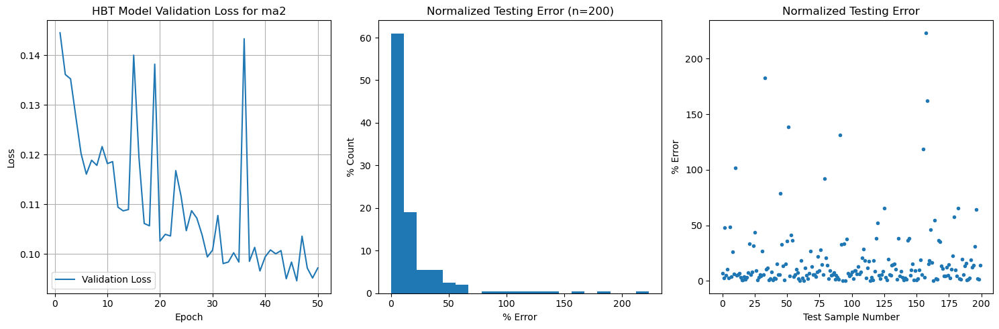

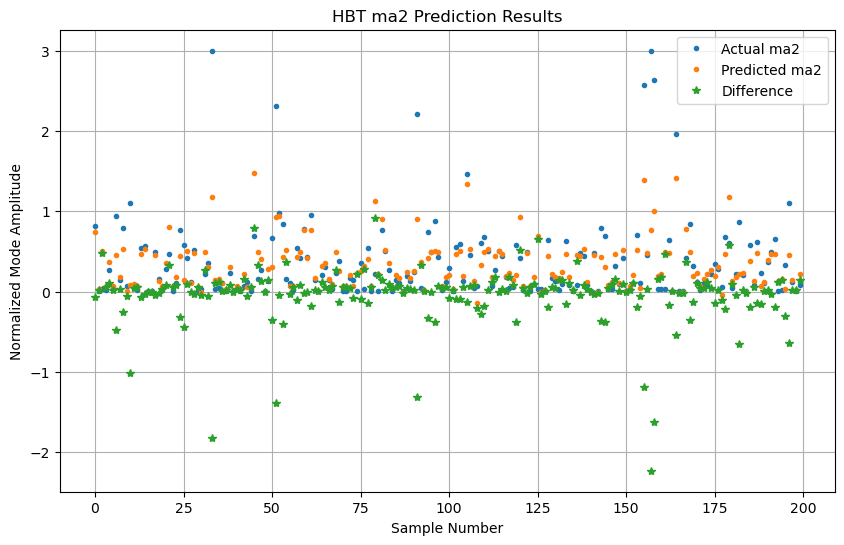

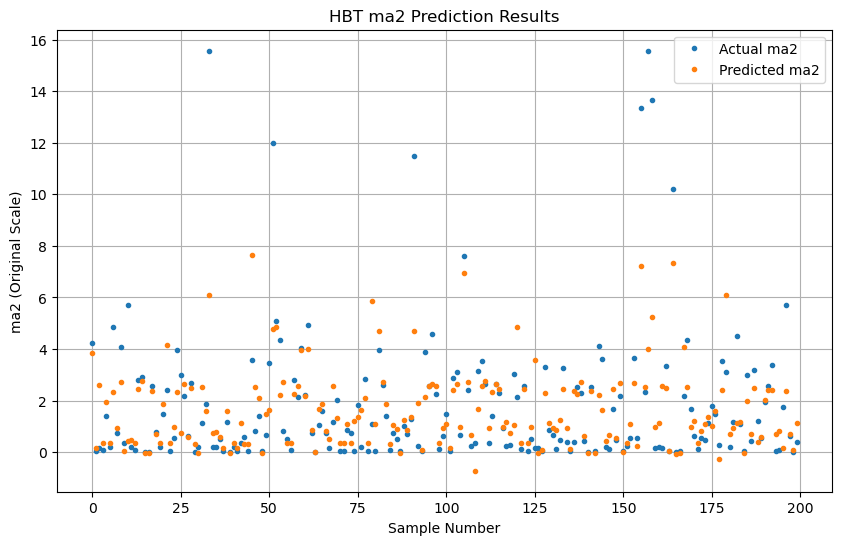

Maximum actual mode amplitude (normalized): 3.00
Maximum predicted mode amplitude (normalized): 1.47
Mean absolute percentage error: 18.12%


In [11]:
# Evaluate the model on test data
predictions = Model.predict(testing_inputs)

# Calculate prediction errors
prediction_errors = np.abs(testing_labels - predictions[:, 0]) * 100

# Create visualization plots
fig, axes = plt.subplots(figsize=(15, 5), ncols=3, nrows=1)

# Plot 1: Training History
axes[0].plot(range(1, len(history.history['val_loss']) + 1), 
             history.history['val_loss'], 
             label='Validation Loss')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title(f'HBT Model Validation Loss for {selected_data_type}')
axes[0].legend()
axes[0].grid(True)

# Plot 2: Error Distribution
weights = np.ones_like(prediction_errors) / len(prediction_errors) * 100
axes[1].hist(prediction_errors, 20, weights=weights)
axes[1].set_xlabel('% Error')
axes[1].set_ylabel('% Count')
axes[1].set_title('Normalized Testing Error (n=200)')

# Plot 3: Error by Sample
axes[2].plot(prediction_errors, '.')
axes[2].set_xlabel('Test Sample Number')
axes[2].set_ylabel('% Error')
axes[2].set_title('Normalized Testing Error')
plt.tight_layout()
plt.show()

# Plot 4: Actual vs Predicted Values
plt.figure(figsize=(10, 6))
plt.plot(testing_labels, '.', label=f'Actual {selected_data_type}')
plt.plot(predictions[:, 0], '.', label=f'Predicted {selected_data_type}')
plt.plot(-(testing_labels - predictions[:, 0]), '*', label='Difference')
plt.xlabel('Sample Number')
plt.ylabel('Normalized Mode Amplitude')
plt.title(f'HBT {selected_data_type} Prediction Results')
plt.legend()
plt.grid(True)
plt.show()

# Plot original scale predictions
plt.figure(figsize=(10, 6))
plt.plot(testing_labels * ma_norm, '.', label=f'Actual {selected_data_type}')
plt.plot(predictions[:, 0] * ma_norm, '.', label=f'Predicted {selected_data_type}')
plt.xlabel('Sample Number')
plt.ylabel(f'{selected_data_type} (Original Scale)')
plt.title(f'HBT {selected_data_type} Prediction Results')
plt.legend()
plt.grid(True)
plt.show()

print(f"Maximum actual mode amplitude (normalized): {np.max(np.abs(testing_labels)):.2f}")
print(f"Maximum predicted mode amplitude (normalized): {np.max(np.abs(predictions[:, 0])):.2f}")
print(f"Mean absolute percentage error: {np.mean(prediction_errors):.2f}%")

5.191251621246337
Shot 119671: Camera frames=800, HBT frames=800, Time frames=800
Shape of reserved_shot_cut_2d: (800, 32, 32)
Shape of camera_data: (800, 32, 32)
Input data shape: (800, 32, 32, 1)
Model output shape: (None, 1)


Predictions shape: (800,)


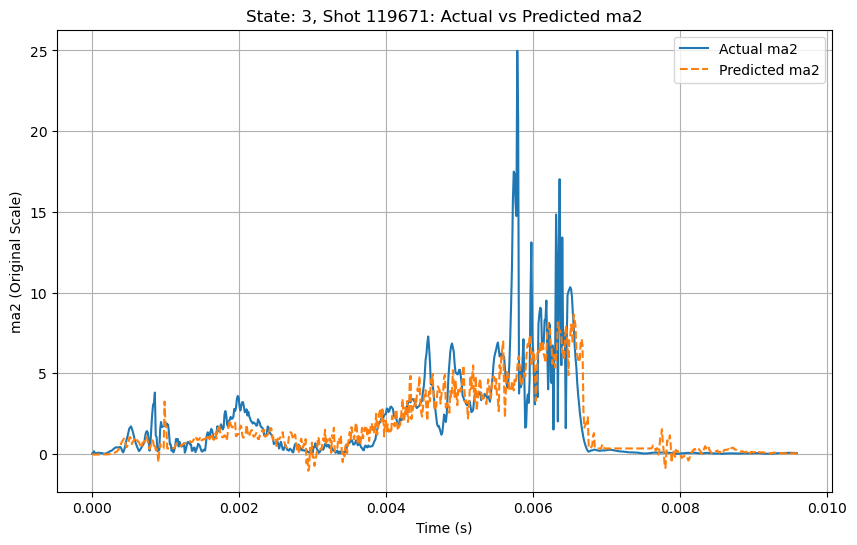

Shot 119671 - Mean absolute percentage error: 16.71%
Shot 119671 - Max actual ma2: 24.98
Shot 119671 - Max predicted ma2: 8.65


In [12]:
print(ma_norm)
def plot_RESERVED_SHOT_predictions(shot, shot_list, cut_training_data_2d, reserved_shot_cut_2d, hbt_dataType, hbt_time_data, model, ma_norm):
    """Plot actual vs predicted Mode 2 amplitude for the reserved shot."""
    if reserved_shot_cut_2d is None:
        print(f"No data available for reserved shot {shot}. No plot generated.")
        return
    
    shot_idx = shot_list.index(shot)
    camera_data = reserved_shot_cut_2d
    hbt_data = hbt_dataType[shot_idx][:, 0]
    time_data = hbt_time_data[shot_idx]

    print(f"Shot {shot}: Camera frames={len(camera_data)}, HBT frames={len(hbt_data)}, Time frames={len(time_data)}")
    print(f"Shape of reserved_shot_cut_2d: {reserved_shot_cut_2d.shape}")
    print(f"Shape of camera_data: {np.array(camera_data).shape}")

    if len(camera_data) == 0:
        print(f"No camera data for shot {shot}. No plot generated.")
        return
    
    if len(camera_data) != len(hbt_data):
        print(f"Warning: Camera data ({len(camera_data)} frames) does not match HBT data ({len(hbt_data)} frames)")

    input_data = np.array(camera_data).reshape(-1, 32, 32, 1)
    print(f"Input data shape: {input_data.shape}")
    print(f"Model output shape: {model.output_shape}")

    predictions = []
    batch_size = 100
    for i in range(0, len(input_data), batch_size):
        batch = input_data[i:i+batch_size]
        batch_pred = model.predict(batch, verbose=0)[:, 0] * ma_norm
        predictions.extend(batch_pred)
    predictions = np.array(predictions)
    print(f"Predictions shape: {predictions.shape}")

    # Rest of the plotting code...
    
    # Plot actual vs predicted using time data
    plt.figure(figsize=(10, 6))
    plt.plot(time_data, hbt_data, label=f'Actual {selected_data_type}')
    plt.plot(time_data, predictions, '--', label=f'Predicted {selected_data_type}')
    plt.xlabel('Time (s)')  # Assuming time is in seconds; adjust if needed
    plt.ylabel(f'{selected_data_type} (Original Scale)')
    plt.title(f'State: {state}, Shot {shot}: Actual vs Predicted {selected_data_type}')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Print metrics
    prediction_errors = np.abs(hbt_data - predictions) / ma_norm * 100
    print(f"Shot {shot} - Mean absolute percentage error: {np.mean(prediction_errors):.2f}%")
    print(f"Shot {shot} - Max actual {selected_data_type}: {np.max(np.abs(hbt_data)):.2f}")
    print(f"Shot {shot} - Max predicted {selected_data_type}: {np.max(np.abs(predictions)):.2f}")

    return predictions

reserved_predictions = plot_RESERVED_SHOT_predictions(
    RESERVED_SHOT, shot_list, cut_training_data_2D, reserved_shot_cut_2d, hbt_dataType, hbt_time_data, william_model, ma_norm
)

In [13]:
# Save true ma2 data, predictions, and time data for reserved shot
time_data = hbt_time_data[shot_list.index(RESERVED_SHOT)]

print(f"Untrimmed: Saving results for state {state}, shot {RESERVED_SHOT}")
print(f"True data defined: {'hbt_dataType' in locals()}, {'shot_list' in locals()}, {'RESERVED_SHOT' in locals()}")
print(f"Predictions defined: {'predictions' in locals()}, shape: {reserved_predictions.shape if 'predictions' in locals() else 'N/A'}")
print(f"Time data defined: {'hbt_time_data' in locals()}, shape: {hbt_time_data[shot_list.index(RESERVED_SHOT)].shape if 'hbt_time_data' in locals() else 'N/A'}")
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_true.npy', hbt_dataType[shot_list.index(RESERVED_SHOT)][:, 0])
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_pred.npy', reserved_predictions)
np.save(f'results_{notebook_type}_state_{state}_{selected_data_type}_time.npy', time_data)
print("Done")

Untrimmed: Saving results for state 3, shot 119671
True data defined: True, True, True
Predictions defined: True, shape: (800,)
Time data defined: True, shape: (800,)
Done
